# COM6101 Group 1 code

## Introduction

We want to start a pizza restaurant in Hong Kong, hence there are the three main objectives of this project:
1. To find the best location to open a pizza restaurant in Hong Kong
2. How should we price our pizza
3. Which aspect should be focused on to retain or attract customers


## Data Sources

Here are the data we need to prepare for our project:
* 2021 Hong Kong Census data (source: https://data.gov.hk/en-data/dataset/hk-censtatd-census_geo-2021-population-census-by-ssg )
* Hong Kong Restaurant License (source: https://data.gov.hk/en-data/dataset/hk-fehd-fehdlmis-restaurant-licences )
* Hong Kong Geocommunity (source: https://data.gov.hk/en-data/dataset/hk-landsd-openmap-development-hkms-digital-geocom/resource/0931b84b-f1c8-409f-9cd4-176a26645db0 ) 
* Pizza sales record from Kaggle (source: https://www.kaggle.com/datasets/shilongzhuang/pizza-sales  )
* 10000 restaurant review from Kaggle (source: https://www.kaggle.com/datasets/joebeachcapital/restaurant-reviews)

## Data Processing

## 2021 HK Census Data

In [32]:
# transform HK Census Data from espg 2326 (HK coordinate system) to 4326 (WGS84)
import geopandas as gpd
import pandas as pd
from shapely.geometry import Polygon

gpdf = 'data/2021_census/LSUG_21C.json'

class transform_LSUG:
    def __init__(self, gpdf, epsg=2326, output_path='data/2021_census'):
        self.output_path = output_path
        self.gpdf = gpd.read_file(gpdf)
        self.epsg = epsg
    def transform(self):
        self.gpdf = self.gpdf.set_crs(epsg=self.epsg, allow_override=True)
        self.gpdf = self.gpdf.to_crs(epsg=4326)
        self.gpdf['name'] = self.gpdf.index
        self.gpdf = self.gpdf.explode()
        self.gpdf['geometry'] = self.gpdf['geometry'].apply(lambda x: Polygon(x.exterior.coords))
        return self.gpdf
    def export(self):
        self.transform()
        return self.gpdf.to_file(self.output_path + '/LSUG_21C_lat_lng.json', driver='GeoJSON')

transform_LSUG(gpdf).export()

C:\Users\kwokt\AppData\Local\Temp\ipykernel_25024\2574490307.py:17: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  self.gpdf = self.gpdf.explode()


Transform the HK Census data to preferred attributes:

In [33]:
import geopandas as gpd

LSUG = gpd.read_file('data/2021_census/LSUG_21C_lat_lng.json')
LSUG_copy = LSUG.copy()
LSUG_copy

,level_0,level_1,age_1,age_2,age_3,age_4,age_5,born_chi,born_else,born_hk,...,wp_n,wp_o,wp_p,wp_q,wp_r,wp_s,wp_se,wp_t,name,geometry
0,0,0,257,141,472,461,224,259,362,934,...,-,91,63,154,123,141,130,-,0,"POLYGON ((114.12554 22.28403, 114.12554 22.284..."
1,0,1,257,141,472,461,224,259,362,934,...,-,91,63,154,123,141,130,-,0,"POLYGON ((114.11267 22.28621, 114.11267 22.286..."
2,0,2,257,141,472,461,224,259,362,934,...,-,91,63,154,123,141,130,-,0,"POLYGON ((114.11683 22.28633, 114.11683 22.286..."
3,1,0,199,42,527,510,253,321,290,920,...,11,56,284,199,135,153,47,-,1,"POLYGON ((114.12668 22.28306, 114.12654 22.283..."
4,2,0,276,163,760,664,146,470,278,1261,...,62,36,250,187,203,101,50,25,2,"POLYGON ((114.12804 22.28329, 114.12791 22.283..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1962,1743,0,153,159,689,686,339,400,108,1518,...,16,56,53,227,340,158,82,14,1743,"POLYGON ((114.04878 22.28376, 114.04878 22.283..."
1963,1743,1,153,159,689,686,339,400,108,1518,...,16,56,53,227,340,158,82,14,1743,"POLYGON ((114.04416 22.28705, 114.04416 22.287..."
1964,1744,0,102,157,636,748,440,343,118,1622,...,45,22,90,284,186,109,131,31,1744,"POLYGON ((114.03342 22.29006, 114.03335 22.290..."
1965,1744,1,102,157,636,748,440,343,118,1622,...,45,22,90,284,186,109,131,31,1744,"POLYGON ((114.04349 22.29217, 114.04346 22.292..."


In [34]:
'''
calculate the mean of age in each subnit group
age_1 represents number of people in age 0-14, age_2 represents number of people in age 15-24,
age_3 represents number of people in age 25-44, age_4 represents number of people in age 45 - 64
age_5 represents number of people in age 65 or above, assume it is 65-84
Method of finding the mean of age in each subunit group:
1. multiply the number of people in each age group by the middle value of the age group
2. sum up the result of each age group
3. divide the sum by the total number of people in the subunit group
'''
# input all '-' to 0 first
LSUG_copy[['age_1', 'age_2', 'age_3', 'age_4', 'age_5']] = LSUG_copy[['age_1', 'age_2', 'age_3', 'age_4', 'age_5']].replace('-', '0')

# change dtype from int to float
LSUG_copy[['age_1', 'age_2', 'age_3', 'age_4', 'age_5']] = LSUG_copy[['age_1', 'age_2', 'age_3', 'age_4', 'age_5']].astype('float')

LSUG_copy['mean_age'] = LSUG_copy['age_1'] * 7 + LSUG_copy['age_2'] * 19.5 + LSUG_copy['age_3'] * 34.5 + LSUG_copy['age_4'] * 54.5 + LSUG_copy['age_5'] * 74.5
# median age is the age of the middle person in the subunit group, find the median age of each subunit group first by dividing the total number of people in the subunit group by 2
LSUG_copy['median_age'] = (LSUG_copy['age_1'] + LSUG_copy['age_2'] + LSUG_copy['age_3'] + LSUG_copy['age_4'] + LSUG_copy['age_5']) / 2
LSUG_copy['median_age'] = LSUG_copy['median_age'].astype('int')

# look the median is situated in which age group, then find the middle value of the age group
LSUG_copy.loc[LSUG_copy['median_age'] <= LSUG_copy['age_1'], 'median_age'] = 7 # age_1
LSUG_copy.loc[(LSUG_copy['median_age'] > LSUG_copy['age_1']) & (LSUG_copy['median_age'] <= LSUG_copy['age_1'] + LSUG_copy['age_2']), 'median_age'] = 20 # age_2
LSUG_copy.loc[(LSUG_copy['median_age'] > LSUG_copy['age_1'] + LSUG_copy['age_2']) & (LSUG_copy['median_age'] <= LSUG_copy['age_1'] + LSUG_copy['age_2'] + LSUG_copy['age_3']), 'median_age'] = 35 # age_3
LSUG_copy.loc[(LSUG_copy['median_age'] > LSUG_copy['age_1'] + LSUG_copy['age_2'] + LSUG_copy['age_3']) & (LSUG_copy['median_age'] <= LSUG_copy['age_1'] + LSUG_copy['age_2'] + LSUG_copy['age_3'] + LSUG_copy['age_4']), 'median_age'] = 55 # age_4
LSUG_copy.loc[(LSUG_copy['median_age'] > LSUG_copy['age_1'] + LSUG_copy['age_2'] + LSUG_copy['age_3'] + LSUG_copy['age_4']) & (LSUG_copy['median_age'] <= LSUG_copy['age_1'] + LSUG_copy['age_2'] + LSUG_copy['age_3'] + LSUG_copy['age_4'] + LSUG_copy['age_5']), 'median_age'] = 75 # age_5

LSUG_copy['mean_age'] = LSUG_copy['mean_age'] / (LSUG_copy['age_1'] + LSUG_copy['age_2'] + LSUG_copy['age_3'] + LSUG_copy['age_4'] + LSUG_copy['age_5'])

# reduce the effect of outliers of mean age
LSUG_copy['mean_median_age'] = LSUG_copy['mean_age'] * 0.5 + LSUG_copy['median_age'] * 0.5
LSUG_copy[['mean_age', 'median_age', 'mean_median_age']].describe()

,mean_age,median_age,mean_median_age
count,1967.000000,1967.000000,1967.000000
mean,43.942314,45.810880,44.876597
std,3.833918,10.043943,6.564367
min,29.875228,20.000000,24.937614
25%,41.319854,35.000000,38.249683
50%,43.811919,55.000000,48.813066
75%,46.581901,55.000000,50.781901
max,65.826733,75.000000,70.413366


In [35]:
# total population is the sum of age_1, age_2, age_3, age_4, age_5
LSUG_copy['total_population'] = LSUG_copy['age_1'] + LSUG_copy['age_2'] + LSUG_copy['age_3'] + LSUG_copy['age_4'] + LSUG_copy['age_5']
LSUG_copy['total_population'].describe()

count     1967.000000
mean      4083.156075
std       4687.779911
min       1000.000000
25%       1595.500000
50%       2208.000000
75%       4311.500000
max      39767.000000
Name: total_population, dtype: float64

In [36]:
# median of income is in ma_hh
LSUG_copy['median_hs_income'] = LSUG_copy['ma_hh']
LSUG_copy['median_hs_income'].value_counts()

median_hs_income
63820    57
47850    43
17000    28
47070    19
20040    17
         ..
40560     1
86240     1
89870     1
62140     1
82290     1
Name: count, Length: 1286, dtype: int64

In [37]:
# mean household size: total_population / dh
# convert dh '-' to 1
LSUG_copy['dh'] = LSUG_copy['dh'].replace('-', '1')
LSUG_copy['dh'] = LSUG_copy['dh'].astype('float')
LSUG_copy['mean_hs_size'] = LSUG_copy['total_population'] / LSUG_copy['dh']
# for rows where 'dh' = 1, set mean_hs_size = 1
LSUG_copy.loc[LSUG_copy['dh'] == 1, 'mean_hs_size'] = 1
# find row where 'mean_hs_size' > 10, set mean_hs_size = 10
LSUG_copy.loc[LSUG_copy['mean_hs_size'] > 10, 'mean_hs_size'] = 10
LSUG_copy['mean_hs_size'].describe()

count    1967.000000
mean        2.854699
std         0.592379
min         1.000000
25%         2.484750
50%         2.782135
75%         3.095936
max        10.000000
Name: mean_hs_size, dtype: float64

In [38]:
# % in labour force: t_wp / total_population
# transform '-' to 0
LSUG_copy['t_wp'] = LSUG_copy['t_wp'].replace('-', '0')
# transform dtype from str to float
LSUG_copy['t_wp'] = LSUG_copy['t_wp'].astype('float')
LSUG_copy['labour_force_percent'] = LSUG_copy['t_wp'] / LSUG_copy['total_population']
LSUG_copy['labour_force_percent'].describe()

count    1967.000000
mean        0.510765
std         0.067052
min         0.000000
25%         0.471007
50%         0.515250
75%         0.555184
max         0.785621
Name: labour_force_percent, dtype: float64

In [39]:
# % of Chinese: ethn_chi / total_population
# transform '-' to 0
LSUG_copy['ethn_chi'] = LSUG_copy['ethn_chi'].replace('-', '0')
# transform dtype from str to float
LSUG_copy['ethn_chi'] = LSUG_copy['ethn_chi'].astype('float')
LSUG_copy['chinese_percent'] = LSUG_copy['ethn_chi'] / LSUG_copy['total_population']
LSUG_copy['chinese_percent'].describe()

count    1967.000000
mean        0.863458
std         0.133182
min         0.263777
25%         0.817618
50%         0.915462
75%         0.955576
max         1.000000
Name: chinese_percent, dtype: float64

In [40]:
# % of Male: pop_m / total_population
# transform '-' to 0
LSUG_copy['pop_m'] = LSUG_copy['pop_m'].replace('-', '0')
# transform dtype from str to float
LSUG_copy['pop_m'] = LSUG_copy['pop_m'].astype('float')
LSUG_copy['pop_m_percent'] = LSUG_copy['pop_m'] / LSUG_copy['total_population']
LSUG_copy['pop_m_percent'].describe()

count    1967.000000
mean        0.452532
std         0.044367
min         0.298851
25%         0.428301
50%         0.454599
75%         0.476916
max         0.888457
Name: pop_m_percent, dtype: float64

In [41]:
# % of owner owned property: ten_oc / LSUG_copy['dh']
# transform '-' to 0
LSUG_copy['ten_oc'] = LSUG_copy['ten_oc'].replace('-', '0')
# transform dtype from str to float
LSUG_copy['ten_oc'] = LSUG_copy['ten_oc'].astype('float')
LSUG_copy['ten_oc_percent'] = LSUG_copy['ten_oc'] / LSUG_copy['dh']
LSUG_copy['ten_oc_percent'].describe()

count    1967.000000
mean        0.532857
std         0.246771
min         0.000000
25%         0.410584
50%         0.550868
75%         0.721917
max         1.000000
Name: ten_oc_percent, dtype: float64

In [42]:
# rent to income ratio: dmr_ir
# transform from object to float
import pandas as pd
LSUG_copy['rent_to_income_ratio'] = pd.to_numeric(LSUG_copy['dmr_ir'], errors='coerce')
LSUG_copy.loc[(LSUG_copy['rent_to_income_ratio'] > 100), 'rent_to_income_ratio'] = 100
LSUG_copy['rent_to_income_ratio'] = LSUG_copy['rent_to_income_ratio'] / 100
LSUG_copy['rent_to_income_ratio'].describe()

count    1900.000000
mean        0.283352
std         0.117332
min         0.020000
25%         0.219000
50%         0.289000
75%         0.346000
max         1.000000
Name: rent_to_income_ratio, dtype: float64

In [50]:
# export used columns to json file, rename 'name' to 'census_subnit' first
LSUG_copy = LSUG_copy.rename(columns={'name': 'census_subnit'})
# used columns: 'subunit', 'mean_median_age', 'median_hs_income', 'mean_hs_size', 'labour_force_percent', 'chinese_percent', 'pop_m_percent', 'ten_oc_percent', 'rent_to_income_ratio', 'geometry'
LSUG_copy[['census_subnit', 'mean_median_age', 'median_hs_income', 'mean_hs_size', 'labour_force_percent', 'chinese_percent', 'pop_m_percent', 'ten_oc_percent', 'rent_to_income_ratio', 'geometry']].to_file('data/2021_census/LSUG_21C_cleaned.json', driver='GeoJSON')

In [51]:
# preview the cleaned data
LSUG_copy[['census_subnit', 'mean_median_age', 'median_hs_income', 'mean_hs_size', 'labour_force_percent', 'chinese_percent', 'pop_m_percent', 'ten_oc_percent', 'rent_to_income_ratio', 'geometry']].head()

,census_subnit,mean_median_age,median_hs_income,mean_hs_size,labour_force_percent,chinese_percent,pop_m_percent,ten_oc_percent,rent_to_income_ratio,geometry
0,0,37.643087,51370,3.031189,0.506109,0.779421,0.518971,0.670565,0.273,"POLYGON ((114.12554 22.28403, 114.12554 22.284..."
1,0,37.643087,51370,3.031189,0.506109,0.779421,0.518971,0.670565,0.273,"POLYGON ((114.11267 22.28621, 114.11267 22.286..."
2,0,37.643087,51370,3.031189,0.506109,0.779421,0.518971,0.670565,0.273,"POLYGON ((114.11683 22.28633, 114.11683 22.286..."
3,1,39.393207,55680,2.244868,0.640758,0.835402,0.430438,0.478006,0.295,"POLYGON ((114.12668 22.28306, 114.12654 22.283..."
4,2,37.011075,50040,2.272624,0.578895,0.837730,0.446491,0.573529,0.252,"POLYGON ((114.12804 22.28329, 114.12791 22.283..."


## Restaurant License Data

In [44]:
# transfer xml to csv for restaurant licence data
import os
import xml.etree.ElementTree as Xet
import pandas as pd

folder_path = 'data/restaurant_license/xml'
output_folder = 'data/restaurant_license/csv'

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

cols = ["TYPE", "DIST", "LICNO", "SS", "ADR", "INFO", "EXPDATE"]

# Iterate through all XML files in the folder_path
for filename in os.listdir(folder_path):
    if filename.endswith(".XML"):
        xml_file = os.path.join(folder_path, filename)
        csv_file = os.path.join(output_folder, os.path.splitext(filename)[0][1:] + ".csv")
        rows = []
        xmlparse = Xet.parse(xml_file)
        # The data are stored in the <LPS> tag
        root = xmlparse.getroot().find("LPS")

        for i in root:
            
            TYPE = i.find("TYPE").text
            DIST = i.find("DIST").text
            LICNO = i.find("LICNO").text
            SS = i.find("SS").text
            ADR = i.find("ADR").text
            INFO = i.find("INFO").text
            EXPDATE = i.find("EXPDATE").text
            rows.append({"TYPE": TYPE, "DIST": DIST, "LICNO": LICNO, 
                         "SS": SS, "ADR": ADR, "INFO": INFO, "EXPDATE": EXPDATE})

        df = pd.DataFrame(rows, columns=cols)
        df.to_csv(csv_file, index=False)
        print(f"Converted {filename} to {os.path.splitext(filename)[0][1:] + '.csv'}")

print("XML to CSV conversion completed.")

Converted 20230101-1033-LP_Restaurants_EN.XML to 0230101-1033-LP_Restaurants_EN.csv
Converted 20240101-1050-LP_Restaurants_EN.XML to 0240101-1050-LP_Restaurants_EN.csv
XML to CSV conversion completed.


In [3]:
# geocoding for restaurant licence data
import os
import pandas as pd
import geocoder

API_KEY = "AAPKae2a40767592460cb54f98756c8579053czHfV2nsyRUZFSbUVLCBS1poOYx5GBSCwaj9nhJL3yjZggs94pMrjDgZtoZhg-0"

folder_path = 'data/restaurant_license/csv'
output_folder = 'data/restaurant_license/geo'

# create output folder if not exist
if not os.path.exists(output_folder):
    os.mkdir(output_folder)

# Iterate through all CSV files in the folder_path
# columns: TYPE, DIST, LICNO, SS, ADR, INFO, EXPDATE
# column ADR is the address

# use old csv file to reference if address already exist
old_file = 'data/restaurant_license/geo/geo_full.csv'

for filename in os.listdir(folder_path):
    # only retrive csv file and file not end with .finished.csv
    if filename.endswith(".csv") and not filename.endswith(".finished.csv"):
        print(f'start converting {filename} to geo location')
        csv_file = os.path.join(folder_path, filename)
        geo_file = os.path.join(output_folder, filename + ".geo.csv")
        # transform ADR to upper case first
        df = pd.read_csv(csv_file, encoding='utf-8')
        df['ADR'] = df['ADR'].str.upper()
        # add new columns for geo location
        lat = []
        lng = []
        df.reset_index(inplace=True, drop=True)
        # check if df['ADR'] == old_df['ADR']
        old_df = pd.read_csv(old_file, encoding='utf-8')
        for i in range(len(df)):
            if df['ADR'][i] in old_df['ADR'].values:
                # if address already exist in old_df, then use the geo location in old_df
                lat.append(old_df.loc[old_df['ADR'] == df['ADR'][i], 'lat'].iloc[0])
                lng.append(old_df.loc[old_df['ADR'] == df['ADR'][i], 'lng'].iloc[0])
                print(f"Converted {df['ADR'][i]} to {old_df.loc[old_df['ADR'] == df['ADR'][i], 'lat'].iloc[0]}, {old_df.loc[old_df['ADR'] == df['ADR'][i], 'lng'].iloc[0]}, by referencing old csv file")
                continue
            g = geocoder.arcgis(df['ADR'][i], key = API_KEY)
            lat.append(g.lat)
            lng.append(g.lng)
            print(f"Converted {df['ADR'][i]} to {g.lat}, {g.lng}")
        df['lat'] = lat
        df['lng'] = lng
        df.to_csv(geo_file, index=False)
        # rename the original csv file to finished
        os.rename(csv_file, os.path.join(folder_path, filename + "_finished.csv"))
        print(f"Converted {filename} to {filename}")
print("All csv files converted to geo location")

start converting 0230101-1033-LP_Restaurants_EN.csv_finished.csv to geo location
Converted JUMBO FLOATING RESTAURANT, ABERDEEN TYPHOON SHELTER, SHUM WAN, WONG CHUK HANG, SOUTHERN, HONG KONG to 22.2457973, 114.155256, by referencing old csv file
Converted TAI PAK FLOATING RESTAURANT, SHUM WAN, WONG CHUK HANG, ABERDEEN, SOUTHERN, HONG KONG to 22.24329000000006, 114.16203000000009, by referencing old csv file
Converted MAN LOK (VESSEL NO. A5583) (PORTION OF UPPER DECK & PORTIONS OF MAIN DECK OF THE VESSEL) BERTHING AT NORTH POINT (EAST) PASSENGER FERRY PIER, NORTH POINT, HONG KONG to 22.2884683, 114.192803, by referencing old csv file
Converted MAN ON (VESSEL NO. A10363) (PORTION OF UPPER DECK & PORTIONS OF MAIN DECK OF THE VESSEL) BERTHING AT NORTH POINT (EAST) PASSENGER FERRY PIER, NORTH POINT, HONG KONG to 22.2884683, 114.192803, by referencing old csv file
Converted MAN KIM (VESSEL NO. A2463) (PORTION OF UPPER DECK & PORTIONS OF MAIN DECK OF THE VESSEL) BERTHING AT NORTH POINT (EAST) 

Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP NO. 2107, LEVEL 2, MOSTOWN, NO. 18 ON LUK STREET, MA ON SHAN, SHA TIN, NEW TERRITORIES to None, None
Converted STALL NO.28, G/F, HENG ON MARKET, HENG ON ESTATE, NO.1 HANG KAM STREET, MA ON SHAN, SHA TIN, NEW TERRITORIES to 22.416747679196646, 114.22796107559832, by referencing old csv file
Converted MAJOR PORTION OF COOKED FOOD STALL NOS. 1, 2, 3 & 4 AND THE OUTSIDE SEATING ACCOMODATION AT SHOP FRONT, SUN TIN WAI SHOPPING CENTRE, SUN TIN WAI ESTATE, NO. 29 SHA TIN TAU ROAD, SHA TIN, NEW TERRITORIES to nan, nan, by referencing old csv file
Converted SHOP 152, 1/F,  KINGS WING PLAZA I, NO. 3 ON KWAN STREET, SHEK MUN, SHA TIN, NEW TERRITORIES to 22.38780861365973, 114.20778533174088, by referencing old csv file


Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP G11, G/F, KINGS WING PLAZA 2, 1 ON KWAN STREET, SHEK MUN, SHA TIN, NEW TERRITORIES to None, None
Converted SHOP ST-01-008, PORTIONS OF LEVEL 1, NEW TOWN PLAZA III, 2-8 SHATIN CENTRE STREET, SHA TIN, NEW TERRITORIES to 22.3792520316221, 114.18791100112156, by referencing old csv file
Converted SHOP A238, LEVEL 2, NEW TOWN PLAZA, PHASE III, SHA TIN, NEW TERRITORIES to 22.38024000000007, 114.18761000000006, by referencing old csv file
Converted SHOP NO.6, G/F, KAM SHAN BUILDING,  1-35 TAI WAI ROAD, SHA TIN, NEW TERRITORIES to 22.37582626397527, 114.17709164050274, by referencing old csv file
Converted SHOP NO. A237, LEVEL 2, NEW TOWN PLAZA (PHASE III), SHA TIN, NEW TERRITORIES to 22.38024000000007, 114.18761000000006, by referencing old csv file
Converted SHOP NO. A236, LEVEL 2, NEW TOWN PLAZA PHASE III, SHA TIN, NEW TERRITORIES to 22.38024000000007, 114.18761000000006, by referencing old csv file
Converted SHOP ST-01-005, PORTIONS OF LEVEL 1, NEW TOWN PLAZA III, 2-8 SHATIN

Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted LEVEL 1, COFFEE SHOP & SITTING LOUNGE AND THE OUTSIDE SEATING ACCOMMODATION AT SIDE, ROYAL PARK HOTEL, 8 PAK HOK TING STREET, STTL 183, SHA TIN, NEW TERRITORIES to None, None
Converted SHOP NO. 251-252, 2/F, WO CHE COMMERCIAL CENTRE, NO. 3 TAK HAU STREET, SHA TIN, NEW TERRITORIES to 22.387412820191784, 114.19540249472271, by referencing old csv file
Converted SHOP NO. 2129, LEVEL 2, MOSTOWN, NO. 18 ON LUK STREET, MA ON SHAN, SHA TIN, NEW TERRITORIES to 22.424533712875345, 114.23240214317684, by referencing old csv file
Converted SHOP NO. F3, 1/F, MEI LAM SHOPPING CENTRE, MEI LAM ESTATE, 30 MEI TIN ROAD, TAI WAI, SHA TIN, NEW TERRITORIES to 22.37820546719162, 114.17637976546604, by referencing old csv file
Converted UNIT RT-G01, G/F, BUILDING 17W, HONG KONG SCIENCE PARK, PAK SHEK KOK, NEW TERRITORIES to 22.42673182507359, 114.2086951873306, by referencing old csv file
Converted SHOP D, G/F, JAT MIN CHUEN, 7 JAT MIN CHUEN STREET, SHA TIN, NEW TERRITORIES to 22.376471921976872, 

Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP NO. 117A, 1/F, FORTUNE CITY ONE, CITY ONE, SHA TIN, NEW TERRITORIES to None, None
Converted SHOP NOS. 3078 AND 3079, LEVEL 3 , LUCKY PLAZA, 1-15 WANG POK STREET, SHA TIN, NEW TERRITORIES to 22.383416831671923, 114.19009532508908, by referencing old csv file
Converted MAJOR PORTION OF SHOP 50, 3/F, SHA TIN PLAZA SHOPPING ARCADE, 21-27 SHA TIN CENTRE STREET, SHA TIN, NEW TERRITORIES to 22.38310000000007, 114.18941000000008, by referencing old csv file
Converted SHOP G08A, G/F, WE GO MALL, 16 PO TAI STREET, MA ON SHAN, NEW TERRITORIES to 22.41412012018921, 114.22391278400266, by referencing old csv file
Converted SHOP NO. 205, 2/F, SHUI CHUEN O PLAZA, SHUI CHUEN O ESTATE, SHA TIN, NEW TERRITORIES to 22.37383220920984, 114.1970856646994, by referencing old csv file
Converted SHOP G21, G38, G39 & G40, G/F, KINGS WING PLAZA 2, 1 ON KWAN STREET, SHEK MUN, SHA TIN, NEW TERRITORIES to 22.388932668785078, 114.20878076656196, by referencing old csv file
Converted SHOP NOS. 3093 & 3

Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP NO. 312, 3/F, HENG ON SHOPPING CENTRE, HENG ON ESTATE,  MA ON SHAN, SHA TIN, NEW TERRITORIES to None, None
Converted SHOP NOS. 3091-3092, LEVEL 3, LUCKY PLAZA, 1-15 WANG POK STREET, SHA TIN, NEW TERRITORIES to 22.383416831671923, 114.19009532508909


Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP 3090, LEVEL 3, LUCKY PLAZA, 1-15 WANG POK STREET, SHA TIN, NEW TERRITORIES to None, None
Converted UNIT S003C, G/F, BUILDING 1E, PHASE ONE, HONG KONG SCIENCE PARK, PAK SHEK KOK, SHA TIN, NEW TERRITORIES to 22.36641827400007, 114.17238419500006
Converted SHOP G17 & G43, G/F, KINGS WING PLAZA 2, NO. 1 ON KWAN STREET, SHA TIN, NEW TERRITORIES to 22.388932668785078, 114.20878076656196, by referencing old csv file


Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted PORTION OF SHOP B AND PORTION OF SHOP C ON G/F, TAI ON BUILDING, NOS. 41, 45, 47, & 51 TSUEN NAM ROAD, TAI WAI, SHA TIN, NEW TERRITORIES to None, None
Converted SHOP 4, L1 FLOOR, HORIZON SUITE HOTEL, NO. 29 ON CHUN STREET, MA ON SHAN, SHA TIN, NEW TERRITORIES to 22.42641582732388, 114.22741616807292
Converted SHOP 6A AND 6B, GROUND FLOOR, CHUNG ON SHOPPING CENTRE, CHUNG ON ESTATE, MA ON SHAN, SHA TIN, NEW TERRITORIES to 22.421762404228446, 114.22658795222014
Converted SHOP G18, G/F, KINGS WING PLAZA 2, NO. 1 ON KWAN STREET,  SHEK MUN, SHA TIN, NEW TERRITORIES to 22.388932668785074, 114.20878076656197
Converted SHOP A327, LEVEL 3, NEW TOWN PLAZA PHASE III, SHA TIN, NEW TERRITORIES to 22.38024000000007, 114.18761000000006
Converted SHOP NO. G97-G100, G/F, FORTUNE CITY ONE, SHA TIN, NEW TERRITORIES to 22.385895695717025, 114.20399293964914


Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP 8 & 9, 1/F, COMMERCIAL BLOCK 2, (FORMING PART  OF COMMERCIAL COMPLEX), (ALSO KNOWN AS KWONG YUEN SHOPPING CENTRE), KWONG YUEN ESTATE, 68 SIU LEK YUEN ROAD, SHA TIN, NEW TERRITORIES to None, None
Converted SHOP NO. 233, 2/F, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, SHA TIN, NEW TERRITORIES to 22.373436164284797, 114.18045370568541
Converted SHOP G22-G30, G/F, PLAZA ASCOT, 1 TSUN KING ROAD, FO TAN, SHA TIN, NEW TERRITORIES to 22.398940283990896, 114.20121308146099
Converted SHOP G-3/48, G/F, MOSTOWN STREET, MA ON SHAN, NEW TERRITORIES to 22.42406000000005, 114.23149, by referencing old csv file
Converted SHOP UNIT 519, 5/F, THE WAI, COMMERCIAL DEVELOPMENT AT TAI WAI STATION, SHA TIN TOWN LOT NO. 520, SHA TIN, NEW TERRITORIES to 22.373154155152463, 114.17852276665087


Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP NO. 227, 2/F, WO CHE COMMERCIAL CENTRE, NO. 3 TAK HAU STREET, SHA TIN, NEW TERRITORIES to None, None


Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP UNIT 520, 5/F, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, SHA TIN, NEW TERRITORIES to None, None
Converted SHOP 218, 2/F , THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, NEW TERRITORIES to 22.373436164284797, 114.18045370568541
Converted UNIT B, G/F, SUI FUNG MANSION, NOS. 1-15 CHIK SHUN STREET, TAI WAI, SHA TIN, NEW TERRITORIES to 22.376056137669863, 114.17745214615832
Converted SHOP UNIT 434, 4/F, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, NEW TERRITORIES to 22.373436164284797, 114.18045370568541
Converted MAJOR PORTION OF SHOP UNIT 335, 3/F, THE WAI, NO. 18 CHE KUNG MIU ROAD, SHA TIN, NEW TERRITORIES to 22.373436164284797, 114.18045370568541


Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP NO. 501, 5/F, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, SHA TIN, NEW TERRITORIES to None, None
Converted UNIT 304, 3/F, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, NEW TERRITORIES to 22.373436164284797, 114.18045370568541


Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP NO. 232, 2/F, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, SHA TIN, NEW TERRITORIES to None, None
Converted SHOP UNIT 305, 3/F, THE WAI, TAI WAI, SHA TIN, NEW TERRITORIES to 22.37582626397527, 114.17709164050274


Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP UNIT 433A, 4/F, THE WAI, TAI WAI, SHA TIN, NEW TERRITORIES to None, None
Converted SHOP UNIT 426A, 4/F, THE WAI, TAI WAI, SHA TIN, NEW TERRITORIES to 22.37582626397527, 114.17709164050274
Converted SHOP UNITS 431-432 AND SEATING AREA OPPOSITE SHOP  UNITS 431-432, LEVEL 4, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, NEW TERRITORIES to 22.373436164284797, 114.18045370568541
Converted SHOP 165, LEVEL 1, PHASE 1, NEW TOWN PLAZA, 18 SHA TIN CENTRE STREET, SHA TIN, NEW TERRITORIES to 22.382111140704765, 114.18818860975477
Converted PORTION OF UNIT 325, 3/F, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, SHA TIN, NEW TERRITORIES to 22.373436164284797, 114.18045370568541
Converted SHOP UNIT 528, 5/F, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, NEW TERRITORIES to 22.373436164284797, 114.18045370568541
Converted SHOP UNIT 527, 5/F, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, NEW TERRITORIES to 22.373436164284797, 114.18045370568541
Converted SHOP UNIT 332, THE WAI, SHA TIN TOWN LOT. NO. 520, SHA TIN

Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted G/F, NO. 17 TSING FUNG STREET, NORTH POINT, HONG KONG to None, None
Converted G/F., NO. 3 LAN FONG ROAD, CAUSEWAY BAY, HONG KONG to 22.278611358384893, 114.18395834704114
Converted GROUND FLOOR & PORTION OF COCKLOFT, NO. 49 JARDINE'S BAZAAR, CAUSEWAY BAY, HONG KONG to 22.279292178470314, 114.18535158698694
Converted SHOP NO. 1 & 2, G/F, HENNING HOUSE, 385-391 HENNESSY ROAD, WAN CHAI, HONG KONG to 22.27918107634372, 114.18008817088793
Converted SHOP KL-3, G/F, MAYSON GARDEN BUILDING, NOS. 62, 64, 66, 70, 72 & 74 HING FAT STREET, NOS. 2A-2E WING HING STREET & NOS. 1A-1B TSING FUNG STREET, NORTH POINT, HONG KONG to 22.284970037771842, 114.19119821590891
Converted 20/F., SUGAR+, 31 SUGAR STREET, CAUSEWAY BAY, HONG KONG to 22.280112431515064, 114.18691062097759
Converted SHOP 3B, 3/F., CAUSEWAY BAY PLAZA 2, NOS. 463-483 LOCKHART ROAD, CAUSEWAY BAY, HONG KONG to 22.280543219428765, 114.18208541077661
Converted 26/F, L'HART, 487-489 LOCKHART ROAD, CAUSEWAY BAY, HONG KONG to 22.28076

In [4]:
# map the restaurant licence data to its relative HK census polygon TPU
import geopandas as gpd
from shapely.geometry import Point
import pandas as pd
import os

class map_census_polygon_restaurant:
    def __init__(self, census_polygon, restaurant_path, output_folder, restaurant_name):
        self.census_polygon = gpd.read_file(census_polygon)
        self.restaurant_path = restaurant_path
        self.restaurant_name = restaurant_name
        self.output_folder = output_folder
    def map(self):
        restaurant = pd.read_csv(self.restaurant_path + self.restaurant_name)
        # if restaurant['lat'] and restaurant['lng'] are contained in census_polygon['geometry'], then the restaurant is in the census polygon
        try:
            restaurant['census_subnit'] = restaurant.apply(lambda row: self.census_polygon[self.census_polygon['geometry'].contains(Point(row['lng'], row['lat']))]['name'].values[0], axis=1) 
        except:
            restaurant['census_subnit'] = restaurant.apply(lambda row: self.census_polygon[self.census_polygon['geometry'].contains(Point(row['lng'], row['lat']))]['name'].values, axis=1)
        # if restaurant['census_subnit'] is a list, then only keep the first element
        restaurant['census_subnit'] = restaurant['census_subnit'].str[0]
        # export the mapped restaurant to csv, named as the file name of the original restaurant csv file to output_folder
        if not os.path.exists(self.output_folder):
            os.makedirs(self.output_folder, exist_ok=True)
        return restaurant.to_csv(self.output_folder + self.restaurant_name.replace('.csv.geo.csv', '') + '_geo_mapped.csv', index=False), print(f"Restaurant {self.restaurant_name} mapped to census polygon")
    
# loop all the restaurant csv files in folder restaurant-info-hk/geo, and map them to census polygon
census_polygon = 'data/2021_census/LSUG_21C_lat_lng.json'
restaurant_path = 'data/restaurant_license/geo/'
output_folder = 'data/restaurant_license/geo_mapped/'
for restaurant_name in os.listdir(restaurant_path):
    map_census_polygon_restaurant(census_polygon, restaurant_path, output_folder, restaurant_name).map()

Restaurant 0230101-1033-LP_Restaurants_EN.csv mapped to census polygon
Restaurant 0240101-1050-LP_Restaurants_EN.csv mapped to census polygon
Restaurant geo_full copy.csv mapped to census polygon
Restaurant geo_full.csv mapped to census polygon


In [6]:
# preview the mapped restaurant data
restaurant_mapped = pd.read_csv('data/restaurant_license/geo_mapped/0230101-1033-LP_Restaurants_EN.csv')
restaurant_mapped.head()

,TYPE,DIST,LICNO,SS,ADR,INFO,EXPDATE,lat,lng,census_subnit
0,MR,15,3715038319,Jumbo,"JUMBO FLOATING RESTAURANT, ABERDEEN TYPHOON SH...",#F#G#H,2023-06-30,22.245797,114.155256,NaN
1,MR,15,3715038328,Tai Pak Floating Restaurant,"TAI PAK FLOATING RESTAURANT, SHUM WAN, WONG CH...",#F#G#H,2023-06-30,22.243290,114.162030,NaN
2,MR,11,3711800024,Man Lok,MAN LOK (VESSEL NO. A5583) (PORTION OF UPPER D...,#H,2023-04-22,22.288468,114.192803,180.0
3,MR,11,3711800033,Man On,MAN ON (VESSEL NO. A10363) (PORTION OF UPPER D...,#H,2023-06-24,22.288468,114.192803,180.0
4,MR,11,3711800042,Man Kim,MAN KIM (VESSEL NO. A2463) (PORTION OF UPPER D...,#H,2023-09-19,22.288468,114.192803,180.0


In [3]:
# compare 2023 with 2024: if the restaurant in 2023 is also in 2024, then it is a survive restaurant, marked 1 in column 'survive'
import pandas as pd

# create a survive column in the restaurant dataset
df_2023 = pd.read_csv('data/restaurant_license/geo_mapped/0230101-1033-LP_Restaurants_EN.csv')
df_2024 = pd.read_csv('data/restaurant_license/geo_mapped/0240101-1050-LP_Restaurants_EN.csv')

def compare_survive(df_2023, df_2024):
    df_2023['survive'] = 0
    for i in range(len(df_2023)):
        if df_2023['ADR'][i] in df_2024['ADR'].values and df_2023['SS'][i] in df_2024['SS'].values:
            df_2023['survive'][i] = 1
    return df_2023.to_csv('data/Master/0230101-1033-LP_Restaurants_EN.csv', index=False), print('survive column added to 0230101-1033-LP_Restaurants_EN.csv')

compare_survive(df_2023, df_2024)

C:\Users\kwokt\AppData\Local\Temp\ipykernel_3660\2407676747.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023['survive'][i] = 1
C:\Users\kwokt\AppData\Local\Temp\ipykernel_3660\2407676747.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023['survive'][i] = 1
C:\Users\kwokt\AppData\Local\Temp\ipykernel_3660\2407676747.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023['survive'][i] = 1
C:\Users\kwokt\AppData

survive column added to 0230101-1033-LP_Restaurants_EN.csv


C:\Users\kwokt\AppData\Local\Temp\ipykernel_3660\2407676747.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023['survive'][i] = 1
C:\Users\kwokt\AppData\Local\Temp\ipykernel_3660\2407676747.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023['survive'][i] = 1
C:\Users\kwokt\AppData\Local\Temp\ipykernel_3660\2407676747.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023['survive'][i] = 1
C:\Users\kwokt\AppData

(None, None)

In [16]:
# map census subunit to restaurant licence data
import geopandas as gpd
import pandas as pd

census = gpd.read_file('data/2021_census/LSUG_21C_cleaned.json')
# left join census to restaurant data
restaurant = pd.read_csv('data/Master/0230101-1033-LP_Restaurants_EN.csv')
restaurant_census = pd.merge(restaurant, census, on='census_subnit', how='left')

# drop missing values in geometry
restaurant_census = restaurant_census.dropna(subset=['census_subnit'])

# remove geometry_x and geometry_y
restaurant_census = restaurant_census.drop(columns=['geometry_x', 'geometry_y'])

# export the mapped restaurant to csv
restaurant_census.to_csv('data/Master/0230101-1033-LP_Restaurants_EN.csv', index=False)

## Geo Community Data

In [ ]:
# convert geo community data from hong kong coordinate system to 2326
import os
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

for i in os.listdir('data/Geo_community'):
    if i.endswith('.csv'):
        gdf = pd.read_csv('data/Geo_community/' + i)
        # Easting: longitude, Northing: latitude
        gdf['geometry'] = gdf.apply(lambda x: Point(x.EASTING, x.NORTHING), axis=1)
        gdf = gpd.GeoDataFrame(gdf, geometry='geometry')
        gdf.crs = 'EPSG:2326'
        gdf = gdf.to_crs('EPSG:4326')
        gdf.to_file('data/Geo_community/' + i.replace('.csv', '.json'), driver='GeoJSON')
        print(f"Converted {i} to {i.replace('.csv', '.json')}")
print("All csv files converted to json")


C:\Users\kwokt\AppData\Local\Temp\ipykernel_3660\3661157636.py:9: DtypeWarning: Columns (11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  gdf = pd.read_csv('data/Geo_community/' + i)


Converted GeoCom4.0_202301.csv to GeoCom4.0_202301.json


C:\Users\kwokt\AppData\Local\Temp\ipykernel_3660\3661157636.py:9: DtypeWarning: Columns (11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  gdf = pd.read_csv('data/Geo_community/' + i)


Converted GeoCom4.0_202312.csv to GeoCom4.0_202312.json
All csv files converted to json


In [ ]:
import geopandas as gpd

geo_community = gpd.read_file('data/Geo_community/GeoCom4.0_202301.json')
geo_community

,GEONAMEID,ENGLISHNAME,CHINESENAME,CLASS,TYPE,SUBCAT,EASTING,NORTHING,SOURCE,E_FLOOR,...,C_DISTRICT,E_REGION,C_REGION,E_ADDRESS,C_ADDRESS,TEL_NO,FAX_NO,WEB_SITE,REV_DATE,geometry
0,538509,7-Eleven,7-11便利店,CMF,CVS,NON24R,840081.423,820581.979,27,None,...,觀塘區,KLN,九龍,Kiosk No. KOB 10 at Unpaid Concourse of MTR Ko...,港鐵九龍灣站KOB10號舖(近淘大花園),None,None,https://www.7-eleven.com.hk/en,29/11/2023,POINT (114.21389 22.32425)
1,554906,Wellcome Supermarket-Shek Mun,惠康超級市場-石門,CMF,SMK,None,839320.985,827922.335,27,G/F,...,沙田區,NT,新界,"Shop No. 28, G/F, 1 On Ping Street, Shatin, NT",沙田安平街1號地下28號,2854 1027,None,https://www.wellcome.com.hk/,29/11/2023,POINT (114.20652 22.39054)
2,533116,Wellcome Supermarket-Gold Luck,惠康超級市場-金福,CMF,SMK,None,839826.741,816316.066,27,Upper Ground Floor,...,東區,HK,香港,"Shop B, Upper Ground Floor, 989-992 King's Roa...","北角英皇道鰂魚涌新威園地下989-992號,ShopB",2115 9934,None,https://www.wellcome.com.hk/,29/11/2023,POINT (114.21141 22.28573)
3,532978,Wellcome Supermarket-Golden Hill,惠康超級市場-金山,CMF,SMK,None,832142.981,823638.177,27,1/F,...,葵青區,NT,新界,"Shop 2 (Portion) 1/F,Wonderland Villas Commerc...",新界葵涌華景山莊商業中心1樓2號,2785 2846,None,https://www.wellcome.com.hk/,29/11/2023,POINT (114.13683 22.35185)
4,535767,Wellcome Supermarket-Indi Home,惠康超級市場-樂悠居,CMF,SMK,None,830223.509,825266.718,27,1/F,...,荃灣區,NT,新界,"Portion of nos 19 and 20A (Portion), 1/F indih...",楊屋道138號樂悠居1樓20號舖,2439 1050,None,https://www.wellcome.com.hk/,29/11/2023,POINT (114.11819 22.36655)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37872,529667,Electricity Substation,電力變壓站,UTI,EES,None,847512.000,819857.000,7,None,...,西貢區,NT,新界,"Clear Water Bay, Sai Kung, NT",新界西貢清水灣,None,None,None,28/12/2001,POINT (114.28601 22.31767)
37873,529668,Electricity Substation,電力變壓站,UTI,EES,None,847665.000,811152.000,7,None,...,西貢區,NT,新界,"Tung Lung Chau, NT",新界東龍洲,None,None,None,28/12/2001,POINT (114.28743 22.23906)
37874,629918,Restricted Access,限制通道,TRF,REA,None,841544.000,813213.000,5,None,...,東區,HK,香港,None,None,None,None,None,14/10/2000,POINT (114.22806 22.25770)
37875,629896,Restricted Access,限制通道,TRF,REA,None,841909.000,814051.000,5,None,...,東區,HK,香港,None,None,None,None,None,14/10/2000,POINT (114.23160 22.26527)


In [ ]:
# map census subunit to restaurant licence data
import geopandas as gpd
import pandas as pd

census = gpd.read_file('data/2021_census/LSUG_21C_cleaned.json')

# left join census to 

In [ ]:
# create a function to find number of nearby MTR stations in radius 100m for 'data/Master/0230101-1033-LP_Restaurants_EN.csv'
import os
import pandas as pd
import geopandas as gpd

geo_community = gpd.read_file('data/Geo_community/GeoCom4.0_202301.json')
folder_path = 'data/Master/'

def find_number_of_MTR_stations(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_MTR_stations = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'TRS') & ((facilities['TYPE'] == 'RSN') | (facilities['TYPE'] == 'MTA') | (facilities['TYPE'] == 'LRA'))]
    number_of_MTR_stations = len(nearby_MTR_stations)
    return number_of_MTR_stations

for file in os.listdir(folder_path):
    if file.endswith('.csv'):
        df = pd.read_csv(folder_path + file, encoding='utf-8')
        gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lng, df.lat))
        gdf['number_of_MTR_stations'] = gdf.apply(find_number_of_MTR_stations, axis=1)
        gdf.to_csv(folder_path + file, index=False)
        print(file, 'done')

0230101-1033-LP_Restaurants_EN.csv done


In [ ]:
# create a function to find number of nearby schools in radius 100m for 'data/Master/0230101-1033-LP_Restaurants_EN.csv'
def find_number_of_schools(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_schools = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'SCH')]
    number_of_schools = len(nearby_schools)
    return number_of_schools

for file in os.listdir(folder_path):
    if file.endswith('.csv'):
        df = pd.read_csv(folder_path + file, encoding='utf-8')
        gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lng, df.lat))
        gdf['number_of_schools'] = gdf.apply(find_number_of_schools, axis=1)
        gdf.to_csv(folder_path + file, index=False)
        print(file, 'done')

0230101-1033-LP_Restaurants_EN.csv done


In [ ]:
# create a function to find number of nearby commercial facilities in radius 10m for each file in C:\Competition\coding-with-git-repo\open-data-hackthon\becky\training-model\prepared-data\kwaichung-restaurant_mapped
# also government, religious, medical, hotel

def find_number_of_commercial_facilities(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_commercial_facilities = facilities[(facilities.geometry.within(circle)) & ((facilities['CLASS'] == 'COM') | (facilities['CLASS'] == 'MUF') | (facilities['CLASS'] == 'RSF'))]
    number_of_commercial_facilities = len(nearby_commercial_facilities)
    return number_of_commercial_facilities

def find_number_of_government_facilities(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_government_facilities = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'GOV')]
    number_of_government_facilities = len(nearby_government_facilities)
    return number_of_government_facilities

def find_number_of_religious_facilities(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_religious_facilities = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'REL')]
    number_of_religious_facilities = len(nearby_religious_facilities)
    return number_of_religious_facilities

def find_number_of_medical_facilities(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_medical_facilities = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'HNC')]
    number_of_medical_facilities = len(nearby_medical_facilities)
    return number_of_medical_facilities

def find_number_of_hotel_facilities(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_hotel_facilities = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'AMD')]
    number_of_hotel_facilities = len(nearby_hotel_facilities)
    return number_of_hotel_facilities

for file in os.listdir(folder_path):
    if file.endswith('.csv'):
        df = pd.read_csv(folder_path + file, encoding='utf-8')
        gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lng, df.lat))
        gdf['number_of_commercial_facilities'] = gdf.apply(find_number_of_commercial_facilities, axis=1)
        gdf['number_of_government_facilities'] = gdf.apply(find_number_of_government_facilities, axis=1)
        gdf['number_of_religious_facilities'] = gdf.apply(find_number_of_religious_facilities, axis=1)
        gdf['number_of_medical_facilities'] = gdf.apply(find_number_of_medical_facilities, axis=1)
        gdf['number_of_hotel_facilities'] = gdf.apply(find_number_of_hotel_facilities, axis=1)
        gdf.to_csv(folder_path + file, index=False)
        print(file, 'done')

0230101-1033-LP_Restaurants_EN.csv done


In [ ]:
# find number of bus stops in radius 100m
def find_number_of_bus_stops(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_bus_stops = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'BUS')]
    number_of_bus_stops = len(nearby_bus_stops)
    return number_of_bus_stops

for file in os.listdir(folder_path):
    if file.endswith('.csv'):
        df = pd.read_csv(folder_path + file, encoding='utf-8')
        gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lng, df.lat))
        gdf['number_of_bus_stops'] = gdf.apply(find_number_of_bus_stops, axis=1)
        gdf.to_csv(folder_path + file, index=False)
        print(file, 'done')

0230101-1033-LP_Restaurants_EN.csv done


In [ ]:
import geopandas as gpd
import pandas as pd

# find number of restaurants in radius 100m, method of finding the number of nearby restaurants:
# for each restaurant in the master file, form a circle with radius 100m, then find the number of restaurants in the circle

master = pd.read_csv('data/Master/0230101-1033-LP_Restaurants_EN.csv', encoding='utf-8')
# convert master to geodataframe
master = gpd.GeoDataFrame(master, geometry=gpd.points_from_xy(master.lng, master.lat))
gdf = master.copy()

def find_number_of_nearby_restaurants(row, gdf = gdf):
    circle = row.geometry.buffer(0.001)
    nearby_restaurants = gdf[gdf.geometry.within(circle)]
    number_of_nearby_restaurants = len(nearby_restaurants) - 1 # exclude the current row
    return number_of_nearby_restaurants

master['number_of_nearby_restaurants'] = master.apply(find_number_of_nearby_restaurants, axis=1)
master.to_csv('data/Master/0230101-1033-LP_Restaurants_EN.csv', index=False)

In [ ]:
# see the total number of nearby restaurants
master['number_of_nearby_restaurants'].describe()

count    18696.000000
mean        35.947047
std         31.684397
min          0.000000
25%         14.000000
50%         28.000000
75%         48.000000
max        176.000000
Name: number_of_nearby_restaurants, dtype: float64

In [ ]:
# find the restaurant with the most number of nearby restaurants
master[master['number_of_nearby_restaurants'] == master['number_of_nearby_restaurants'].max()]

,TYPE,DIST,LICNO,SS,ADR,INFO,EXPDATE,lat,lng,census_subnit,...,rent_to_income_ratio,geometry,number_of_schools,number_of_commercial_facilities,number_of_government_facilities,number_of_religious_facilities,number_of_medical_facilities,number_of_hotel_facilities,number_of_bus_stops,number_of_nearby_restaurants
89,RL,18,2213193940,SAKURA JAPANESE CUISINE,"1/F., WO ON BUILDING, 8-13 WO ON LANE, CENTRAL...",#E#F#G#H,2023-11-08,22.281618,114.155245,71.0,...,0.214,POINT (114.15525 22.28162),2,3,5,0,0,2,0,176
974,RL,18,2218815371,Big JJ Seafood Hotpot Restaurant,"SHOP B, G/F., WO ON BUILDING, NO. 8, 9, 11 & 1...",NaN,2023-05-05,22.281615,114.155221,71.0,...,0.214,POINT (114.15522 22.28161),2,3,6,0,0,2,0,176
14106,RR,18,3113225849,ILAN,"SHOP A, G/F, 8, 9, 11 & 12 WO ON LANE, WO ON B...",NaN,2023-07-15,22.281615,114.155221,71.0,...,0.214,POINT (114.15522 22.28161),2,3,6,0,0,2,0,176


In [ ]:
# why there are so many nearby restaurants? find all the nearby restaurants within 100m of the restaurant with the most number of nearby restaurants
# in this case we use restaurant 'SAKURA JAPANESE CUISINE' as an example
def find_nearby_restaurants(row, gdf = gdf):
    circle = row.geometry.buffer(0.001)
    nearby_restaurants = gdf[gdf.geometry.within(circle)]
    return nearby_restaurants

nearby_restaurants = find_nearby_restaurants(master[master['number_of_nearby_restaurants'] == master['number_of_nearby_restaurants'].max()].iloc[0])
nearby_restaurants

,TYPE,DIST,LICNO,SS,ADR,INFO,EXPDATE,lat,lng,census_subnit,...,ten_oc_percent,rent_to_income_ratio,geometry,number_of_schools,number_of_commercial_facilities,number_of_government_facilities,number_of_religious_facilities,number_of_medical_facilities,number_of_hotel_facilities,number_of_bus_stops
8,RL,18,2213035783,YUNG KEE,"G/F - 4/F, 32-40 WELLINGTON STREET, CENTRAL, H...",NaN,2023-06-30,22.281480,114.155570,71.0,...,0.39267,0.214,POINT (114.15557 22.28148),2,4,4,0,0,2,0
13,RL,18,2213039518,BAAN THAI,"G/F. & C/L., 57 WYNDHAM STREET, CENTRAL, HONG ...",NaN,2023-06-30,22.281268,114.154941,71.0,...,0.39267,0.214,POINT (114.15494 22.28127),2,3,4,0,0,2,0
17,RL,18,2213045881,CARAT,"G/F. & C/L., 29 D'AGUILAR STREET, CENTRAL, HON...",NaN,2023-06-30,22.281101,114.155280,71.0,...,0.39267,0.214,POINT (114.15528 22.28110),2,3,4,0,0,2,0
41,RL,18,2213106463,TANGO ARGENTINEAN STEAK HOUSE,"1/F., CARFIELD COMMERCIAL BUILDING, 75-77 WYND...",NaN,2023-08-16,22.281853,114.154738,71.0,...,0.39267,0.214,POINT (114.15474 22.28185),2,1,7,0,0,2,0
81,RL,18,2213185538,DIVINO,"SHOP 1, UG/F., WINSOME HOUSE, 73 WYNDHAM STREE...",#E#F,2023-02-01,22.281678,114.154860,71.0,...,0.39267,0.214,POINT (114.15486 22.28168),2,1,8,0,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14616,RR,18,3118810408,Social Den,"9/F, THE LOOP, 33 WELLINGTON STREET, CENTRAL, ...",NaN,2023-08-25,22.282005,114.155461,71.0,...,0.39267,0.214,POINT (114.15546 22.28200),2,1,10,0,0,3,0
14625,RR,18,3118810505,Lanala,"SHOP C, G/F, LUCKY BUILDING, NO. 39 WELLINGTON...",NaN,2023-11-03,22.282260,114.155284,71.0,...,0.39267,0.214,POINT (114.15528 22.28226),2,1,8,0,0,1,0
14628,RR,18,3118810532,In Depth,"3/F., SOMPTUEUX CENTRAL, 52 WELLINGTON STREET,...",NaN,2023-11-15,22.281828,114.155347,71.0,...,0.39267,0.214,POINT (114.15535 22.28183),2,1,7,0,0,3,0
14644,RR,18,3918811199,TAI TAI,"FLAT E, 1/F., BLOCK A, WINNER BUILDING, 37 D'A...",NaN,2023-04-12,22.281026,114.155178,71.0,...,0.39267,0.214,POINT (114.15518 22.28103),2,3,5,0,0,3,0


In [ ]:
# visualise the nearby restaurants on the map to see if they are really close to each other
import folium

m = folium.Map(location=[22.28552, 114.15769], zoom_start=15)
for i in range(len(nearby_restaurants)):
    folium.Marker([nearby_restaurants.iloc[i]['lat'], nearby_restaurants.iloc[i]['lng']], popup=nearby_restaurants.iloc[i]['SS']).add_to(m)
# point the restaurant with the most number of nearby restaurants as red
max_restaurant = master[master['number_of_nearby_restaurants'] == master['number_of_nearby_restaurants'].max(0)]
folium.Marker([max_restaurant.iloc[0]['lat'], max_restaurant.iloc[0]['lng']], popup=max_restaurant.iloc[0]['SS'], icon=folium.Icon(color='red')).add_to(m)
m

As per the visualised map, there are really 176 restaurants around restaurant 'Sakura Japanese Restaurant'. The coding is correct, we don't need to change anything.

## Pizza Sales Record

In [ ]:
import pandas as pd

# Load the dataset
file_path = 'data/Data Model - Pizza Sales.xlsx'
df = pd.read_excel(file_path)

# Display the first few rows of the dataset to understand its structure
df.head()

,order_details_id,order_id,pizza_id,quantity,order_date,order_time,unit_price,total_price,pizza_size,pizza_category,pizza_ingredients,pizza_name
0,1,1,hawaiian_m,1,2015-01-01,11:38:36,13.25,13.25,M,Classic,"Sliced Ham, Pineapple, Mozzarella Cheese",The Hawaiian Pizza
1,2,2,classic_dlx_m,1,2015-01-01,11:57:40,16.00,16.00,M,Classic,"Pepperoni, Mushrooms, Red Onions, Red Peppers,...",The Classic Deluxe Pizza
2,3,2,five_cheese_l,1,2015-01-01,11:57:40,18.50,18.50,L,Veggie,"Mozzarella Cheese, Provolone Cheese, Smoked Go...",The Five Cheese Pizza
3,4,2,ital_supr_l,1,2015-01-01,11:57:40,20.75,20.75,L,Supreme,"Calabrese Salami, Capocollo, Tomatoes, Red Oni...",The Italian Supreme Pizza
4,5,2,mexicana_m,1,2015-01-01,11:57:40,16.00,16.00,M,Veggie,"Tomatoes, Red Peppers, Jalapeno Peppers, Red O...",The Mexicana Pizza


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48620 entries, 0 to 48619
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   order_details_id   48620 non-null  int64         
 1   order_id           48620 non-null  int64         
 2   pizza_id           48620 non-null  object        
 3   quantity           48620 non-null  int64         
 4   order_date         48620 non-null  datetime64[ns]
 5   order_time         48620 non-null  object        
 6   unit_price         48620 non-null  float64       
 7   total_price        48620 non-null  float64       
 8   pizza_size         48620 non-null  object        
 9   pizza_category     48620 non-null  object        
 10  pizza_ingredients  48620 non-null  object        
 11  pizza_name         48620 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(3), object(6)
memory usage: 4.5+ MB


**Check for Duplicates**

In [ ]:
df.duplicated().sum()

0

**Check for Missing Values**

In [ ]:
df.isnull().sum()

order_details_id     0
order_id             0
pizza_id             0
quantity             0
order_date           0
order_time           0
unit_price           0
total_price          0
pizza_size           0
pizza_category       0
pizza_ingredients    0
pizza_name           0
dtype: int64

**Outlier handling**

In [ ]:
df.describe()

,order_details_id,order_id,quantity,unit_price,total_price
count,48620.000000,48620.000000,48620.000000,48620.000000,48620.000000
mean,24310.500000,10701.479761,1.019622,16.494132,16.821474
std,14035.529381,6180.119770,0.143077,3.621789,4.437398
min,1.000000,1.000000,1.000000,9.750000,9.750000
25%,12155.750000,5337.000000,1.000000,12.750000,12.750000
50%,24310.500000,10682.500000,1.000000,16.500000,16.500000
75%,36465.250000,16100.000000,1.000000,20.250000,20.500000
max,48620.000000,21350.000000,4.000000,35.950000,83.000000


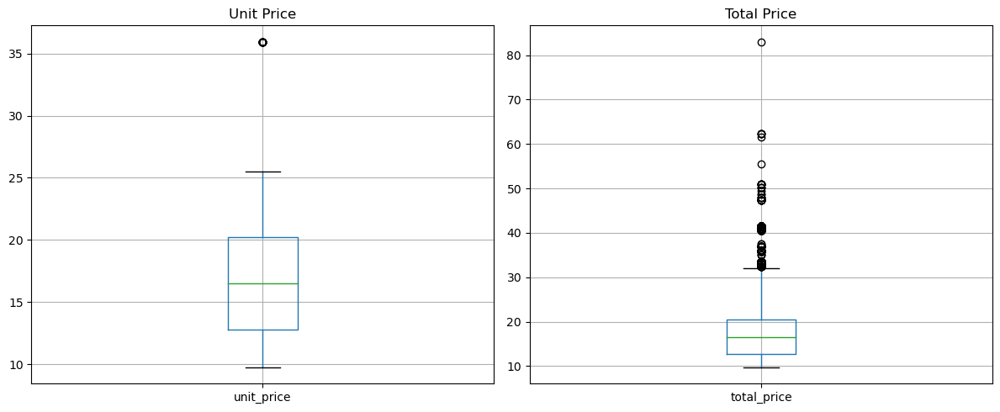

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
df.boxplot(column='unit_price', ax=axes[0])
df.boxplot(column='total_price', ax=axes[1])

axes[0].set_title('Unit Price')
axes[1].set_title('Total Price')

plt.tight_layout()
plt.show()


In [ ]:
# Calculate IQR for unit_price
Q1_unit = df['unit_price'].quantile(0.25)
Q3_unit = df['unit_price'].quantile(0.75)
IQR_unit = Q3_unit - Q1_unit

# Define bounds for outliers in unit_price
lower_bound_unit = Q1_unit - 1.5 * IQR_unit
upper_bound_unit = Q3_unit + 1.5 * IQR_unit

# Filter outliers in unit_price
outliers_unit_price = df[(df['unit_price'] < lower_bound_unit) | (df['unit_price'] > upper_bound_unit)]

# Display outliers
outliers_unit_price['pizza_id'].value_counts()

the_greek_xxl    28
Name: pizza_id, dtype: int64

In [ ]:
outliers_unit_price.head(1)

,order_details_id,order_id,pizza_id,quantity,order_date,order_time,unit_price,total_price,pizza_size,pizza_category,pizza_ingredients,pizza_name
3447,3448,1528,the_greek_xxl,1,2015-01-26,15:24:38,35.95,35.95,XXL,Classic,"Kalamata Olives, Feta Cheese, Tomatoes, Garlic...",The Greek Pizza


the_greek_xxl is the most expensive and it price is $35.95 .

Only 28 orders were placed throughout the year, accounting for less than 0.1% of the total order volume of 48,620. 

Consider removing this product from the shelves

In [ ]:
# Calculate IQR for total_price
Q1_total = df['total_price'].quantile(0.25)
Q3_total = df['total_price'].quantile(0.75)
IQR_total = Q3_total - Q1_total

# Define bounds for outliers in total_price
lower_bound_total = Q1_total - 1.5 * IQR_total
upper_bound_total = Q3_total + 1.5 * IQR_total

# Filter outliers in total_price
outliers_total_price = df[(df['total_price'] < lower_bound_total) | (df['total_price'] > upper_bound_total)]

# Display outliers
outliers_total_price.sort_values(by='total_price',ascending=False)

,order_details_id,order_id,pizza_id,quantity,order_date,order_time,unit_price,total_price,pizza_size,pizza_category,pizza_ingredients,pizza_name
35496,35497,15674,cali_ckn_l,4,2015-09-19,14:16:35,20.75,83.00,L,Chicken,"Chicken, Artichoke, Spinach, Garlic, Jalapeno ...",The California Chicken Pizza
183,184,78,spicy_ital_l,3,2015-01-02,12:28:14,20.75,62.25,L,Supreme,"Capocollo, Tomatoes, Goat Cheese, Artichokes, ...",The Spicy Italian Pizza
38819,38820,17112,bbq_ckn_l,3,2015-10-17,12:56:31,20.75,62.25,L,Chicken,"Barbecued Chicken, Red Peppers, Green Peppers,...",The Barbecue Chicken Pizza
18317,18318,8040,thai_ckn_l,3,2015-05-15,14:13:27,20.75,62.25,L,Chicken,"Chicken, Pineapple, Tomatoes, Red Peppers, Tha...",The Thai Chicken Pizza
37638,37639,16619,prsc_argla_l,3,2015-10-08,12:19:53,20.75,62.25,L,Supreme,"Prosciutto di San Daniele, Arugula, Mozzarella...",The Prosciutto and Arugula Pizza
...,...,...,...,...,...,...,...,...,...,...,...,...
7598,7599,3350,sicilian_m,2,2015-02-26,12:16:27,16.25,32.50,M,Supreme,"Coarse Sicilian Salami, Tomatoes, Green Olives...",The Sicilian Pizza
19386,19387,8522,sicilian_m,2,2015-05-23,13:25:32,16.25,32.50,M,Supreme,"Coarse Sicilian Salami, Tomatoes, Green Olives...",The Sicilian Pizza
19471,19472,8561,sicilian_m,2,2015-05-23,20:47:25,16.25,32.50,M,Supreme,"Coarse Sicilian Salami, Tomatoes, Green Olives...",The Sicilian Pizza
28131,28132,12384,sicilian_m,2,2015-07-26,13:28:46,16.25,32.50,M,Supreme,"Coarse Sicilian Salami, Tomatoes, Green Olives...",The Sicilian Pizza


In [ ]:
# Calculate the count of items and total price per order_id
items_count_per_order = outliers_total_price.groupby('order_id')['quantity'].sum()
total_price_per_order = outliers_total_price.groupby('order_id')['total_price'].sum()

# Get a list of unique pizzas per order_id
pizzas_per_order = outliers_total_price.groupby('order_id')['pizza_id'].unique()

# Since we can't directly execute the code, I'll describe how you could merge these results for a comprehensive view
results_df = pd.DataFrame({
    'Items_Count': items_count_per_order,
    'Total_Price': total_price_per_order,
    'Pizzas': pizzas_per_order
})

# Displaying a sample of the merged results
results_df.sort_values(by='Items_Count', ascending=False)

,Items_Count,Total_Price,Pizzas
order_id,,,
17171,7,127.65,"[bbq_ckn_m, four_cheese_l, spicy_ital_l]"
19411,7,106.50,"[big_meat_s, cali_ckn_m, five_cheese_l]"
18845,7,124.25,"[bbq_ckn_m, sicilian_m, thai_ckn_l]"
1096,6,118.40,"[four_cheese_l, napolitana_l, spicy_ital_l]"
20169,6,115.50,"[napolitana_l, southw_ckn_l, spicy_ital_m]"
...,...,...,...
18919,1,35.95,[the_greek_xxl]
2813,1,35.95,[the_greek_xxl]
2614,1,35.95,[the_greek_xxl]


Outliers are reasonable and do not need to be addressed

**Get price analysis data**

In [ ]:
pizza_pricing = df[['pizza_id', 'pizza_size', 'pizza_category', 'pizza_ingredients',
       'pizza_name', 'unit_price']].drop_duplicates().sort_values(by='unit_price')
pizza_pricing

,pizza_id,pizza_size,pizza_category,pizza_ingredients,pizza_name,unit_price
77,pepperoni_s,S,Classic,"Mozzarella Cheese, Pepperoni",The Pepperoni Pizza,9.75
93,hawaiian_s,S,Classic,"Sliced Ham, Pineapple, Mozzarella Cheese",The Hawaiian Pizza,10.50
127,pep_msh_pep_s,S,Classic,"Pepperoni, Mushrooms, Green Peppers","The Pepperoni, Mushroom, and Peppers Pizza",11.00
19,mexicana_s,S,Veggie,"Tomatoes, Red Peppers, Jalapeno Peppers, Red O...",The Mexicana Pizza,12.00
35,big_meat_s,S,Classic,"Bacon, Pepperoni, Italian Sausage, Chorizo Sau...",The Big Meat Pizza,12.00
...,...,...,...,...,...,...
3,ital_supr_l,L,Supreme,"Calabrese Salami, Capocollo, Tomatoes, Red Oni...",The Italian Supreme Pizza,20.75
175,ital_veggie_l,L,Veggie,"Eggplant, Artichokes, Tomatoes, Zucchini, Red ...",The Italian Vegetables Pizza,21.00
427,brie_carre_s,S,Supreme,"Brie Carre Cheese, Prosciutto, Caramelized Oni...",The Brie Carre Pizza,23.65
121,the_greek_xl,XL,Classic,"Kalamata Olives, Feta Cheese, Tomatoes, Garlic...",The Greek Pizza,25.50


In [ ]:
#pizza_pricing.to_csv("data/pizza_pricing.csv")

### Price analysis

#### EDA

In [ ]:
# Group by order_id and sum the total_price for each order
order_values = df.groupby('order_id')['total_price'].sum()

# Calculate the average order value
average_order_value = order_values.mean()

print('\nCalculate the average order value:',average_order_value)


Calculate the average order value: 38.30726229508162


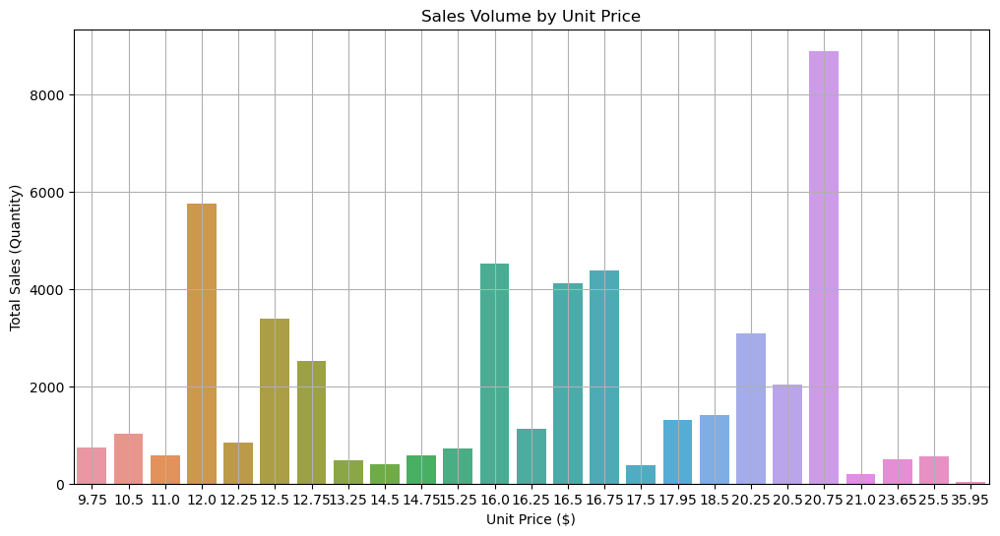

In [ ]:
import seaborn as sns
# Further analysis on price vs sales volume
# We group by unit_price this time to get a more detailed view on how different prices impact sales volume
price_sales_volume = df.groupby('unit_price').agg(
    total_sales=('quantity', 'sum')
).reset_index().sort_values(by='unit_price')

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(data=price_sales_volume, x='unit_price', y='total_sales')
plt.title('Sales Volume by Unit Price')
plt.xlabel('Unit Price ($)')
plt.ylabel('Total Sales (Quantity)')
plt.grid(True)
plt.show()

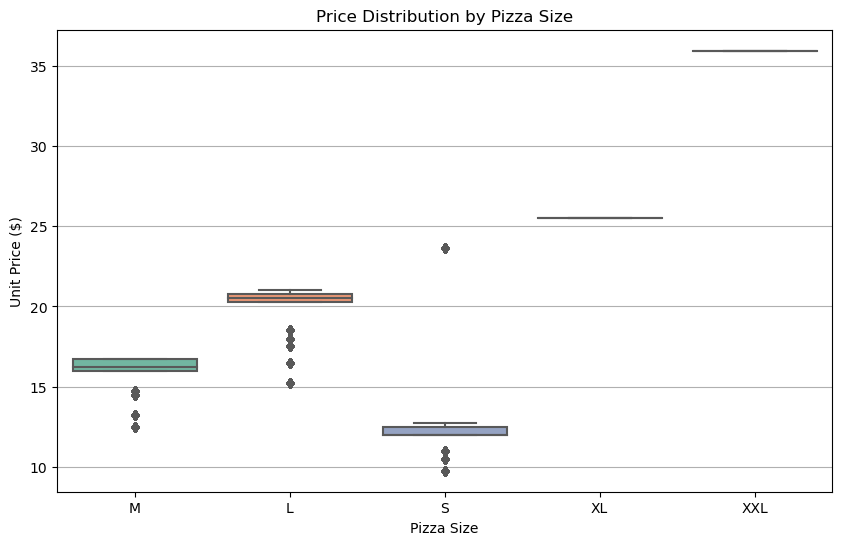

In [ ]:
# Analysis on price distribution by pizza size
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='pizza_size', y='unit_price', palette='Set2')
plt.title('Price Distribution by Pizza Size')
plt.xlabel('Pizza Size')
plt.ylabel('Unit Price ($)')
plt.grid(axis='y')
plt.show()

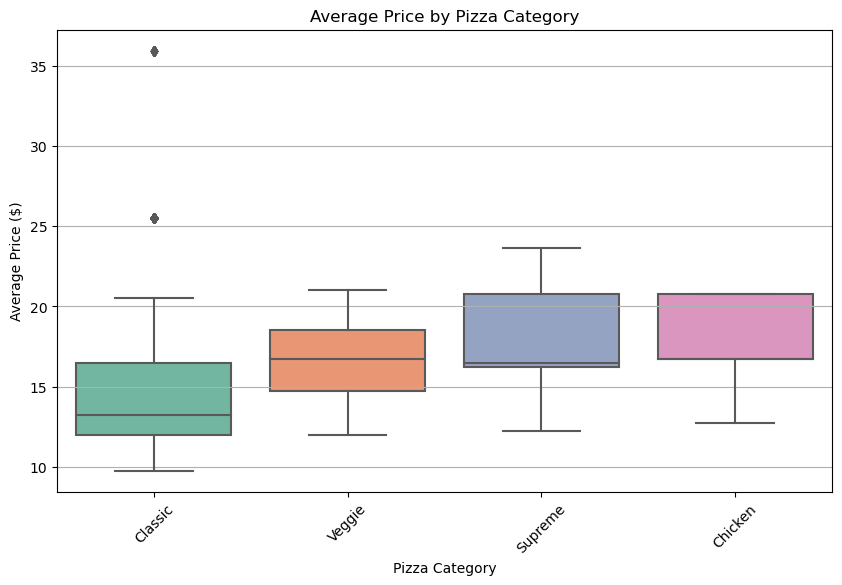

In [ ]:
# Analysis on prices for each pizza category
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='pizza_category', y='unit_price', palette='Set2')
plt.title('Average Price by Pizza Category')
plt.xlabel('Pizza Category')
plt.ylabel('Average Price ($)')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

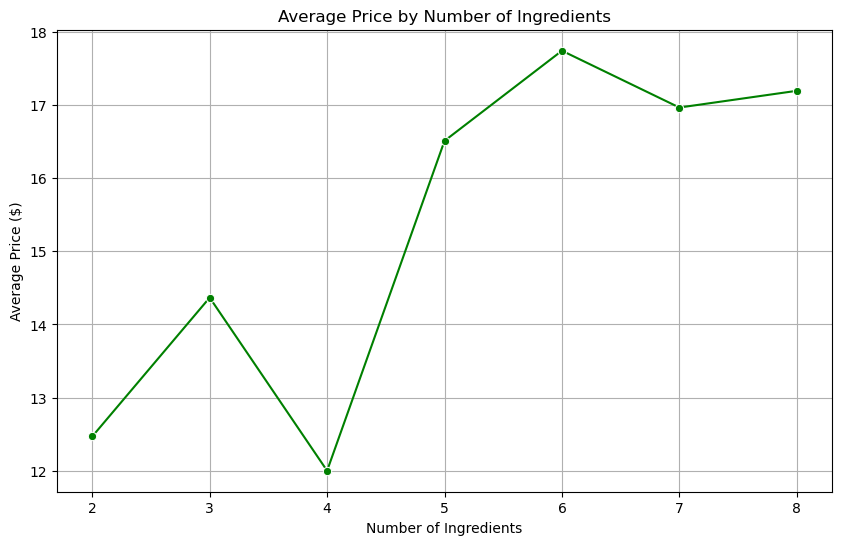

In [ ]:
# Calculate the number of ingredients for each pizza
df['ingredients_count'] = df['pizza_ingredients'].apply(lambda x: len(x.split(',')))

# Group by ingredients count to see the relationship with average price
ingredients_price = df.groupby('ingredients_count').agg(
    average_price=('unit_price', 'mean')
).reset_index()

# Plotting
plt.figure(figsize=(10, 6))
sns.lineplot(data=ingredients_price, x='ingredients_count', y='average_price', marker='o', color='green')
plt.title('Average Price by Number of Ingredients')
plt.xlabel('Number of Ingredients')
plt.ylabel('Average Price ($)')
plt.grid(True)
plt.show()

#### Data Handle(feature engineering)

In [ ]:
# Split the pizza_ingredients column by comma and convert to long format
pizza_ingredients_long = (pizza_pricing['pizza_ingredients']
                           .str.split(', ')
                           .explode()
                           .reset_index(drop=True))

# Count the number of occurrences of each ingredient
ingredient_counts = pizza_ingredients_long.value_counts()

# Print the number of unique ingredients
print('Number of unique ingredients:', len(ingredient_counts))

# Print the top 10 most common ingredients
print('\nTop 10 most common ingredients:')
print(ingredient_counts.head(10))

Number of unique ingredients: 66

Top 10 most common ingredients:
Garlic               59
Tomatoes             58
Red Onions           43
Red Peppers          30
Spinach              24
Mushrooms            21
Pepperoni            16
Mozzarella Cheese    15
Chicken              15
Artichokes           15
Name: pizza_ingredients, dtype: int64


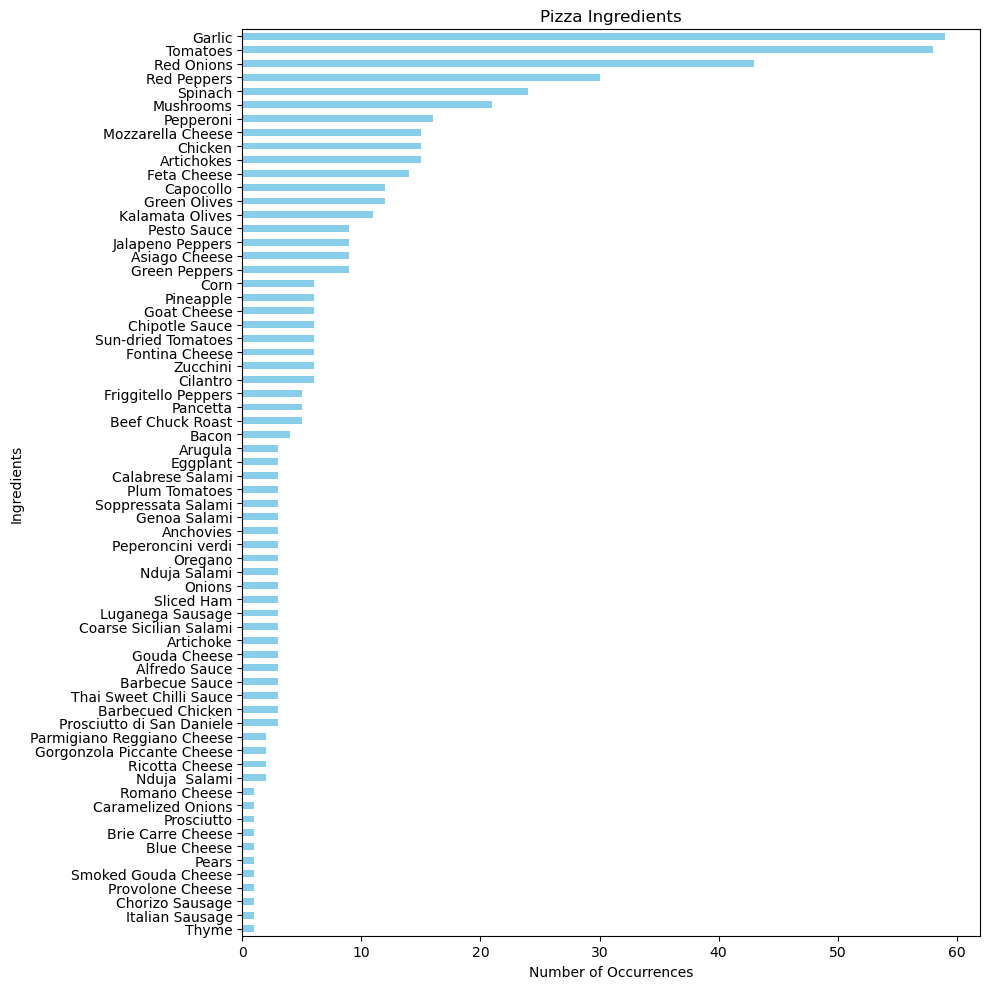

In [ ]:
import matplotlib.pyplot as plt
# Draw a bar chart of ingredient quantity rankings
plt.figure(figsize=(10, 10))
ingredient_counts.sort_values().plot(kind='barh', color='skyblue')
plt.xlabel('Number of Occurrences')
plt.ylabel('Ingredients')
plt.title('Pizza Ingredients')
plt.tight_layout()
plt.show()


In [ ]:
#ingredient_counts.to_csv('data/ingredient_counts.csv')

In [ ]:
vegetable_ingredients = [
    'Garlic', 'Tomatoes', 'Red Onions', 'Red Peppers', 'Spinach', 'Mushrooms', 'Artichokes',
    'Green Olives', 'Green Peppers', 'Jalapeno Peppers', 'Corn', 'Sun-dried Tomatoes',
    'Zucchini', 'Cilantro', 'Friggitello Peppers', 'Eggplant', 'Arugula', 'Peperoncini verdi',
    'Plum Tomatoes', 'Onions', 'Artichoke'
]
meat_ingredients = [
    'Pepperoni', 'Chicken', 'Capocollo', 'Bacon', 'Beef Chuck Roast', 'Pancetta',
    'Calabrese Salami', 'Barbecued Chicken', 'Prosciutto di San Daniele', 'Coarse Sicilian Salami',
    'Soppressata Salami', 'Luganega Sausage', 'Nduja Salami', 'Italian Sausage', 'Chorizo Sausage',
    'Prosciutto', 'Genoa Salami', 'Sliced Ham'
]
cheese_ingredients = [
    'Mozzarella Cheese', 'Feta Cheese', 'Asiago Cheese', 'Fontina Cheese', 'Goat Cheese', 'Gouda Cheese',
    'Parmigiano Reggiano Cheese', 'Gorgonzola Piccante Cheese', 'Ricotta Cheese', 'Provolone Cheese',
    'Smoked Gouda Cheese', 'Romano Cheese', 'Blue Cheese', 'Brie Carre Cheese'
]
special_ingredients = [
    'Pesto Sauce', 'Chipotle Sauce', 'Thai Sweet Chilli Sauce', 'Alfredo Sauce', 'Barbecue Sauce',
    'Oregano', 'Thyme', 'Caramelized Onions'
]
fruit_ingredients = [
    'Pineapple', 'Pears'
]
other_ingredients = [
    'Kalamata Olives', 'Anchovies'
]


def process_ingredients(row):
    ingredients = row['pizza_ingredients'].split(',')
    vegetable_count=sum(ingredient.strip() in vegetable_ingredients for ingredient in ingredients)
    meat_count = sum(ingredient.strip() in meat_ingredients for ingredient in ingredients)
    cheese_count=sum(ingredient.strip() in cheese_ingredients for ingredient in ingredients)
    special_ingredients_count = sum(ingredient.strip() in special_ingredients for ingredient in ingredients)
    fruit_ingredients_count = sum(ingredient.strip() in fruit_ingredients for ingredient in ingredients)
    other_ingredients_count = sum(ingredient.strip() in other_ingredients for ingredient in ingredients)
    return  vegetable_count,meat_count, cheese_count,special_ingredients_count,fruit_ingredients_count,other_ingredients_count

pizza_pricing[['meat_count', 'vegetable_count','cheese_count','special_ingredients_count','fruit_ingredients_count','other_ingredients_count']] =pizza_pricing.apply(process_ingredients, axis=1, result_type='expand')
dummies = pd.get_dummies(pizza_pricing[['pizza_size']], prefix='size')
price=pizza_pricing.drop(columns=['pizza_size','pizza_id', 'pizza_name','pizza_ingredients','pizza_category'])
price=pd.concat([price, dummies], axis=1)
price

,unit_price,meat_count,vegetable_count,cheese_count,special_ingredients_count,fruit_ingredients_count,other_ingredients_count,size_L,size_M,size_S,size_XL,size_XXL
77,9.75,0,1,1,0,0,0,0,0,1,0,0
93,10.50,0,1,1,0,1,0,0,0,1,0,0
127,11.00,2,1,0,0,0,0,0,0,1,0,0
19,12.00,7,0,0,1,0,0,0,0,1,0,0
35,12.00,0,4,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3,20.75,4,2,0,0,0,0,1,0,0,0,0
175,21.00,6,0,0,1,0,0,1,0,0,0,0
427,23.65,1,1,1,2,1,0,0,0,1,0,0
121,25.50,3,1,1,0,0,1,0,0,0,1,0


In [ ]:
price.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 93 entries, 77 to 3447
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   unit_price                 93 non-null     float64
 1   meat_count                 93 non-null     int64  
 2   vegetable_count            93 non-null     int64  
 3   cheese_count               93 non-null     int64  
 4   special_ingredients_count  93 non-null     int64  
 5   fruit_ingredients_count    93 non-null     int64  
 6   other_ingredients_count    93 non-null     int64  
 7   size_L                     93 non-null     uint8  
 8   size_M                     93 non-null     uint8  
 9   size_S                     93 non-null     uint8  
 10  size_XL                    93 non-null     uint8  
 11  size_XXL                   93 non-null     uint8  
dtypes: float64(1), int64(6), uint8(5)
memory usage: 6.3 KB


#### Split data and standardization

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [ ]:
X=price.drop(columns=['unit_price'])
y=price['unit_price']

In [ ]:
X.columns

Index(['meat_count', 'vegetable_count', 'cheese_count',
       'special_ingredients_count', 'fruit_ingredients_count',
       'other_ingredients_count', 'size_L', 'size_M', 'size_S', 'size_XL',
       'size_XXL'],
      dtype='object')

In [ ]:
#Standardized numeric column

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X[['meat_count', 'vegetable_count', 'cheese_count',
                                   'special_ingredients_count', 'fruit_ingredients_count',
                                   'other_ingredients_count']])
X_scaled = pd.DataFrame(X_scaled, columns=['meat_count', 'vegetable_count', 'cheese_count',
                                           'special_ingredients_count', 'fruit_ingredients_count',
                                           'other_ingredients_count'],
                        index=X.index)

X_unscaled = X[['size_L', 'size_M', 'size_S', 'size_XL',
                'size_XXL']]

X_scaled = pd.concat([X_scaled, X_unscaled], axis=1)

X_scaled


,meat_count,vegetable_count,cheese_count,special_ingredients_count,fruit_ingredients_count,other_ingredients_count,size_L,size_M,size_S,size_XL,size_XXL
77,-1.886050,0.080582,0.345043,-0.641756,-0.285299,-0.420969,0,0,1,0,0
93,-1.886050,0.080582,0.345043,-0.641756,3.505098,-0.420969,0,0,1,0,0
127,-0.813251,0.080582,-0.761473,-0.641756,-0.285299,-0.420969,0,0,1,0,0
19,1.868747,-1.168443,-0.761473,1.416290,-0.285299,-0.420969,0,0,1,0,0
35,-1.886050,3.827659,-0.761473,-0.641756,-0.285299,-0.420969,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...
3,0.259548,1.329608,-0.761473,-0.641756,-0.285299,-0.420969,1,0,0,0,0
175,1.332347,-1.168443,-0.761473,1.416290,-0.285299,-0.420969,1,0,0,0,0
427,-1.349651,0.080582,0.345043,3.474336,3.505098,-0.420969,0,0,1,0,0
121,-0.276851,0.080582,0.345043,-0.641756,-0.285299,2.375470,0,0,0,1,0


In [ ]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

#### RandomForestRegressor

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, r2_score,mean_squared_error

In [ ]:
# Define the RandomForestRegressor model
model = RandomForestRegressor(n_estimators=100, random_state=42)
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],  # tree mounts
    'max_depth': [None, 10, 20, 30],  # tree deepth
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at leaf nodes
}
# GridSearchCV
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, 
                           cv=5, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')

# Training the model
grid_search.fit(X_train, y_train)
print("Best parameters:", grid_search.best_params_)

# Predicting and evaluating the model
y_pred = grid_search.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'r2_score: {r2}')


Fitting 5 folds for each of 108 candidates, totalling 540 fits
Best parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Mean Squared Error: 5.485101538028678
r2_score: 0.6082880448545642


#### GradientBoostingRegressor

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

In [ ]:
gbr_model = GradientBoostingRegressor(random_state=42)
# Define parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],  # tree mounts
    'max_depth': [3, 4, 5],  # tree deepth
    'learning_rate': [0.01, 0.1, 0.2],
    'min_samples_split': [2, 3, 4],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 3]  # Minimum number of samples required at leaf nodes
}
# GridSearchCV
grid_search = GridSearchCV(estimator=gbr_model, param_grid=param_grid, 
                           cv=5, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
# Training the model
grid_search.fit(X_train, y_train)
print("Best parameters found: ", grid_search.best_params_)

y_pred = grid_search.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'r2_score: {r2}')

Fitting 5 folds for each of 243 candidates, totalling 1215 fits


Best parameters found:  {'learning_rate': 0.2, 'max_depth': 4, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
Mean Squared Error: 4.754302134234593
r2_score: 0.6604772087733385


####  RidgeRegression

In [ ]:
from sklearn.linear_model import Ridge

In [ ]:
Ridge_model = Ridge(random_state=42)

#Define parameter grid
param_grid = {
    'alpha': [0.1, 1, 10, 100, 1000]  # Different values of regularization strength
}
#GridSearchCV
grid_search = GridSearchCV(estimator=Ridge_model, param_grid=param_grid, 
                           cv=5, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)
#Train model
grid_search.fit(X_train, y_train)
print("Best parameters found: ", grid_search.best_params_)

y_pred = grid_search.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'r2_score: {r2}')


Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best parameters found:  {'alpha': 0.1}
Mean Squared Error: 4.795180960153753
r2_score: 0.6575578963934625


####  XGBRegressor

In [ ]:
!pip install xgboost

In [ ]:
from xgboost import XGBRegressor

In [ ]:
xgb_model = XGBRegressor(random_state=42)
# Define parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
}
# GridSearchCV
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, 
                           cv=5, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
# Training the model
grid_search.fit(X_train, y_train)
print("Best parameters found: ", grid_search.best_params_)


y_pred = grid_search.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'r2_score: {r2}')

Fitting 5 folds for each of 324 candidates, totalling 1620 fits
Best parameters found:  {'colsample_bytree': 0.8, 'learning_rate': 0.2, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 300, 'subsample': 1.0}
Mean Squared Error: 4.357120018810628
r2_score: 0.6888414937191805


In [ ]:
# Save the model predictions and the actual prices to a DataFrame
results_df = pd.DataFrame({'Actual Price': y_test, 'Predicted Price': y_pred})

# Reset the index for a cleaner look
results_df.reset_index(drop=True, inplace=True)

results_df.head(10)

,Actual Price,Predicted Price
0,16.00,16.021729
1,12.50,12.260967
2,16.75,16.020365
3,20.50,20.242477
4,9.75,9.575288
5,12.75,12.736819
6,16.00,16.043657
7,20.25,20.306557
8,12.00,12.036386
9,16.25,16.249842


Feature Importances:
meat_count: 0.0100
vegetable_count: 0.0011
cheese_count: 0.0016
special_ingredients_count: 0.0035
fruit_ingredients_count: 0.0005
other_ingredients_count: 0.0096
size_L: 0.0271
size_M: 0.1481
size_S: 0.6106
size_XL: 0.0187
size_XXL: 0.1691



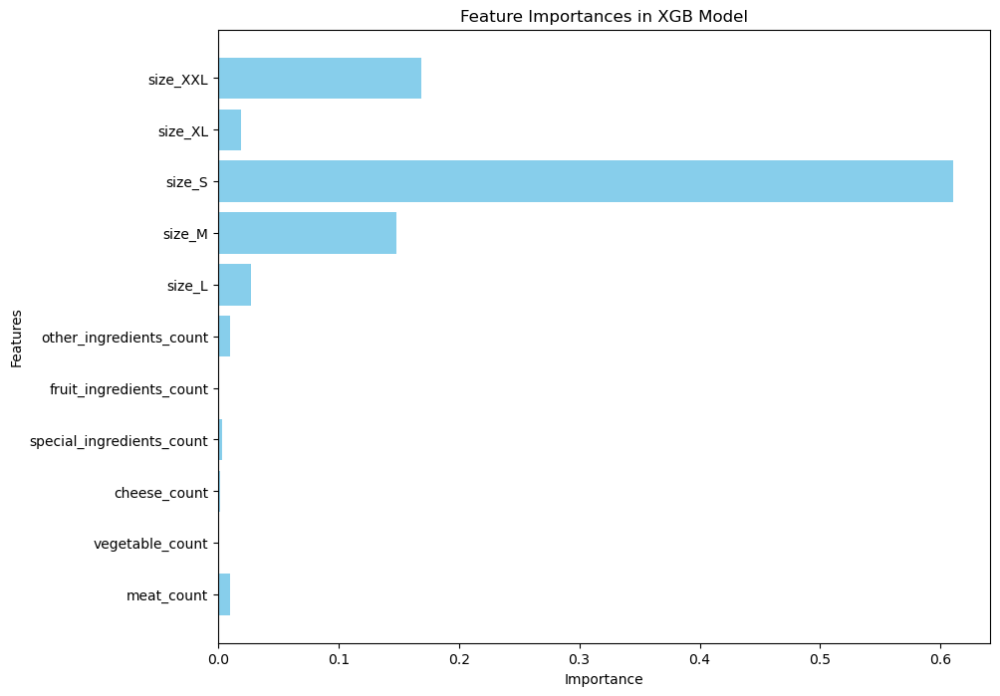

In [ ]:
# Display the characteristic coefficients of the best model
best_xgb_model = grid_search.best_estimator_
features = X_train.columns

# Get feature importance of XGBoost model
feature_importances = best_xgb_model.feature_importances_

# Construct a string representation of feature importance
importance_str = "Feature Importances:\n"
for i, importance in enumerate(feature_importances):
    importance_str += f"{features[i]}: {importance:.4f}\n"
print(importance_str)

# Visualizing feature importance
plt.figure(figsize=(10, 8))
plt.barh(features, feature_importances, color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Feature Importances in XGB Model')
plt.show()

The best performer is XGBRegressor:

We can see the relative measure of each feature's contribution to the model's predictive ability. Size features (such as size_S, size_M, size_XXL) have the greatest contribution to predicting pizza prices, especially the size_S feature, whose feature importance is much higher than other features. It shows that the price change of small-sized pizza has the greatest impact on the prediction of the model compared with other sizes.


The importance of ingredient category features (meat_count, vegetable_count, etc.) is generally low, which means that the number of different types of ingredients contributes less to predicting pizza price compared to size. But among these features, meat_count and other_ingredients_count are relatively more important, which may indicate that the quantity of meat ingredients and other unconventional ingredients affects the price to a certain extent.

In [ ]:
import numpy as np

# set a new data example
new_data_example = pd.DataFrame({
    'meat_count': [4],
    'vegetable_count': [2],
    'cheese_count': [2],
    'special_ingredients_count': [2],
    'fruit_ingredients_count': [1],
    'other_ingredients_count': [0],
    'size_L': [0],
    'size_M': [0],
    'size_S': [1],
    'size_XL': [0],
    'size_XXL': [0]
}, index=[0])


# Fit model
predicted_price = grid_search.predict(new_data_example)

# Use MAE to calculate the price range
mae = mean_absolute_error(y_test, y_pred)
price_range_lower = predicted_price - mae
price_range_upper = predicted_price + mae

# Convert numerical values to strings for printing
predicted_price_str = str(predicted_price[0]) if isinstance(predicted_price, np.ndarray) else str(predicted_price)
price_range_lower_str = str(price_range_lower[0]) if isinstance(price_range_lower, np.ndarray) else str(price_range_lower)
price_range_upper_str = str(price_range_upper[0]) if isinstance(price_range_upper, np.ndarray) else str(price_range_upper)

# Print the predicted price and its range
print("Predicted price is: " + predicted_price_str)
print("Range of predicted prices is: [" + price_range_lower_str + ":" + price_range_upper_str + "]")

Predicted price is: 12.781365
Range of predicted prices is: [12.073126:13.489605]


In [11]:
# convert geo community data from hong kong coordinate system to 2326
import os
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

for i in os.listdir('data/Geo_community'):
    if i.endswith('.csv'):
        gdf = pd.read_csv('data/Geo_community/' + i)
        # Easting: longitude, Northing: latitude
        gdf['geometry'] = gdf.apply(lambda x: Point(x.EASTING, x.NORTHING), axis=1)
        gdf = gpd.GeoDataFrame(gdf, geometry='geometry')
        gdf.crs = 'EPSG:2326'
        gdf = gdf.to_crs('EPSG:4326')
        gdf.to_file('data/Geo_community/' + i.replace('.csv', '.json'), driver='GeoJSON')
        print(f"Converted {i} to {i.replace('.csv', '.json')}")
print("All csv files converted to json")


C:\Users\kwokt\AppData\Local\Temp\ipykernel_3660\3661157636.py:9: DtypeWarning: Columns (11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  gdf = pd.read_csv('data/Geo_community/' + i)


Converted GeoCom4.0_202301.csv to GeoCom4.0_202301.json


C:\Users\kwokt\AppData\Local\Temp\ipykernel_3660\3661157636.py:9: DtypeWarning: Columns (11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  gdf = pd.read_csv('data/Geo_community/' + i)


Converted GeoCom4.0_202312.csv to GeoCom4.0_202312.json
All csv files converted to json


In [12]:
import geopandas as gpd

geo_community = gpd.read_file('data/Geo_community/GeoCom4.0_202301.json')
geo_community

,GEONAMEID,ENGLISHNAME,CHINESENAME,CLASS,TYPE,SUBCAT,EASTING,NORTHING,SOURCE,E_FLOOR,...,C_DISTRICT,E_REGION,C_REGION,E_ADDRESS,C_ADDRESS,TEL_NO,FAX_NO,WEB_SITE,REV_DATE,geometry
0,538509,7-Eleven,7-11便利店,CMF,CVS,NON24R,840081.423,820581.979,27,None,...,觀塘區,KLN,九龍,Kiosk No. KOB 10 at Unpaid Concourse of MTR Ko...,港鐵九龍灣站KOB10號舖(近淘大花園),None,None,https://www.7-eleven.com.hk/en,29/11/2023,POINT (114.21389 22.32425)
1,554906,Wellcome Supermarket-Shek Mun,惠康超級市場-石門,CMF,SMK,None,839320.985,827922.335,27,G/F,...,沙田區,NT,新界,"Shop No. 28, G/F, 1 On Ping Street, Shatin, NT",沙田安平街1號地下28號,2854 1027,None,https://www.wellcome.com.hk/,29/11/2023,POINT (114.20652 22.39054)
2,533116,Wellcome Supermarket-Gold Luck,惠康超級市場-金福,CMF,SMK,None,839826.741,816316.066,27,Upper Ground Floor,...,東區,HK,香港,"Shop B, Upper Ground Floor, 989-992 King's Roa...","北角英皇道鰂魚涌新威園地下989-992號,ShopB",2115 9934,None,https://www.wellcome.com.hk/,29/11/2023,POINT (114.21141 22.28573)
3,532978,Wellcome Supermarket-Golden Hill,惠康超級市場-金山,CMF,SMK,None,832142.981,823638.177,27,1/F,...,葵青區,NT,新界,"Shop 2 (Portion) 1/F,Wonderland Villas Commerc...",新界葵涌華景山莊商業中心1樓2號,2785 2846,None,https://www.wellcome.com.hk/,29/11/2023,POINT (114.13683 22.35185)
4,535767,Wellcome Supermarket-Indi Home,惠康超級市場-樂悠居,CMF,SMK,None,830223.509,825266.718,27,1/F,...,荃灣區,NT,新界,"Portion of nos 19 and 20A (Portion), 1/F indih...",楊屋道138號樂悠居1樓20號舖,2439 1050,None,https://www.wellcome.com.hk/,29/11/2023,POINT (114.11819 22.36655)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37872,529667,Electricity Substation,電力變壓站,UTI,EES,None,847512.000,819857.000,7,None,...,西貢區,NT,新界,"Clear Water Bay, Sai Kung, NT",新界西貢清水灣,None,None,None,28/12/2001,POINT (114.28601 22.31767)
37873,529668,Electricity Substation,電力變壓站,UTI,EES,None,847665.000,811152.000,7,None,...,西貢區,NT,新界,"Tung Lung Chau, NT",新界東龍洲,None,None,None,28/12/2001,POINT (114.28743 22.23906)
37874,629918,Restricted Access,限制通道,TRF,REA,None,841544.000,813213.000,5,None,...,東區,HK,香港,None,None,None,None,None,14/10/2000,POINT (114.22806 22.25770)
37875,629896,Restricted Access,限制通道,TRF,REA,None,841909.000,814051.000,5,None,...,東區,HK,香港,None,None,None,None,None,14/10/2000,POINT (114.23160 22.26527)


In [ ]:
# map census subunit to restaurant licence data
import geopandas as gpd
import pandas as pd

census = gpd.read_file('data/2021_census/LSUG_21C_cleaned.json')

# left join census to 

In [13]:
# create a function to find number of nearby MTR stations in radius 100m for 'data/Master/0230101-1033-LP_Restaurants_EN.csv'
import os
import pandas as pd
import geopandas as gpd

geo_community = gpd.read_file('data/Geo_community/GeoCom4.0_202301.json')
folder_path = 'data/Master/'

def find_number_of_MTR_stations(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_MTR_stations = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'TRS') & ((facilities['TYPE'] == 'RSN') | (facilities['TYPE'] == 'MTA') | (facilities['TYPE'] == 'LRA'))]
    number_of_MTR_stations = len(nearby_MTR_stations)
    return number_of_MTR_stations

for file in os.listdir(folder_path):
    if file.endswith('.csv'):
        df = pd.read_csv(folder_path + file, encoding='utf-8')
        gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lng, df.lat))
        gdf['number_of_MTR_stations'] = gdf.apply(find_number_of_MTR_stations, axis=1)
        gdf.to_csv(folder_path + file, index=False)
        print(file, 'done')

0230101-1033-LP_Restaurants_EN.csv done


In [17]:
# create a function to find number of nearby schools in radius 100m for 'data/Master/0230101-1033-LP_Restaurants_EN.csv'
def find_number_of_schools(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_schools = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'SCH')]
    number_of_schools = len(nearby_schools)
    return number_of_schools

for file in os.listdir(folder_path):
    if file.endswith('.csv'):
        df = pd.read_csv(folder_path + file, encoding='utf-8')
        gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lng, df.lat))
        gdf['number_of_schools'] = gdf.apply(find_number_of_schools, axis=1)
        gdf.to_csv(folder_path + file, index=False)
        print(file, 'done')

0230101-1033-LP_Restaurants_EN.csv done


In [18]:
# create a function to find number of nearby commercial facilities in radius 10m for each file in C:\Competition\coding-with-git-repo\open-data-hackthon\becky\training-model\prepared-data\kwaichung-restaurant_mapped
# also government, religious, medical, hotel

def find_number_of_commercial_facilities(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_commercial_facilities = facilities[(facilities.geometry.within(circle)) & ((facilities['CLASS'] == 'COM') | (facilities['CLASS'] == 'MUF') | (facilities['CLASS'] == 'RSF'))]
    number_of_commercial_facilities = len(nearby_commercial_facilities)
    return number_of_commercial_facilities

def find_number_of_government_facilities(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_government_facilities = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'GOV')]
    number_of_government_facilities = len(nearby_government_facilities)
    return number_of_government_facilities

def find_number_of_religious_facilities(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_religious_facilities = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'REL')]
    number_of_religious_facilities = len(nearby_religious_facilities)
    return number_of_religious_facilities

def find_number_of_medical_facilities(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_medical_facilities = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'HNC')]
    number_of_medical_facilities = len(nearby_medical_facilities)
    return number_of_medical_facilities

def find_number_of_hotel_facilities(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_hotel_facilities = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'AMD')]
    number_of_hotel_facilities = len(nearby_hotel_facilities)
    return number_of_hotel_facilities

for file in os.listdir(folder_path):
    if file.endswith('.csv'):
        df = pd.read_csv(folder_path + file, encoding='utf-8')
        gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lng, df.lat))
        gdf['number_of_commercial_facilities'] = gdf.apply(find_number_of_commercial_facilities, axis=1)
        gdf['number_of_government_facilities'] = gdf.apply(find_number_of_government_facilities, axis=1)
        gdf['number_of_religious_facilities'] = gdf.apply(find_number_of_religious_facilities, axis=1)
        gdf['number_of_medical_facilities'] = gdf.apply(find_number_of_medical_facilities, axis=1)
        gdf['number_of_hotel_facilities'] = gdf.apply(find_number_of_hotel_facilities, axis=1)
        gdf.to_csv(folder_path + file, index=False)
        print(file, 'done')

0230101-1033-LP_Restaurants_EN.csv done


In [20]:
# find number of bus stops in radius 100m
def find_number_of_bus_stops(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_bus_stops = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'BUS')]
    number_of_bus_stops = len(nearby_bus_stops)
    return number_of_bus_stops

for file in os.listdir(folder_path):
    if file.endswith('.csv'):
        df = pd.read_csv(folder_path + file, encoding='utf-8')
        gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lng, df.lat))
        gdf['number_of_bus_stops'] = gdf.apply(find_number_of_bus_stops, axis=1)
        gdf.to_csv(folder_path + file, index=False)
        print(file, 'done')

0230101-1033-LP_Restaurants_EN.csv done


In [5]:
import geopandas as gpd
import pandas as pd

# find number of restaurants in radius 100m, method of finding the number of nearby restaurants:
# for each restaurant in the master file, form a circle with radius 100m, then find the number of restaurants in the circle

master = pd.read_csv('data/Master/0230101-1033-LP_Restaurants_EN.csv', encoding='utf-8')
# convert master to geodataframe
master = gpd.GeoDataFrame(master, geometry=gpd.points_from_xy(master.lng, master.lat))
gdf = master.copy()

def find_number_of_nearby_restaurants(row, gdf = gdf):
    circle = row.geometry.buffer(0.001)
    nearby_restaurants = gdf[gdf.geometry.within(circle)]
    number_of_nearby_restaurants = len(nearby_restaurants) - 1 # exclude the current row
    return number_of_nearby_restaurants

master['number_of_nearby_restaurants'] = master.apply(find_number_of_nearby_restaurants, axis=1)
master.to_csv('data/Master/0230101-1033-LP_Restaurants_EN.csv', index=False)

In [8]:
# see the total number of nearby restaurants
master['number_of_nearby_restaurants'].describe()

count    18696.000000
mean        35.947047
std         31.684397
min          0.000000
25%         14.000000
50%         28.000000
75%         48.000000
max        176.000000
Name: number_of_nearby_restaurants, dtype: float64

In [9]:
# find the restaurant with the most number of nearby restaurants
master[master['number_of_nearby_restaurants'] == master['number_of_nearby_restaurants'].max()]

,TYPE,DIST,LICNO,SS,ADR,INFO,EXPDATE,lat,lng,census_subnit,...,rent_to_income_ratio,geometry,number_of_schools,number_of_commercial_facilities,number_of_government_facilities,number_of_religious_facilities,number_of_medical_facilities,number_of_hotel_facilities,number_of_bus_stops,number_of_nearby_restaurants
89,RL,18,2213193940,SAKURA JAPANESE CUISINE,"1/F., WO ON BUILDING, 8-13 WO ON LANE, CENTRAL...",#E#F#G#H,2023-11-08,22.281618,114.155245,71.0,...,0.214,POINT (114.15525 22.28162),2,3,5,0,0,2,0,176
974,RL,18,2218815371,Big JJ Seafood Hotpot Restaurant,"SHOP B, G/F., WO ON BUILDING, NO. 8, 9, 11 & 1...",NaN,2023-05-05,22.281615,114.155221,71.0,...,0.214,POINT (114.15522 22.28161),2,3,6,0,0,2,0,176
14106,RR,18,3113225849,ILAN,"SHOP A, G/F, 8, 9, 11 & 12 WO ON LANE, WO ON B...",NaN,2023-07-15,22.281615,114.155221,71.0,...,0.214,POINT (114.15522 22.28161),2,3,6,0,0,2,0,176


In [12]:
# why there are so many nearby restaurants? find all the nearby restaurants within 100m of the restaurant with the most number of nearby restaurants
# in this case we use restaurant 'SAKURA JAPANESE CUISINE' as an example
def find_nearby_restaurants(row, gdf = gdf):
    circle = row.geometry.buffer(0.001)
    nearby_restaurants = gdf[gdf.geometry.within(circle)]
    return nearby_restaurants

nearby_restaurants = find_nearby_restaurants(master[master['number_of_nearby_restaurants'] == master['number_of_nearby_restaurants'].max()].iloc[0])
nearby_restaurants

,TYPE,DIST,LICNO,SS,ADR,INFO,EXPDATE,lat,lng,census_subnit,...,ten_oc_percent,rent_to_income_ratio,geometry,number_of_schools,number_of_commercial_facilities,number_of_government_facilities,number_of_religious_facilities,number_of_medical_facilities,number_of_hotel_facilities,number_of_bus_stops
8,RL,18,2213035783,YUNG KEE,"G/F - 4/F, 32-40 WELLINGTON STREET, CENTRAL, H...",NaN,2023-06-30,22.281480,114.155570,71.0,...,0.39267,0.214,POINT (114.15557 22.28148),2,4,4,0,0,2,0
13,RL,18,2213039518,BAAN THAI,"G/F. & C/L., 57 WYNDHAM STREET, CENTRAL, HONG ...",NaN,2023-06-30,22.281268,114.154941,71.0,...,0.39267,0.214,POINT (114.15494 22.28127),2,3,4,0,0,2,0
17,RL,18,2213045881,CARAT,"G/F. & C/L., 29 D'AGUILAR STREET, CENTRAL, HON...",NaN,2023-06-30,22.281101,114.155280,71.0,...,0.39267,0.214,POINT (114.15528 22.28110),2,3,4,0,0,2,0
41,RL,18,2213106463,TANGO ARGENTINEAN STEAK HOUSE,"1/F., CARFIELD COMMERCIAL BUILDING, 75-77 WYND...",NaN,2023-08-16,22.281853,114.154738,71.0,...,0.39267,0.214,POINT (114.15474 22.28185),2,1,7,0,0,2,0
81,RL,18,2213185538,DIVINO,"SHOP 1, UG/F., WINSOME HOUSE, 73 WYNDHAM STREE...",#E#F,2023-02-01,22.281678,114.154860,71.0,...,0.39267,0.214,POINT (114.15486 22.28168),2,1,8,0,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14616,RR,18,3118810408,Social Den,"9/F, THE LOOP, 33 WELLINGTON STREET, CENTRAL, ...",NaN,2023-08-25,22.282005,114.155461,71.0,...,0.39267,0.214,POINT (114.15546 22.28200),2,1,10,0,0,3,0
14625,RR,18,3118810505,Lanala,"SHOP C, G/F, LUCKY BUILDING, NO. 39 WELLINGTON...",NaN,2023-11-03,22.282260,114.155284,71.0,...,0.39267,0.214,POINT (114.15528 22.28226),2,1,8,0,0,1,0
14628,RR,18,3118810532,In Depth,"3/F., SOMPTUEUX CENTRAL, 52 WELLINGTON STREET,...",NaN,2023-11-15,22.281828,114.155347,71.0,...,0.39267,0.214,POINT (114.15535 22.28183),2,1,7,0,0,3,0
14644,RR,18,3918811199,TAI TAI,"FLAT E, 1/F., BLOCK A, WINNER BUILDING, 37 D'A...",NaN,2023-04-12,22.281026,114.155178,71.0,...,0.39267,0.214,POINT (114.15518 22.28103),2,3,5,0,0,3,0


In [18]:
# visualise the nearby restaurants on the map to see if they are really close to each other
import folium

m = folium.Map(location=[22.28552, 114.15769], zoom_start=15)
for i in range(len(nearby_restaurants)):
    folium.Marker([nearby_restaurants.iloc[i]['lat'], nearby_restaurants.iloc[i]['lng']], popup=nearby_restaurants.iloc[i]['SS']).add_to(m)
# point the restaurant with the most number of nearby restaurants as red
max_restaurant = master[master['number_of_nearby_restaurants'] == master['number_of_nearby_restaurants'].max(0)]
folium.Marker([max_restaurant.iloc[0]['lat'], max_restaurant.iloc[0]['lng']], popup=max_restaurant.iloc[0]['SS'], icon=folium.Icon(color='red')).add_to(m)
m

As per the visualised map, there are really 176 restaurants around restaurant 'Sakura Japanese Restaurant'. The coding is correct, we don't need to change anything.

## Restaurant Review

In [2]:
# import libraries
import pandas as pd

path = "data/restaurant_review/Restaurant reviews.csv"
df = pd.read_csv(path)

df['Rating'] = pd.to_numeric(df['Rating'], errors='coerce')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Restaurant  10000 non-null  object 
 1   Reviewer    9962 non-null   object 
 2   Review      9955 non-null   object 
 3   Rating      9961 non-null   float64
 4   Metadata    9962 non-null   object 
 5   Time        9962 non-null   object 
 6   Pictures    10000 non-null  int64  
 7   7514        1 non-null      float64
dtypes: float64(2), int64(1), object(5)
memory usage: 625.1+ KB


In [3]:
df.isna().sum(axis=0)

Restaurant       0
Reviewer        38
Review          45
Rating          39
Metadata        38
Time            38
Pictures         0
7514          9999
dtype: int64

In [ ]:
df = df.drop(columns = "7514")
df = df.dropna()
df.info()

In [6]:
df.loc[df["Rating"] <= 2.5, "Rating"] = 0
df.loc[df["Rating"] > 2.5, "Rating"] = 1
df

,Restaurant,Reviewer,Review,Rating,Metadata,Time,Pictures
0,Beyond Flavours,Rusha Chakraborty,"The ambience was good, food was quite good . h...",1.0,"1 Review , 2 Followers",5/25/2019 15:54,0
1,Beyond Flavours,Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. S...,1.0,"3 Reviews , 2 Followers",5/25/2019 14:20,0
2,Beyond Flavours,Ashok Shekhawat,A must try.. great food great ambience. Thnx f...,1.0,"2 Reviews , 3 Followers",5/24/2019 22:54,0
3,Beyond Flavours,Swapnil Sarkar,Soumen das and Arun was a great guy. Only beca...,1.0,"1 Review , 1 Follower",5/24/2019 22:11,0
4,Beyond Flavours,Dileep,Food is good.we ordered Kodi drumsticks and ba...,1.0,"3 Reviews , 2 Followers",5/24/2019 21:37,0
...,...,...,...,...,...,...,...
9995,Chinese Pavilion,Abhishek Mahajan,Madhumathi Mahajan Well to start with nice cou...,1.0,"53 Reviews , 54 Followers",6/5/2016 0:08,0
9996,Chinese Pavilion,Sharad Agrawal,This place has never disappointed us.. The foo...,1.0,"2 Reviews , 53 Followers",6/4/2016 22:01,0
9997,Chinese Pavilion,Ramandeep,"Bad rating is mainly because of ""Chicken Bone ...",0.0,"65 Reviews , 423 Followers",6/3/2016 10:37,3
9998,Chinese Pavilion,Nayana Shanbhag,I personally love and prefer Chinese Food. Had...,1.0,"13 Reviews , 144 Followers",5/31/2016 17:22,0


### Text cleaning

In [ ]:
def clean_text(text):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

In [ ]:
df['Review_clean'] = df['Review'].apply(clean_text)
df.head()

,Restaurant,Reviewer,Review,Rating,Metadata,Time,Pictures,Review_clean
0,Beyond Flavours,Rusha Chakraborty,"The ambience was good, food was quite good . h...",1.0,"1 Review , 2 Followers",5/25/2019 15:54,0,the ambience was good food was quite good had...
1,Beyond Flavours,Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. S...,1.0,"3 Reviews , 2 Followers",5/25/2019 14:20,0,ambience is too good for a pleasant evening se...
2,Beyond Flavours,Ashok Shekhawat,A must try.. great food great ambience. Thnx f...,1.0,"2 Reviews , 3 Followers",5/24/2019 22:54,0,a must try great food great ambience thnx for ...
3,Beyond Flavours,Swapnil Sarkar,Soumen das and Arun was a great guy. Only beca...,1.0,"1 Review , 1 Follower",5/24/2019 22:11,0,soumen das and arun was a great guy only becau...
4,Beyond Flavours,Dileep,Food is good.we ordered Kodi drumsticks and ba...,1.0,"3 Reviews , 2 Followers",5/24/2019 21:37,0,food is goodwe ordered kodi drumsticks and bas...


In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\kwokt\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
stop_words = stopwords.words('english')
more_stopwords = ['u', 'im', 'c']
stop_words = stop_words + more_stopwords

def remove_stopwords(text):
    text = ' '.join(word for word in text.split(' ') if word not in stop_words)
    return text

df['Review_clean'] = df['Review_clean'].apply(remove_stopwords)
df.head()

,Restaurant,Reviewer,Review,Rating,Metadata,Time,Pictures,Review_clean
0,Beyond Flavours,Rusha Chakraborty,"The ambience was good, food was quite good . h...",1.0,"1 Review , 2 Followers",5/25/2019 15:54,0,ambience good food quite good saturday lunch ...
1,Beyond Flavours,Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. S...,1.0,"3 Reviews , 2 Followers",5/25/2019 14:20,0,ambience good pleasant evening service prompt ...
2,Beyond Flavours,Ashok Shekhawat,A must try.. great food great ambience. Thnx f...,1.0,"2 Reviews , 3 Followers",5/24/2019 22:54,0,must try great food great ambience thnx servic...
3,Beyond Flavours,Swapnil Sarkar,Soumen das and Arun was a great guy. Only beca...,1.0,"1 Review , 1 Follower",5/24/2019 22:11,0,soumen das arun great guy behavior sincerety g...
4,Beyond Flavours,Dileep,Food is good.we ordered Kodi drumsticks and ba...,1.0,"3 Reviews , 2 Followers",5/24/2019 21:37,0,food goodwe ordered kodi drumsticks basket mut...


In [ ]:
# check if stopwords are removed
print(df['Review_clean'][0])

ambience good food quite good  saturday lunch  cost effective good place sate brunch one also chill friends parentswaiter soumen das really courteous helpful


### Remove word with no meaning (less than 3 characters) or nonsense words

In [ ]:
# remove words with length less than 3
df['Review_clean'] = df['Review_clean'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>2]))
df.head()

,Restaurant,Reviewer,Review,Rating,Metadata,Time,Pictures,Review_clean
0,Beyond Flavours,Rusha Chakraborty,"The ambience was good, food was quite good . h...",1.0,"1 Review , 2 Followers",5/25/2019 15:54,0,ambience good food quite good saturday lunch c...
1,Beyond Flavours,Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. S...,1.0,"3 Reviews , 2 Followers",5/25/2019 14:20,0,ambience good pleasant evening service prompt ...
2,Beyond Flavours,Ashok Shekhawat,A must try.. great food great ambience. Thnx f...,1.0,"2 Reviews , 3 Followers",5/24/2019 22:54,0,must try great food great ambience thnx servic...
3,Beyond Flavours,Swapnil Sarkar,Soumen das and Arun was a great guy. Only beca...,1.0,"1 Review , 1 Follower",5/24/2019 22:11,0,soumen das arun great guy behavior sincerety g...
4,Beyond Flavours,Dileep,Food is good.we ordered Kodi drumsticks and ba...,1.0,"3 Reviews , 2 Followers",5/24/2019 21:37,0,food goodwe ordered kodi drumsticks basket mut...


### Correct the spelling of the words

In [ ]:
import requests
import zipfile
from spello.model import SpellCorrectionModel

# download the pre-trained zip file from https://haptik-website-images.haptik.ai/spello_models/en_large.pkl.zip
# and unzip it to the current directory

download_url = "https://haptik-website-images.haptik.ai/spello_models/en_large.pkl.zip"
file_name = "data/en_large.pkl.zip"
with open(file_name, "wb") as f:
    f.write(requests.get(download_url).content)
    
with zipfile.ZipFile(file_name, 'r') as zip_ref:
    zip_ref.extractall()

# move the extracted file to the correct directory
os.rename("en_large.pkl", "model/en_large.pkl")
    
# remove the zip file
os.remove(file_name)

In [ ]:
from spello.model import SpellCorrectionModel

# load the model
spell_model = SpellCorrectionModel(language="en")
spell_model.load("model/en_large.pkl")

C:\Users\kwokt\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\spello\model.py:301: UserWarning: This model was saved on spell<1.3.0. As such due to a bug in previous versions, none of customisations made to the config at the time of training were saved along with the model. It is recommended to load the model, apply all required customizations to config and save it again. E.g.

from spello.model import SpellCorrectionModel 
sp = SpellCorrectionModel(language='en')  
sp.load('/home/ubuntu/model.pkl')
sp.config.min_length_for_spellcorrection = 4 # default is 3
sp.config.max_length_for_spellcorrection = 12 # default is 15
sp.save(model_save_dir='/home/ubuntu/')

After this the model will load without any warnings

  warnings.warn("This model was saved on spell<1.3.0. As such due to a bug in previous versions, "


In [ ]:
# correct the spelling
def correct_spelling(text):
    corrected_text = spell_model.spell_correct(text)
    return corrected_text

df['Review_clean'] = df['Review_clean'].apply(correct_spelling)
df.head()

,Restaurant,Reviewer,Review,Rating,Metadata,Time,Pictures,Review_clean
0,Beyond Flavours,Rusha Chakraborty,"The ambience was good, food was quite good . h...",1.0,"1 Review , 2 Followers",5/25/2019 15:54,0,{'original_text': 'ambience good food quite go...
1,Beyond Flavours,Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. S...,1.0,"3 Reviews , 2 Followers",5/25/2019 14:20,0,{'original_text': 'ambience good pleasant even...
2,Beyond Flavours,Ashok Shekhawat,A must try.. great food great ambience. Thnx f...,1.0,"2 Reviews , 3 Followers",5/24/2019 22:54,0,{'original_text': 'must try great food great a...
3,Beyond Flavours,Swapnil Sarkar,Soumen das and Arun was a great guy. Only beca...,1.0,"1 Review , 1 Follower",5/24/2019 22:11,0,{'original_text': 'soumen das arun great guy b...
4,Beyond Flavours,Dileep,Food is good.we ordered Kodi drumsticks and ba...,1.0,"3 Reviews , 2 Followers",5/24/2019 21:37,0,{'original_text': 'food goodwe ordered kodi dr...


In [ ]:
# unpack df['Review_clean'] to seperated columns, e.g. {'original': 'I love this restaurant', 'cleaned': 'love restaurant'}
# to columns 'original' and 'cleaned', respectively
df_1 = pd.DataFrame(df['Review_clean'].apply(pd.Series))
df_1.head()

,original_text,spell_corrected_text,correction_dict
0,ambience good food quite good saturday lunch c...,ambience good food quite good saturday lunch c...,{'soumen': 'suomen'}
1,ambience good pleasant evening service prompt ...,ambience good pleasant evening service prompt ...,"{'soumen': 'someone', 'kudos': 'kitts'}"
2,must try great food great ambience thnx servic...,must try great food great ambience thonx servi...,"{'thnx': 'thonx', 'pradeep': 'pradip', 'subrot..."
3,soumen das arun great guy behavior sincerety g...,simon das arun great guy behavior sincerity go...,"{'soumen': 'simon', 'sincerety': 'sincerity'}"
4,food goodwe ordered kodi drumsticks basket mut...,food god ordered kodai drumsticks basket mutto...,"{'goodwe': 'god', 'kodi': 'kodai', 'biryani': ..."


In [ ]:
# concat df_1 with the original df, drop Review_clean, original_text, correction_dict, and rename spell_corrected_text to Review_clean
df = pd.concat([df, df_1], axis=1)
df = df.drop(columns = ['Review_clean', 'original_text', 'correction_dict'])
df = df.rename(columns = {'spell_corrected_text': 'Review_clean'})
df.head()

,Restaurant,Reviewer,Review,Rating,Metadata,Time,Pictures,Review_clean
0,Beyond Flavours,Rusha Chakraborty,"The ambience was good, food was quite good . h...",1.0,"1 Review , 2 Followers",5/25/2019 15:54,0,ambience good food quite good saturday lunch c...
1,Beyond Flavours,Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. S...,1.0,"3 Reviews , 2 Followers",5/25/2019 14:20,0,ambience good pleasant evening service prompt ...
2,Beyond Flavours,Ashok Shekhawat,A must try.. great food great ambience. Thnx f...,1.0,"2 Reviews , 3 Followers",5/24/2019 22:54,0,must try great food great ambience thonx servi...
3,Beyond Flavours,Swapnil Sarkar,Soumen das and Arun was a great guy. Only beca...,1.0,"1 Review , 1 Follower",5/24/2019 22:11,0,simon das arun great guy behavior sincerity go...
4,Beyond Flavours,Dileep,Food is good.we ordered Kodi drumsticks and ba...,1.0,"3 Reviews , 2 Followers",5/24/2019 21:37,0,food god ordered kodai drumsticks basket mutto...


In [ ]:
# export the cleaned data
df.to_csv('data/restaurant_review/Restaurant_reviews_.csv', index=False)

### Lemmatization

Lemmatize text in the dataset to its root form with treetagger.

In [ ]:
import treetaggerwrapper as ttpw

C:\Users\kwokt\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\treetaggerwrapper.py:739: FutureWarning: Possible nested set at position 8
  punct2find_re = re.compile("([^ ])([[" + ALONEMARKS + "])",
C:\Users\kwokt\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\treetaggerwrapper.py:2043: FutureWarning: Possible nested set at position 152
  DnsHostMatch_re = re.compile("(" + DnsHost_expression + ")",
C:\Users\kwokt\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\treetaggerwrapper.py:2067: FutureWarning: Possible nested set at position 409
  UrlMatch_re = re.compile(UrlMatch_expression, re.VERBOSE | re.IGNORECASE)
C:\Users\kwokt\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\treetaggerwr

In [ ]:
# install treetagger language files
# download the tagger package from https://www.cis.uni-muenchen.de/~schmid/tools/TreeTagger/data/english-bnc.par.gz
# and unzip it to: model/treetagger-python/lib
import requests
import gzip

# request the download link
download_url = "https://www.cis.uni-muenchen.de/~schmid/tools/TreeTagger/data/english-bnc.par.gz"
file_name = "data/english-bnc.par.gz"
with open(file_name, "wb") as f:
    f.write(requests.get(download_url).content)
    
# unzip the gz file
with gzip.open(file_name, 'rb') as f_in:
    with open('model/treetagger-python/TreeTagger/lib', 'wb') as f_out:
        f_out.write(f_in.read())
    
# remove the zip file
os.remove(file_name)

In [ ]:
# read the cleaned data first
import pandas as pd

df = pd.read_csv('data/restaurant_review/Restaurant_reviews_.csv')
df['Review_clean'] = df['Review_clean'].astype(str)

In [ ]:
# tree tagger 'Review_clean' column with treetaggerwrapper
tags = ttpw.TreeTagger(TAGLANG='en', TAGDIR="model/treetagger-python/TreeTagger/")
df['Review_clean_lemma'] = df['Review_clean'].apply(tags.tag_text)
df['Review_clean_lemma']

0       [ambience\tNN1\tambience, good\tAJ0\tgood, foo...
1       [ambience\tNN1\tambience, good\tAJ0\tgood, ple...
2       [must\tVM0\tmust, try\tVVI\ttry, great\tAJ0\tg...
3       [simon\tNN1\tsimon, das\tNP0\tdas, arun\tAJ0\t...
4       [food\tNN1\tfood, god\tNN1\tgod, ordered\tVVD\...
                              ...                        
9949    [madhubani\tAJ0\tmadhubani, mahayana\tNN1\tmah...
9950    [place\tVVB\tplace, never\tAV0\tnever, disappo...
9951    [bad\tAJ0\tbad, rating\tNN1\trating, mainly\tA...
9952    [personally\tAV0\tpersonally, love\tVVB\tlove,...
9953    [checked\tVVD\tcheck, try\tVVB\ttry, delicious...
Name: Review_clean_lemma, Length: 9954, dtype: object

In [ ]:
# remove tags and original text and the middle column
df['Review_clean_lemma'] = df['Review_clean_lemma'].apply(lambda x: [i.split('\t')[2] for i in x])
df['Review_clean_lemma']

0       [ambience, good, food, quite, good, saturday, ...
1       [ambience, good, pleasant, evening, service, p...
2       [must, try, great, food, great, ambience, thon...
3       [simon, das, arun, great, guy, behavior, since...
4       [food, god, order, kodai, drumstick, basket, m...
                              ...                        
9949    [madhubani, mahayana, well, start, nice, court...
9950    [place, never, disappointed, food, courteous, ...
9951    [bad, rating, mainly, chicken, bone, find, veg...
9952    [personally, love, prefer, chinese, food, coup...
9953    [check, try, delicious, chinese, food, see, no...
Name: Review_clean_lemma, Length: 9954, dtype: object

In [ ]:
# export the lemmatized data
df.to_csv('data/restaurant_review/Restaurant_reviews_cleaned.csv', index=False)

In [ ]:
# read the cleaned data again
import pandas as pd
import numpy as np
import os

df = pd.read_csv('data/restaurant_review/Restaurant_reviews_cleaned.csv', encoding='unicode_escape')

df['Review_clean_lemma'] = df['Review_clean_lemma'].astype(str)
df['Review_clean_lemma'] = df['Review_clean_lemma'].apply(lambda x: x.replace('[', '').replace(']', '').replace("'", '').replace(",", ''))
df['Review_clean_lemma']

import nltk
# nltk.download('words')

def remove_non_english_words(text):
    from nltk.corpus import words, stopwords
    output = set()
    output.update(w for w in text.split() if w in words.words() and w not in stopwords.words('english'))
    return ' '.join(output)


# parallelize the process
from pandarallel import pandarallel
pandarallel.initialize(progress_bar=True)


df_1 = df['Review_clean_lemma']

# create a temp directory to store the data
if not os.path.exists('data/restaurant_review/temp'):
    os.makedirs('data/restaurant_review/temp')

# for each 100 rows, export the data to pkl in case of any interruption

# check the end of the last processed row as per the file name in the temp directory
# if the file does not exist, start from the beginning
def check_last_processed_row():
    files = os.listdir('data/restaurant_review/temp')
    if len(files) == 0:
        return 0
    else:
        last_file = files[-1]
        last_row = int(last_file.split('_')[-1].split('.')[0])
        return last_row
    
for i in range(check_last_processed_row(), len(df_1), 100):
    df_1.iloc[i:i+100].parallel_apply(remove_non_english_words).to_pickle(f'data/restaurant_review/temp/Restaurant_reviews_cleaned_{i+100}.pkl')

INFO: Pandarallel will run on 24 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.

https://nalepae.github.io/pandarallel/troubleshooting/


In [ ]:
# groupping all the files in the temp folder and export it to a single file
import os

files = os.listdir('data/restaurant_review/temp')
files = sorted(files)
df_2 = pd.concat([pd.read_pickle(f'data/restaurant_review/temp/{file}') for file in files], axis=0)

# add df_2 as column to df, make a copy of df first
df_3 = df.copy()
df_3['Review_clean'] = df_2

# drop df_3['Review_clean_lemma']
df_3 = df_3.drop(columns = 'Review_clean_lemma')

# export the data
df_3.to_csv('data/restaurant_review/Restaurant_reviews_final.csv', index=False)

### Target encoding

In [ ]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
le.fit(df['Rating'])

df['Rating_encoded'] = le.transform(df['Rating'])
df.head()

,Restaurant,Reviewer,Review,Rating,Metadata,Time,Pictures,Review_clean,Rating_encoded
0,Beyond Flavours,Rusha Chakraborty,"The ambience was good, food was quite good . h...",1.0,"1 Review , 2 Followers",5/25/2019 15:54,0,effective place helpful food quite chill frien...,1
1,Beyond Flavours,Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. S...,1.0,"3 Reviews , 2 Followers",5/25/2019 14:20,0,evening food pleasant good ambience prompt ser...,1
2,Beyond Flavours,Ashok Shekhawat,A must try.. great food great ambience. Thnx f...,1.0,"2 Reviews , 3 Followers",5/24/2019 22:54,0,background must try food great amazing ambienc...,1
3,Beyond Flavours,Swapnil Sarkar,Soumen das and Arun was a great guy. Only beca...,1.0,"1 Review , 1 Follower",5/24/2019 22:11,0,sincerity course place food great behavior wou...,1
4,Beyond Flavours,Dileep,Food is good.we ordered Kodi drumsticks and ba...,1.0,"3 Reviews , 2 Followers",5/24/2019 21:37,0,food also order mutton thanks good ambience go...,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9954 entries, 0 to 9953
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Restaurant      9954 non-null   object 
 1   Reviewer        9954 non-null   object 
 2   Review          9954 non-null   object 
 3   Rating          9954 non-null   float64
 4   Metadata        9954 non-null   object 
 5   Time            9954 non-null   object 
 6   Pictures        9954 non-null   int64  
 7   Review_clean    9885 non-null   object 
 8   Rating_encoded  9954 non-null   int64  
dtypes: float64(1), int64(2), object(6)
memory usage: 700.0+ KB


### Tokens visualization

In [9]:
upvote = np.array(Image.open('data/restaurant_review/upvote.png'))

wc = WordCloud(
    background_color='white',
    max_words=200,
    mask=upvote
)
wc.generate(' '.join(map(str, [text for text in df.loc[df['Rating_encoded'] == 1, 'Review_clean']])))
plt.figure(figsize=(18,10))
plt.title('Top words for POSTIVE reviews',
          fontdict={'size': 22,  'verticalalignment': 'bottom'})
plt.imshow(wc)
plt.axis("off")
plt.show()

NameError: name 'Image' is not defined

: 

In [8]:
downvote = np.array(Image.open('data/restaurant_review/downvote.png'))

wc = WordCloud(
    background_color='white',
    max_words=200,
    mask=downvote
)
wc.generate(' '.join(map(str, [text for text in df.loc[df['Rating_encoded'] == 0, 'Review_clean']])))
plt.figure(figsize=(18,10))
plt.title('Top words for Negative reviews',
          fontdict={'size': 22,  'verticalalignment': 'bottom'})
plt.imshow(wc)
plt.axis("off")
plt.show()

NameError: name 'Image' is not defined

In [ ]:
# remove nan columns in the Review_clean
df = df.dropna(subset=['Review_clean'])
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9885 entries, 0 to 9953
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Restaurant      9885 non-null   object 
 1   Reviewer        9885 non-null   object 
 2   Review          9885 non-null   object 
 3   Rating          9885 non-null   float64
 4   Metadata        9885 non-null   object 
 5   Time            9885 non-null   object 
 6   Pictures        9885 non-null   int64  
 7   Review_clean    9885 non-null   object 
 8   Rating_encoded  9885 non-null   int64  
dtypes: float64(1), int64(2), object(6)
memory usage: 772.3+ KB


### Vectorization

In [ ]:
# how to define X and y (from the SMS data) for use with COUNTVECTORIZER
x = df['Review_clean']
y = df['Rating_encoded']

print(len(x), len(y))

9885 9885


In [ ]:
# Split into train and test sets
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=42)
print(len(x_train), len(y_train))
print(len(x_test), len(y_test))

7413 7413
2472 2472


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# instantiate the vectorizer
vect = CountVectorizer()
vect.fit(x_train)

CountVectorizer()

In [ ]:
# Use the trained to create a document-term matrix from train and test sets
x_train_dtm = vect.transform(x_train)
x_test_dtm = vect.transform(x_test)

Tunning CountVectorizer

In [ ]:
vect_tunned = CountVectorizer(stop_words='english', ngram_range=(1,2),
                              min_df=0.1, max_df=0.7, max_features=100)

### TF-IDF

In [ ]:
from sklearn.feature_extraction.text import TfidfTransformer

tfidf_transformer = TfidfTransformer()

tfidf_transformer.fit(x_train_dtm)
x_train_tfidf = tfidf_transformer.transform(x_train_dtm)

x_train_tfidf

<7413x6651 sparse matrix of type '<class 'numpy.float64'>'
	with 145033 stored elements in Compressed Sparse Row format>

Word Embeddings: GloVe

In [ ]:
texts = df['Review_clean']
target = df['Rating_encoded']

In [ ]:
# Calculate the length of our vocabulary
word_tokenizer = Tokenizer()
word_tokenizer.fit_on_texts(texts)

vocab_length = len(word_tokenizer.word_index) + 1
vocab_length

7380

### Pad_sequences

In [ ]:
sequence = [[1], [2, 3], [4, 5, 6]]
tf.keras.preprocessing.sequence.pad_sequences(sequence, padding='post')

array([[1, 0, 0],
       [2, 3, 0],
       [4, 5, 6]])

In [ ]:
tf.keras.preprocessing.sequence.pad_sequences(
    sequence, maxlen=None, dtype='int32', padding='pre',
    truncating='pre', value=0.0
)

array([[0, 0, 1],
       [0, 2, 3],
       [4, 5, 6]])

In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\kwokt\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.


True

In [ ]:
def embed(corpus):
    return word_tokenizer.texts_to_sequences(corpus)

longest_train = max(texts, key=lambda sentence: len(word_tokenize(sentence)))
length_long_sentence = len(word_tokenize(longest_train))

train_padded_sentences = pad_sequences(
    embed(texts),
    length_long_sentence,
    padding='post'
)

train_padded_sentences

array([[1561,    3,  356, ...,    0,    0,    0],
       [ 171,    2,  440, ...,    0,    0,    0],
       [1257,   35,   12, ...,    0,    0,    0],
       ...,
       [1250,  238,   26, ...,    0,    0,    0],
       [1163,  192,  693, ...,    0,    0,    0],
       [  12,   50,  308, ...,    0,    0,    0]])

### GloVe

In [ ]:
embeddings_dictionary = dict()
embedding_dim = 100

# Load GloVe 100D embeddings
with open('model/glove.6B.100d.txt', "r", encoding="utf-8") as fp:
    for line in fp.readlines():
        records = line.split()
        word = records[0]
        vector_dimensions = np.asarray(records[1:], dtype='float32')
        embeddings_dictionary [word] = vector_dimensions

# embeddings_dictionary

In [ ]:
# Now we will load embedding vectors of those words that appear in the
# Glove dictionary. Others will be initialized to 0.

embedding_matrix = np.zeros((vocab_length, embedding_dim))

for word, index in word_tokenizer.word_index.items():
    embedding_vector = embeddings_dictionary.get(word)
    if embedding_vector is not None:
        embedding_matrix[index] = embedding_vector

embedding_matrix

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [-0.030769  ,  0.11993   ,  0.53908998, ..., -0.52877998,
         0.17584001,  1.06500006],
       [-0.16486   ,  0.91996998,  0.22736999, ..., -0.067904  ,
         1.5072    ,  0.60889   ],
       ...,
       [-0.31147   ,  0.84126002, -0.73078001, ..., -0.22547001,
         0.61804998,  0.1       ],
       [ 0.18892001, -0.41179001,  0.13657001, ...,  0.13456   ,
        -0.25046   , -0.22363   ],
       [-0.46597999,  0.66372001,  1.17540002, ..., -0.60641998,
        -0.60777003, -0.087452  ]])

# Machine Learning Model

## Adopting ANN and logistic regression to predict in which sub-districts, our restaurant will have a higher chances to be survived

### Output data to a Master CSV file for training and testing the model

In [19]:
# keep only the columns needed: 
# TYPE, SS, ADR, INFO, lng, lat, census_subnit, number_of_nearby_restaurants, number_of_bus_stops, number_of_MTR_stations, number_of_schools, number_of_commercial_facilities, number_of_government_facilities, number_of_religious_facilities, number_of_medical_facilities, number_of_hotel_facilities, 
# mean_median_age, median_hs_income, mean_hs_size, labour_force_percent, chinese_percent, pop_m_percent, ten_oc_percent, rent_to_income_ratio, survive

df = pd.read_csv('data/Master/0230101-1033-LP_Restaurants_EN.csv')
df = df[['TYPE', 'SS', 'ADR', 'INFO', 'lng', 'lat', 'census_subnit', 'number_of_nearby_restaurants', 'number_of_bus_stops', 'number_of_MTR_stations', 'number_of_schools', 'number_of_commercial_facilities', 'number_of_government_facilities', 'number_of_religious_facilities', 'number_of_medical_facilities', 'number_of_hotel_facilities', 'mean_median_age', 'median_hs_income', 'mean_hs_size', 'labour_force_percent', 'chinese_percent', 'pop_m_percent', 'ten_oc_percent', 'rent_to_income_ratio', 'survive']]
df.to_csv('data/Master/0230101-1033-LP_Restaurants_EN.csv', index=False)

In [20]:
# split df with its TYPE
df = pd.read_csv('data/Master/0230101-1033-LP_Restaurants_EN.csv')

for i in df['TYPE'].unique():
    df[df['TYPE'] == i].to_csv(f'data/Master/{i}.csv', index=False)

### ANN model

#### Import Libraries

In [11]:
import os

import pandas as pd #used for data manipulation and analysis
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt #used for plotting
import seaborn as sns #used for plotting

from keras import callbacks, metrics, initializers, optimizers 
from keras.models import Sequential #used for model building
from keras.layers import Dense #used for creating layers

from sklearn.impute import KNNImputer
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score #import confusion matrix
from sklearn.metrics import roc_curve, precision_recall_curve #import ROC curve tools
from sklearn.model_selection import train_test_split #used for splitting data into training and testing sets
import joblib #used for saving and loading models

# from eli5.PermutationImportance import get_score_importances

import warnings
warnings.filterwarnings('ignore',category=DeprecationWarning)

#### Set Up

In [74]:
mpl.rcParams['figure.figsize'] = (10,8)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
np.random.seed(42)

#### Load Data

In [12]:
# function to load x
def load_x(data_path):
    df_x = pd.read_csv(data_path)
    # return the 7th and the second last column of the test data
    df_x = df_x.iloc[:,7:-1]
    # fill the missing data with the mean of the column
    df_x.loc[df_x['median_hs_income']=='**', 'median_hs_income'] = np.nan
    df_x['median_hs_income'] = df_x['median_hs_income'].astype(float)
    columns = [x for x in df_x.columns]
    impute = KNNImputer()
    df_x = impute.fit_transform(df_x)
    df_x = pd.DataFrame(df_x,columns=columns)
    return df_x


# function to load y
def load_y(data_path):
    df_y = pd.read_csv(data_path)
    df_y = df_y.iloc[:,-1]
    # fill the missing data with the mode of the column
    df_y = df_y.fillna(df_y.mode())
    return df_y

#### Set Data Path

In [13]:

# set the work directory to the project directory
path = 'data\\Master\\RL.csv'
save_path = 'model\\'

In [14]:
# load the data
x = load_x(path)
y = load_y(path)

#### Describe the Data

In [78]:
feature_name = x.columns

In [79]:
x.describe().T

,count,mean,std,min,25%,50%,75%,max
number_of_nearby_restaurants,14067.0,35.157532,31.066114,0.000000,13.000000,27.000000,47.000000,176.000000
number_of_bus_stops,14067.0,0.687709,1.208915,0.000000,0.000000,0.000000,1.000000,8.000000
number_of_MTR_stations,14067.0,0.687069,1.696310,0.000000,0.000000,0.000000,0.000000,13.000000
number_of_schools,14067.0,1.124547,1.837447,0.000000,0.000000,0.000000,2.000000,17.000000
number_of_commercial_facilities,14067.0,2.316272,2.442425,0.000000,0.000000,2.000000,4.000000,20.000000
number_of_government_facilities,14067.0,1.215682,1.810589,0.000000,0.000000,1.000000,2.000000,23.000000
number_of_religious_facilities,14067.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
number_of_medical_facilities,14067.0,0.670363,1.329014,0.000000,0.000000,0.000000,1.000000,13.000000
number_of_hotel_facilities,14067.0,4.310230,19.731595,0.000000,0.000000,0.000000,2.000000,383.000000
mean_median_age,14067.0,44.228257,6.289422,32.786490,38.290918,40.003538,50.488131,66.700707


In [80]:
neg, pos = np.bincount(y)
total = y.shape[0]
print(f"Total: {total}\n\
Positive: {pos}({(pos/total)*100:.4f}% of total)")


Total: 14067
Positive: 12363(87.8865% of total)


#### Normalization

In [81]:
scaler = StandardScaler()
x_scaler = scaler.fit_transform(x)

#### Split the Data

In [82]:
# split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x_scaler, y, test_size=0.2, random_state=42)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2,random_state=42)


#### Define the Model and Metrics

In [83]:
METRICS =  [metrics.TruePositives(name='tp'),metrics.FalsePositives(name='fp'),
            metrics.TrueNegatives(name='tn'),metrics.FalseNegatives(name='fn'),
            metrics.BinaryAccuracy(name='accuracy'),metrics.Precision(name='precision'),
            metrics.Recall(name='recall'),metrics.AUC(name='auc'),
            metrics.AUC(name='prc',curve='PR')]

# Define the neural network function
def ANN_model(neurons=34, learning_rate=0.05, momentum=0.1, weight_decay=0.0, nesterov=True, metrics=METRICS, output_bias=None):
    if output_bias is not None:
        output_bias = initializers.Constant(output_bias)
    # Define the model architecture
    model = Sequential()
    # Add the first hidden layer
    model.add(Dense(neurons, input_dim=x.shape[1], activation='relu', kernel_initializer='he_normal'))
    # Add the second hidden layer
    model.add(Dense(neurons, activation='relu', kernel_initializer='glorot_uniform'))
    # Add the third hidden layer
    model.add(Dense(neurons, activation='relu', kernel_initializer='he_normal'))
    # Add the output layer
    model.add(Dense(1, activation='sigmoid',kernel_initializer='glorot_uniform',bias_initializer=output_bias))
    # specify the optimizer
    optimizer = optimizers.SGD(learning_rate=learning_rate, momentum=momentum, nesterov=nesterov, weight_decay=weight_decay)
    # Compile the model
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=metrics)
    return model


#### Baseline Model

In [84]:
EPOCHS = 500
BATCH_SIZE = 8

callback = callbacks.EarlyStopping(monitor='val_auc',patience=5,mode='max',restore_best_weights=True)

#### Model Summary

In [85]:
model = ANN_model()
model.summary()

C:\Users\kwokt\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\core\dense.py:88: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  the `kernel` weights matrix.


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4 (Dense)                 │ (None, 34)             │           612 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 34)             │         1,190 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 34)             │         1,190 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            35 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,027 (11.82 KB)

 Trainable params: 3,027 (11.82 KB)

 Non-trainable params: 0 (0.00 B)

#### Set the correct initial bias

In [86]:
model.predict(x_train[:10])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


array([[0.92149734],
       [0.68222743],
       [0.8314168 ],
       [0.88732207],
       [0.58443356],
       [0.921999  ],
       [0.6366222 ],
       [0.83702385],
       [0.5092756 ],
       [0.7937067 ]], dtype=float32)

In [88]:
results = model.evaluate(x_train,y_train,batch_size=BATCH_SIZE,verbose=0)
print("Loss: {:0.4f}".format(results[0]))

Loss: 0.5308


#### Initial bias

In [89]:
p0 = pos/(neg+pos)
initial_bias = np.log([pos/neg])
initial_bias

array([1.98172971])

In [90]:
model = ANN_model(output_bias=initial_bias)
model.predict(x_train[:10])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


C:\Users\kwokt\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\core\dense.py:88: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  the `kernel` weights matrix.


array([[0.8612343 ],
       [0.8676007 ],
       [0.864086  ],
       [0.8536195 ],
       [0.83937913],
       [0.67863333],
       [0.8438409 ],
       [0.8721616 ],
       [0.65632474],
       [0.8385299 ]], dtype=float32)

In [91]:
results = model.evaluate(x_train,y_train,batch_size=BATCH_SIZE,verbose=0)
print("Loss: {:0.4f}".format(results[0]))

Loss: 0.3914


#### Checkpoint the initial weights

In [99]:
model.save_weights(save_path + 'initial_weight.weights.h5')
initial_weights = save_path + 'initial_weight.weights.h5'

#### Confirm that the bias fix helps

In [100]:
model = ANN_model()
model.load_weights(initial_weights)
model.layers[-1].bias.assign([0.0])
zero_bias_history = model.fit(x_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[callback],validation_data=(x_val,y_val),verbose=1)

Epoch 1/500


C:\Users\kwokt\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\core\dense.py:88: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  the `kernel` weights matrix.


1126/1126 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8361 - auc: 0.4920 - fn: 1140.9946 - fp: 2534.5183 - loss: 0.3999 - prc: 0.8797 - precision: 0.8805 - recall: 0.9417 - tn: 156.9991 - tp: 18683.4707 - val_accuracy: 0.8756 - val_auc: 0.5367 - val_fn: 0.0000e+00 - val_fp: 280.0000 - val_loss: 0.3765 - val_prc: 0.8915 - val_precision: 0.8756 - val_recall: 1.0000 - val_tn: 0.0000e+00 - val_tp: 1971.0000
Epoch 2/500
1126/1126 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - accuracy: 0.8762 - auc: 0.5665 - fn: 0.0000e+00 - fp: 536.4144 - loss: 0.3732 - prc: 0.8997 - precision: 0.8762 - recall: 1.0000 - tn: 0.0000e+00 - tp: 3975.5679 - val_accuracy: 0.8756 - val_auc: 0.5488 - val_fn: 0.0000e+00 - val_fp: 280.0000 - val_loss: 0.3761 - val_prc: 0.8945 - val_precision: 0.8756 - val_recall: 1.0000 - val_tn: 0.0000e+00 - val_tp: 1971.0000
Epoch 3/500
1126/1126 ━━━━━━━━━━━━━━━━━━━━ 1s 816us/step - accuracy: 0.8747 - auc: 0.5825 - fn: 0.0000e+00 - fp: 548.8723 - loss: 0.3728 - prc: 0.9033 - precision: 0

In [108]:
model = ANN_model()
model.load_weights(initial_weights)
careful_bias_history = model.fit(x_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[callback],validation_data=(x_val,y_val),verbose=1)

Epoch 1/500


C:\Users\kwokt\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\core\dense.py:88: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  the `kernel` weights matrix.


1126/1126 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8793 - auc: 0.5337 - fn: 8.9982 - fp: 805.9734 - loss: 0.3625 - prc: 0.8909 - precision: 0.8807 - recall: 0.9982 - tn: 2.0000 - tp: 5946.0107 - val_accuracy: 0.8756 - val_auc: 0.5314 - val_fn: 0.0000e+00 - val_fp: 280.0000 - val_loss: 0.3758 - val_prc: 0.8887 - val_precision: 0.8756 - val_recall: 1.0000 - val_tn: 0.0000e+00 - val_tp: 1971.0000
Epoch 2/500
1126/1126 ━━━━━━━━━━━━━━━━━━━━ 1s 788us/step - accuracy: 0.8830 - auc: 0.5572 - fn: 0.0000e+00 - fp: 530.6255 - loss: 0.3587 - prc: 0.9019 - precision: 0.8830 - recall: 1.0000 - tn: 0.0000e+00 - tp: 3981.3567 - val_accuracy: 0.8756 - val_auc: 0.5584 - val_fn: 0.0000e+00 - val_fp: 280.0000 - val_loss: 0.3733 - val_prc: 0.8951 - val_precision: 0.8756 - val_recall: 1.0000 - val_tn: 0.0000e+00 - val_tp: 1971.0000
Epoch 3/500
1126/1126 ━━━━━━━━━━━━━━━━━━━━ 1s 803us/step - accuracy: 0.8832 - auc: 0.5756 - fn: 0.0000e+00 - fp: 539.3381 - loss: 0.3570 - prc: 0.9080 - precision: 0.8832 -

In [109]:
def plot_loss(history, label, n):
  # Use a log scale on y-axis to show the wide range of values.
  plt.plot(history.epoch, history.history['loss'],
               color=colors[n], label='Train ' + label)
  plt.plot(history.epoch, history.history['val_loss'],
               color=colors[n], label='Val ' + label,
               linestyle="--")
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend()

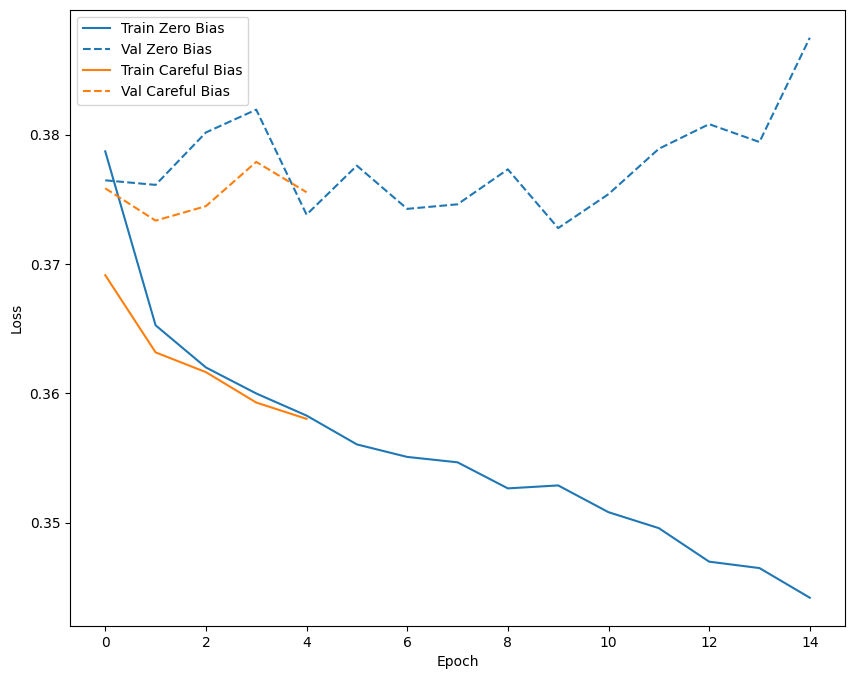

In [110]:
plot_loss(zero_bias_history,'Zero Bias',0)
plot_loss(careful_bias_history,'Careful Bias',1)

### Train the model

In [ ]:
model = ANN_model()
model.load_weights(initial_weights)
baseline_history = model.fit(x_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[callback],validation_data=(x_val,y_val),verbose=1)

Epoch 1/500
1126/1126 [==============================] - 3s 1ms/step - loss: 0.3668 - tp: 9895.0000 - fp: 1355.0000 - tn: 0.0000e+00 - fn: 3.0000 - accuracy: 0.8793 - precision: 0.8796 - recall: 0.9997 - auc: 0.5480 - prc: 0.8974 - val_loss: 0.3741 - val_tp: 1971.0000 - val_fp: 280.0000 - val_tn: 0.0000e+00 - val_fn: 0.0000e+00 - val_accuracy: 0.8756 - val_precision: 0.8756 - val_recall: 1.0000 - val_auc: 0.5623 - val_prc: 0.8980
Epoch 2/500
1126/1126 [==============================] - 1s 1ms/step - loss: 0.3613 - tp: 7927.0000 - fp: 1075.0000 - tn: 0.0000e+00 - fn: 0.0000e+00 - accuracy: 0.8806 - precision: 0.8806 - recall: 1.0000 - auc: 0.5802 - prc: 0.9094 - val_loss: 0.3747 - val_tp: 1971.0000 - val_fp: 280.0000 - val_tn: 0.0000e+00 - val_fn: 0.0000e+00 - val_accuracy: 0.8756 - val_precision: 0.8756 - val_recall: 1.0000 - val_auc: 0.5658 - val_prc: 0.8989
Epoch 3/500
1126/1126 [==============================] - 1s 996us/step - loss: 0.3585 - tp: 7927.0000 - fp: 1075.0000 - tn: 0.00

### Check training history

In [ ]:
def plot_metrics(history):
  metrics=['loss','accuracy','precision','recall','prc','auc']
  for n, metric in enumerate(metrics):
    name = metric.replace("_"," ").capitalize()
    plt.subplot(3,2,n+1)
    plt.plot(history.epoch, history.history[metric], color=colors[0], label='Train')
    plt.plot(history.epoch, history.history['val_'+metric],
             color=colors[1], linestyle="--", label='Val')
    plt.xlabel('Epoch')
    plt.ylabel(name)
    plt.legend()
    plt.subplots_adjust(wspace=0.5,hspace=0.5)

    if metric in ['precision','auc','accuracy','prc'] :
      plt.ylim([0.50,plt.ylim()[1]])
    elif metric=='loss':
      plt.ylim([0.3,plt.ylim()[1]])
    else:
      plt.ylim([plt.ylim()[0],plt.ylim()[1]])

  plt.show()

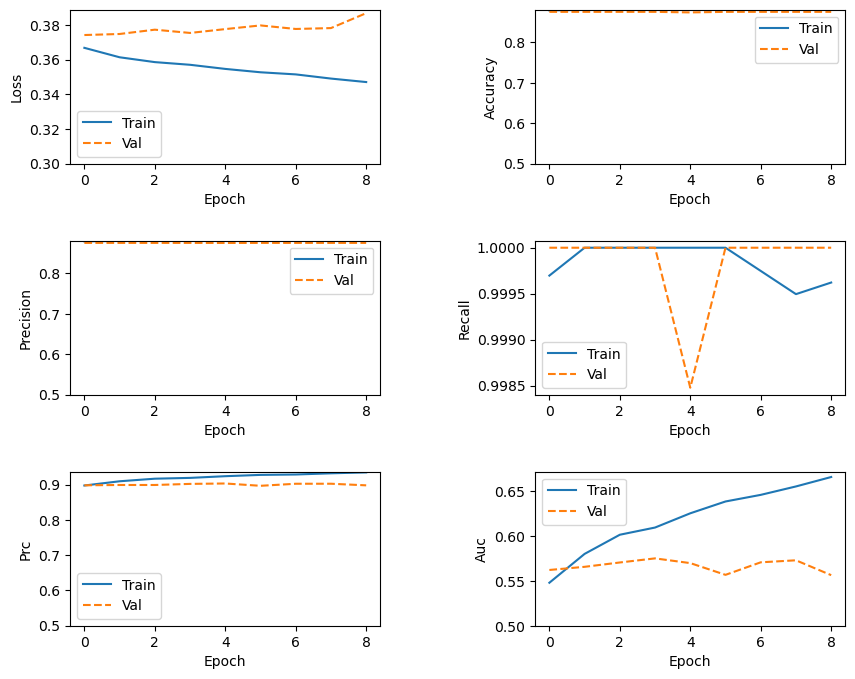

In [ ]:
plot_metrics(baseline_history)

### Evaluate metrics

In [ ]:
train_predictions_baseline = model.predict(x_train,batch_size=BATCH_SIZE)
test_predictions_baseline = model.predict(x_test,batch_size=BATCH_SIZE)

352/352 [==============================] - 0s 560us/step


In [ ]:
def plot_cm(labels, predictions, threshold=0.5):
  cm = confusion_matrix(labels, predictions > threshold)
  plt.figure(figsize=(5,5))
  sns.heatmap(cm, annot=True, fmt="d")
  plt.title('Confusion matrix @{:.2f}'.format(threshold))
  plt.ylabel('Actual label')
  plt.xlabel('Predicted label')

  print('Legitimate Transactions Detected (True Negatives): ', cm[0][0])
  print('Legitimate Transactions Incorrectly Detected (False Positives): ', cm[0][1])
  print('Fraudulent Transactions Missed (False Negatives): ', cm[1][0])
  print('Fraudulent Transactions Detected (True Positives): ', cm[1][1])
  print('Total Fraudulent Transactions: ', np.sum(cm[1]))

loss :  0.37680894136428833
tp :  2465.0
fp :  349.0
tn :  0.0
fn :  0.0
accuracy :  0.8759772777557373
precision :  0.8759772777557373
recall :  1.0
auc :  0.5542738437652588
prc :  0.8952875137329102

Legitimate Transactions Detected (True Negatives):  0
Legitimate Transactions Incorrectly Detected (False Positives):  349
Fraudulent Transactions Missed (False Negatives):  0
Fraudulent Transactions Detected (True Positives):  2465
Total Fraudulent Transactions:  2465


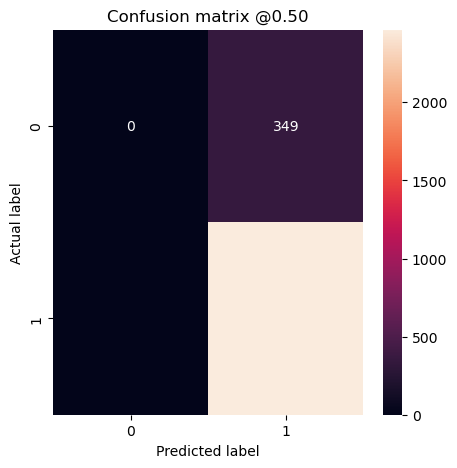

In [ ]:
baseline_results = model.evaluate(x_test,y_test,batch_size=BATCH_SIZE,verbose=0)
for name, value in zip(model.metrics_names, baseline_results):
  print(name, ': ', value)
print()

plot_cm(y_test, test_predictions_baseline)

### Plot the ROC

In [ ]:
def plot_roc(name, labels, predictions, **kwargs):
  fp, tp, _ = roc_curve(labels, predictions)

  plt.plot(100*fp, 100*tp, label=name, linewidth=2, **kwargs)
  plt.xlabel('False positives [%]')
  plt.ylabel('True positives [%]')
  plt.xlim([-0.5,100])
  plt.ylim()
  plt.grid(True)
  ax = plt.gca()
  ax.set_aspect('equal')

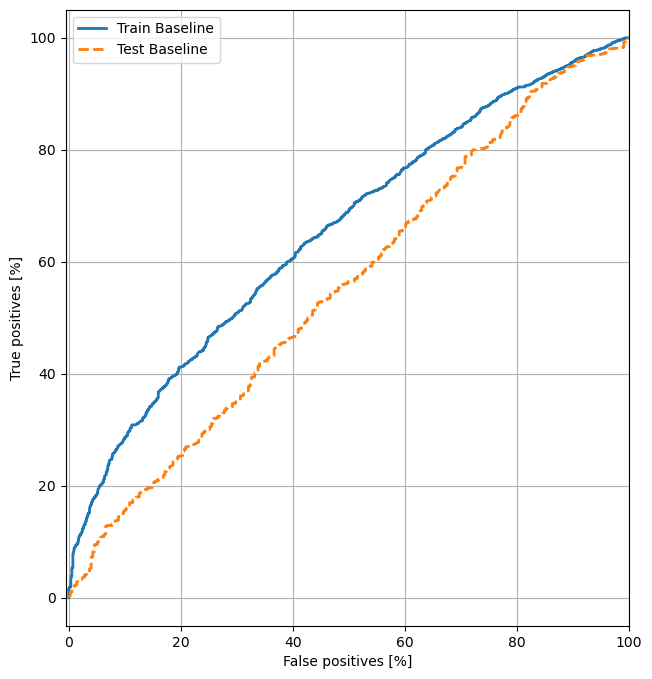

In [ ]:
plot_roc("Train Baseline", y_train, train_predictions_baseline, color=colors[0])
plot_roc("Test Baseline", y_test, test_predictions_baseline, color=colors[1], linestyle='--')
plt.legend()

### Plot the PRC

In [ ]:
def plot_prc(name, labels, predictions, **kwargs):
    precision, recall, _ = precision_recall_curve(labels, predictions)
    
    plt.plot(precision, recall, label=name, linewidth=2, **kwargs)
    plt.xlim([-0.05,1.0])
    plt.ylim([-0.05,1.0])
    plt.xlabel('Precision')
    plt.ylabel('Recall')
    plt.grid(True)
    ax = plt.gca()
    ax.set_aspect('equal')

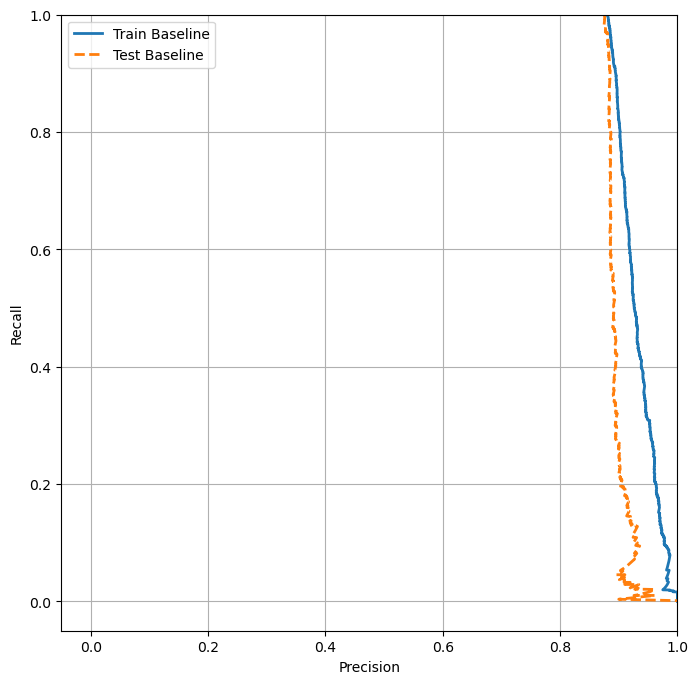

In [ ]:
plot_prc("Train Baseline", y_train, train_predictions_baseline, color=colors[0])
plot_prc("Test Baseline", y_test, test_predictions_baseline, color=colors[1], linestyle='--')
plt.legend()

#### calculate class weights

In [ ]:
# weight_for_0 = (1/neg)*(total/2.0)
# weight_for_1 = (1/pos)*(total/2.0)
weight_for_0 = 2.0
weight_for_1 = 0.5

class_weight = {0:weight_for_0,1:weight_for_1}

print('Weight for class 0: {:.2f}'.format(weight_for_0))
print('Weight for class 1: {:.2f}'.format(weight_for_1))


Weight for class 0: 2.00
Weight for class 1: 0.50


#### Train a model with class weights

In [ ]:
weighted_model = ANN_model()
weighted_model.load_weights(initial_weights)

weighted_history = weighted_model.fit(x_train,y_train,epochs=EPOCHS,
                                      batch_size=BATCH_SIZE,callbacks=[callback],
                                      validation_data=(x_val,y_val),
                                      class_weight=class_weight,verbose=1)

Epoch 1/500
1126/1126 [==============================] - 3s 1ms/step - loss: 0.4487 - tp: 10006.0000 - fp: 1359.0000 - tn: 65.0000 - fn: 386.0000 - accuracy: 0.8523 - precision: 0.8804 - recall: 0.9629 - auc: 0.5264 - prc: 0.8884 - val_loss: 0.4441 - val_tp: 1971.0000 - val_fp: 280.0000 - val_tn: 0.0000e+00 - val_fn: 0.0000e+00 - val_accuracy: 0.8756 - val_precision: 0.8756 - val_recall: 1.0000 - val_auc: 0.5525 - val_prc: 0.8972
Epoch 2/500
1126/1126 [==============================] - 1s 1ms/step - loss: 0.4348 - tp: 7736.0000 - fp: 1033.0000 - tn: 42.0000 - fn: 191.0000 - accuracy: 0.8640 - precision: 0.8822 - recall: 0.9759 - auc: 0.5760 - prc: 0.9093 - val_loss: 0.5472 - val_tp: 1786.0000 - val_fp: 255.0000 - val_tn: 25.0000 - val_fn: 185.0000 - val_accuracy: 0.8045 - val_precision: 0.8751 - val_recall: 0.9061 - val_auc: 0.5441 - val_prc: 0.8951
Epoch 3/500
1126/1126 [==============================] - 1s 1ms/step - loss: 0.4293 - tp: 7652.0000 - fp: 1019.0000 - tn: 56.0000 - fn: 27

#### Check training history

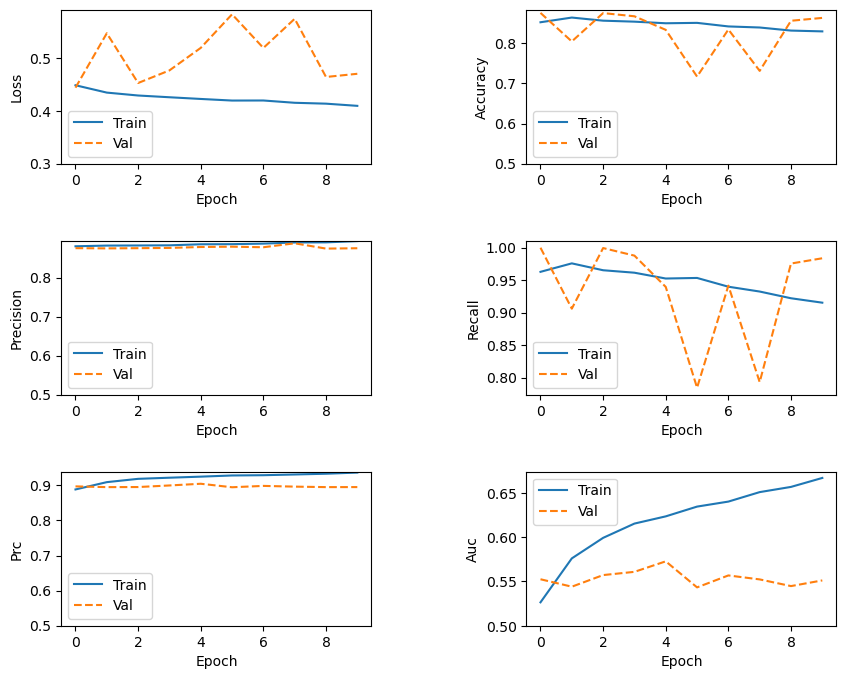

In [ ]:
plot_metrics(weighted_history)

#### Evaluate metrics

In [ ]:
train_predictions_weighted = weighted_model.predict(x_train,batch_size=BATCH_SIZE)
test_predictions_weighted = weighted_model.predict(x_test,batch_size=BATCH_SIZE)

352/352 [==============================] - 0s 542us/step


loss :  0.527407705783844
tp :  2322.0
fp :  316.0
tn :  33.0
fn :  143.0
accuracy :  0.836887001991272
precision :  0.8802123069763184
recall :  0.9419878125190735
auc :  0.5543797016143799
prc :  0.8965396881103516

Legitimate Transactions Detected (True Negatives):  33
Legitimate Transactions Incorrectly Detected (False Positives):  316
Fraudulent Transactions Missed (False Negatives):  143
Fraudulent Transactions Detected (True Positives):  2322
Total Fraudulent Transactions:  2465


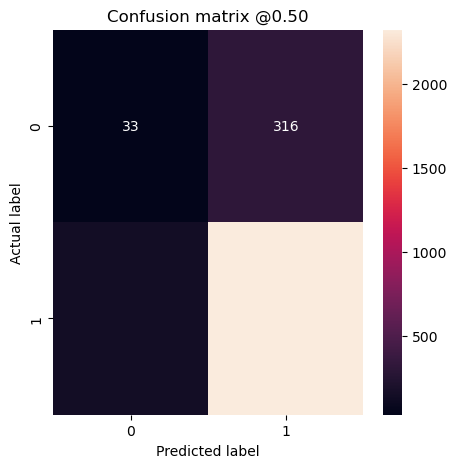

In [ ]:
weighted_results = weighted_model.evaluate(x_test,y_test,batch_size=BATCH_SIZE,verbose=0)
for name, value in zip(weighted_model.metrics_names, weighted_results):
  print(name, ': ', value)
print()

plot_cm(y_test, test_predictions_weighted)

#### Plot the ROC

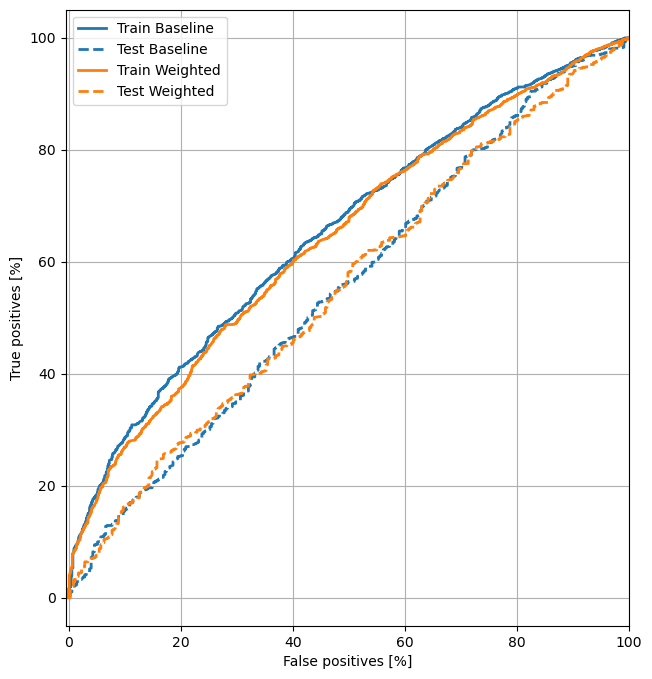

In [ ]:
plot_roc("Train Baseline", y_train, train_predictions_baseline, color=colors[0])
plot_roc("Test Baseline", y_test, test_predictions_baseline, color=colors[0], linestyle='--')

plot_roc("Train Weighted", y_train, train_predictions_weighted, color=colors[1])
plot_roc("Test Weighted", y_test, test_predictions_weighted, color=colors[1], linestyle='--')


plt.legend()

#### Plot the PRC

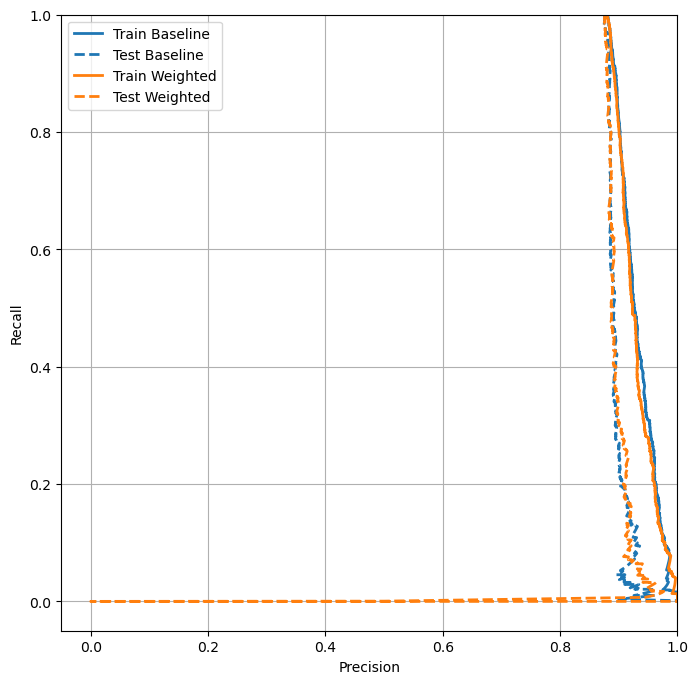

In [ ]:
plot_prc("Train Baseline", y_train, train_predictions_baseline, color=colors[0])
plot_prc("Test Baseline", y_test, test_predictions_baseline, color=colors[0], linestyle='--')

plot_prc("Train Weighted", y_train, train_predictions_weighted, color=colors[1])
plot_prc("Test Weighted", y_test, test_predictions_weighted, color=colors[1], linestyle='--')


plt.legend()

#### oversample the minority class

In [111]:
smote = SMOTE(random_state=42)
x_resampled, y_resampled = smote.fit_resample(x_scaler, y)


In [112]:
x_resampled = pd.DataFrame(x_resampled,columns=feature_name)

#### check the distribution

In [113]:
y_resampled.value_counts()

survive
1    12363
0    12363
Name: count, dtype: int64

#### split the data

In [114]:
x_train_resampled, x_test_resampled, y_train_resampled, y_test_resampled = train_test_split(x_resampled,y_resampled,test_size=0.2,random_state=42)
x_train_resampled, x_val_resampled, y_train_resampled, y_val_resampled = train_test_split(x_train_resampled,y_train_resampled,test_size=0.2,random_state=42)

#### Train on the oversampled data

In [115]:
resampled_model = ANN_model()
resampled_model.load_weights(initial_weights)
# reset the bias to zero, since the dataset is balanced
output_layer = resampled_model.layers[-1]
output_layer.bias.assign([0])

resampled_model.summary()

C:\Users\kwokt\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\core\dense.py:88: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  the `kernel` weights matrix.


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_20 (Dense)                │ (None, 34)             │           612 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 34)             │         1,190 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 34)             │         1,190 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 1)              │            35 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,027 (11.82 KB)

 Trainable params: 3,027 (11.82 KB)

 Non-trainable params: 0 (0.00 B)

In [116]:
resampled_history = resampled_model.fit(x_train_resampled,y_train_resampled,epochs=EPOCHS,
                              batch_size=BATCH_SIZE,verbose=1,
                              callbacks=[callback],validation_data=(x_val_resampled,y_val_resampled))

Epoch 1/500


1978/1978 ━━━━━━━━━━━━━━━━━━━━ 3s 957us/step - accuracy: 0.6437 - auc: 0.6811 - fn: 1764.4088 - fp: 2081.1440 - loss: 0.6904 - prc: 0.7798 - precision: 0.6885 - recall: 0.7350 - tn: 2112.6641 - tp: 4212.7793 - val_accuracy: 0.5956 - val_auc: 0.6342 - val_fn: 973.0000 - val_fp: 627.0000 - val_loss: 0.6650 - val_prc: 0.6417 - val_precision: 0.6134 - val_recall: 0.5056 - val_tn: 1361.0000 - val_tp: 995.0000
Epoch 2/500
1978/1978 ━━━━━━━━━━━━━━━━━━━━ 2s 766us/step - accuracy: 0.5927 - auc: 0.6298 - fn: 1829.5012 - fp: 1405.3826 - loss: 0.6643 - prc: 0.6391 - precision: 0.6092 - recall: 0.5316 - tn: 2516.7747 - tp: 2168.3376 - val_accuracy: 0.6016 - val_auc: 0.6515 - val_fn: 1024.0000 - val_fp: 552.0000 - val_loss: 0.6523 - val_prc: 0.6657 - val_precision: 0.6310 - val_recall: 0.4797 - val_tn: 1436.0000 - val_tp: 944.0000
Epoch 3/500
1978/1978 ━━━━━━━━━━━━━━━━━━━━ 1s 747us/step - accuracy: 0.6152 - auc: 0.6661 - fn: 1718.0208 - fp: 1338.5043 - loss: 0.6474 - prc: 0.6765 - precision: 0.6310 

#### check training history

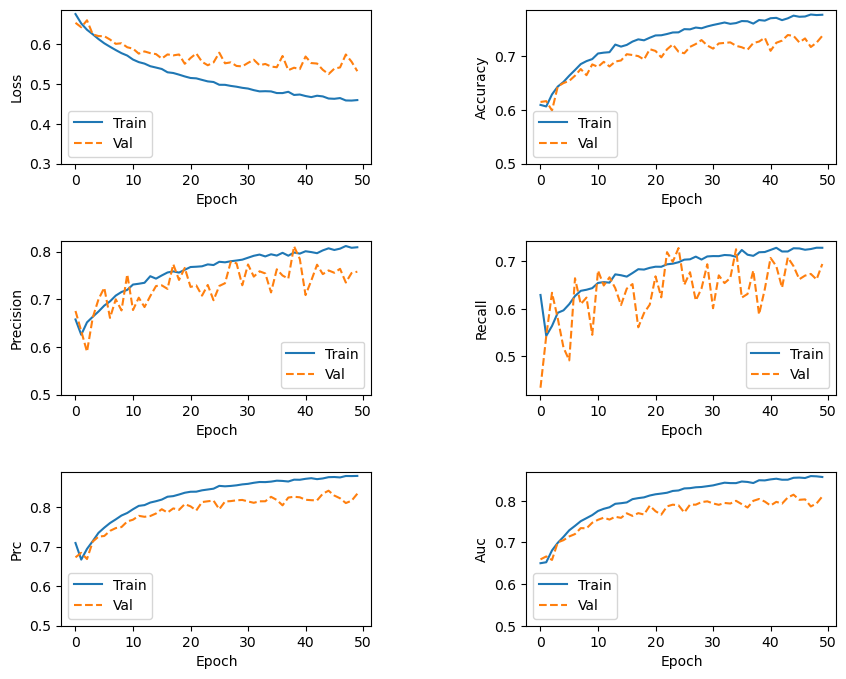

In [ ]:
plot_metrics(resampled_history)

#### evaluate metrics

In [117]:
y_train_pred_resampled = resampled_model.predict(x_train_resampled,batch_size=BATCH_SIZE)
y_test_pred_resampled = resampled_model.predict(x_test_resampled,batch_size=BATCH_SIZE)

1978/1978 ━━━━━━━━━━━━━━━━━━━━ 1s 343us/step
619/619 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step


loss :  0.5492171049118042
tp :  1627.0
fp :  542.0
tn :  1975.0
fn :  802.0
accuracy :  0.7282652854919434
precision :  0.7501152753829956
recall :  0.6698229908943176
auc :  0.7959793210029602
prc :  0.8183050155639648

Legitimate Transactions Detected (True Negatives):  1975
Legitimate Transactions Incorrectly Detected (False Positives):  542
Fraudulent Transactions Missed (False Negatives):  802
Fraudulent Transactions Detected (True Positives):  1627
Total Fraudulent Transactions:  2429


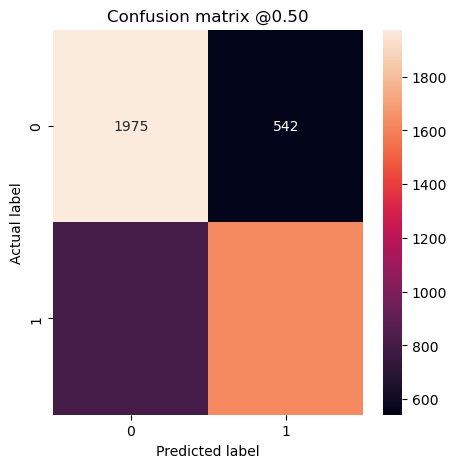

In [ ]:
resampled_results = resampled_model.evaluate(x_test_resampled, y_test_resampled,batch_size=BATCH_SIZE, verbose=0)
for name, value in zip(resampled_model.metrics_names, resampled_results):
  print(name, ': ', value)
print()

plot_cm(y_test_resampled, y_test_pred_resampled)

#### plot the ROC

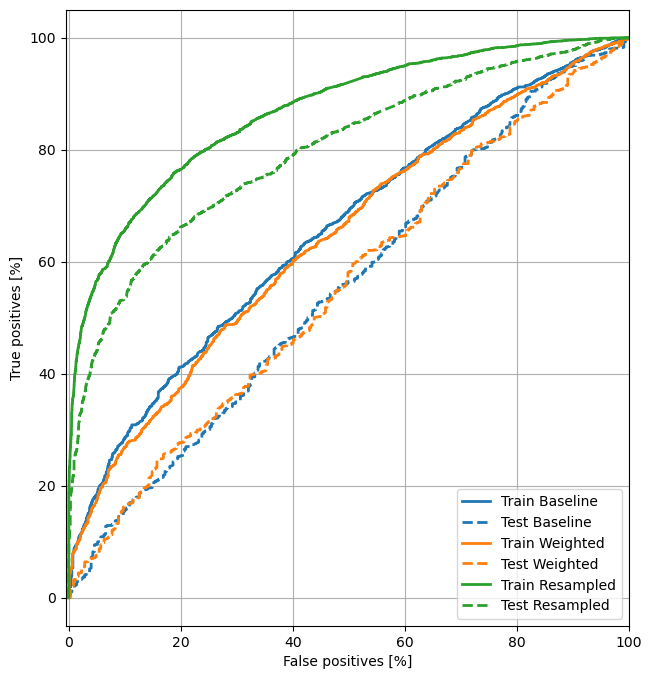

In [ ]:
plot_roc("Train Baseline", y_train, train_predictions_baseline, color=colors[0])
plot_roc("Test Baseline", y_test, test_predictions_baseline, color=colors[0], linestyle='--')
plot_roc("Train Weighted", y_train, train_predictions_weighted, color=colors[1])
plot_roc("Test Weighted", y_test, test_predictions_weighted, color=colors[1], linestyle='--')
plot_roc("Train Resampled", y_train_resampled, y_train_pred_resampled, color=colors[2])
plot_roc("Test Resampled", y_test_resampled, y_test_pred_resampled, color=colors[2], linestyle='--')
plt.legend(loc='lower right')

#### plot the AUPRC

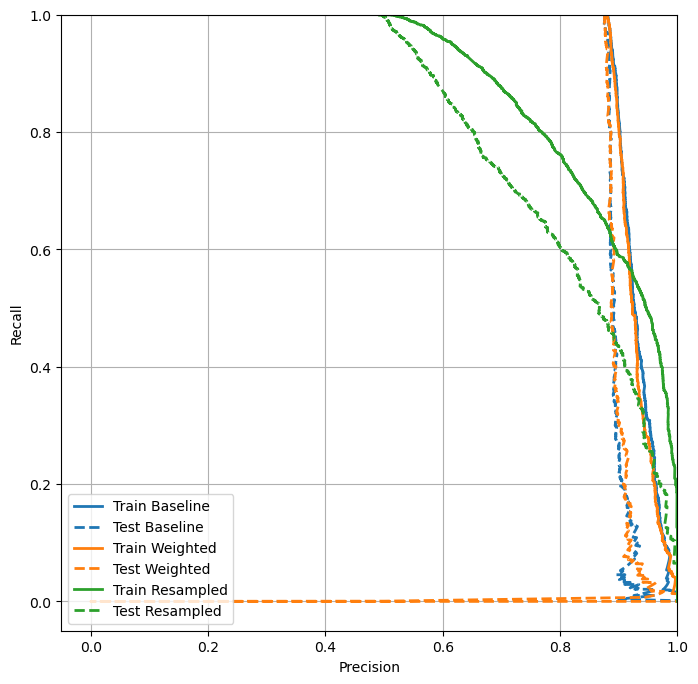

In [ ]:
plot_prc("Train Baseline", y_train, train_predictions_baseline, color=colors[0])
plot_prc("Test Baseline", y_test, test_predictions_baseline, color=colors[0], linestyle='--')

plot_prc("Train Weighted", y_train, train_predictions_weighted, color=colors[1])
plot_prc("Test Weighted", y_test, test_predictions_weighted, color=colors[1], linestyle='--')

plot_prc("Train Resampled", y_train_resampled, y_train_pred_resampled, color=colors[2])
plot_prc("Test Resampled", y_test_resampled, y_test_pred_resampled, color=colors[2], linestyle='--')

plt.legend(loc='lower left')

#### feature importance

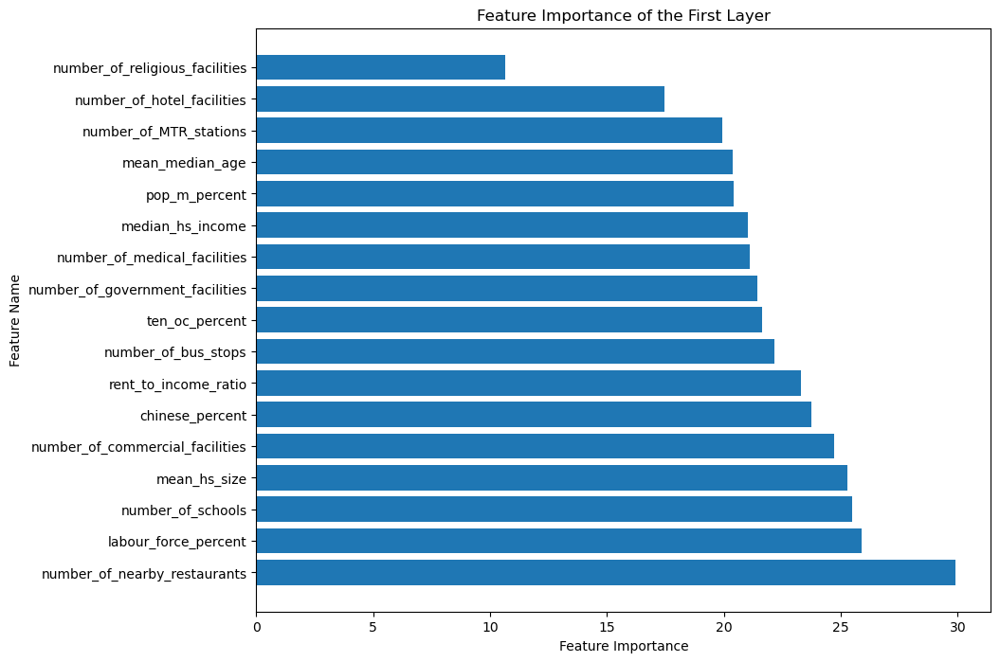

In [ ]:
# get the weights of the first layer
weights = resampled_model.layers[0].get_weights()[0]

# calculate the feature importance
feature_importance = abs(weights).sum(axis=1)

# sort the feature importance in descending order
sorted_indices = feature_importance.argsort()[::-1]
sorted_feature_importance = feature_importance[sorted_indices]
sorted_feature_name = feature_name[sorted_indices]

# plot the feature importance(bar plot)
plt.figure(figsize=(10,8))
plt.barh(sorted_feature_name,sorted_feature_importance)
plt.yticks(range(len(sorted_feature_name)),sorted_feature_name)
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')
plt.title('Feature Importance of the First Layer')
plt.show()



  1/155 [..............................] - ETA: 2s

155/155 [==============================] - 0s 589us/step


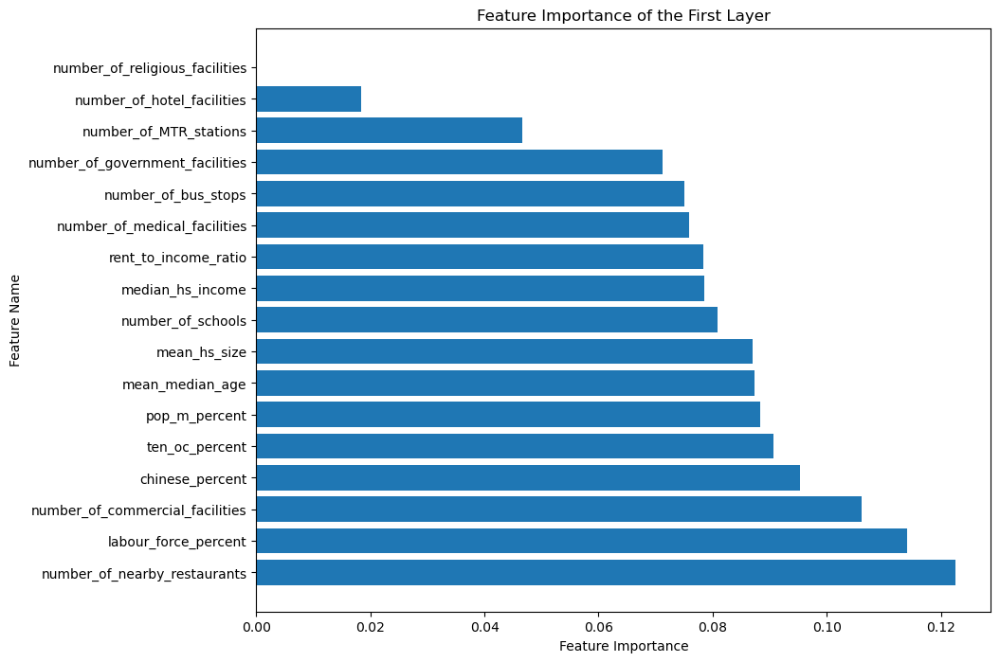

In [ ]:
def score(x,y):
    y_pred = resampled_model.predict(x)
    return accuracy_score(y,y_pred>0.5)

base_score,score_decrease = get_score_importances(score,x_test_resampled.values,y_test_resampled.values,random_state=42)
feature_importance = np.mean(score_decrease,axis=0)

sorted_indices = feature_importance.argsort()[::-1]
sorted_feature_importance = feature_importance[sorted_indices]
sorted_feature_name = feature_name[sorted_indices]

plt.figure(figsize=(10,8))
plt.barh(sorted_feature_name,sorted_feature_importance)
plt.yticks(range(len(sorted_feature_name)),sorted_feature_name)
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')
plt.title('Feature Importance of the First Layer')
plt.show()

#### save model

In [126]:
# serialize weights to HDF5
resampled_model.save_weights(save_path + "model_ANN_weight.weights.h5")
# save model as h5
resampled_model.save(save_path + "model_ANN.h5")
resampled_model.save(save_path+"model_ANN.keras")

### Logistic Regression model

In [32]:
# import libraries
import os
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.impute import KNNImputer

# function to load x
def load_x(data_path):
    df_x = pd.read_csv(data_path)
    # return the 7th and the second last column of the test data
    df_x = df_x.iloc[:,7:-1]
    # fill the missing data with the mean of the column
    df_x.loc[df_x['median_hs_income']=='**', 'median_hs_income'] = np.nan
    df_x['median_hs_income'] = df_x['median_hs_income'].astype(float)
    columns = [x for x in df_x.columns]
    impute = KNNImputer()
    df_x = impute.fit_transform(df_x)
    df_x = pd.DataFrame(df_x,columns=columns)
    return df_x

# function to load y
def load_y(data_path):
    df_y = pd.read_csv(data_path)
    df_y = df_y.iloc[:,-1]
    # fill the missing data with the mode of the column
    df_y = df_y.fillna(df_y.mode())
    return df_y

# for this group project, we use 'data\Master\RL.csv' for training model
# load the data
x = load_x('data/Master/RL.csv')

# load the target column
y = load_y('data/Master/RL.csv')

# Standard scaling the data, except the target column
scaler = StandardScaler()
x_scaler = scaler.fit_transform(x)

In [33]:
# Train logistic regression model without oversampling
x_train, x_test, y_train, y_test = train_test_split(x_scaler, y, test_size=0.2, random_state=42)
logistic_1 = LogisticRegression()
logistic_1.fit(x_train, y_train)

LogisticRegression()

In [34]:
# oversample the minority class
smote = SMOTE(random_state=42)
x_resampled, y_resampled = smote.fit_resample(x_scaler, y)

# split the data
x_train_resampled, x_test_resampled, y_train_resampled, y_test_resampled = train_test_split(x_resampled,y_resampled,test_size=0.2,random_state=42)

# Train on the oversampled data with Logistic Regression
logistic_2 = LogisticRegression()
logistic_2.fit(x_train_resampled, y_train_resampled)

LogisticRegression()

In [39]:
# export the logistic regression model
import joblib
joblib.dump(logistic_1, 'model/logistic_regression_model_1.pkl')
joblib.dump(logistic_2, 'model/logistic_regression_model_2.pkl')

['model/logistic_regression_model_2.pkl']

In [36]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# set-up color
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

# confusion matrix
def plot_cm(labels, predictions, threshold=0.5):
    cm = confusion_matrix(labels, predictions > threshold)
    plt.figure(figsize=(5,5))
    sns.heatmap(cm, annot=True, fmt="d")
    plt.title('Confusion matrix @{:.2f}'.format(threshold))
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')

    print('Legitimate Transactions Detected (True Negatives): ', cm[0][0])
    print('Legitimate Transactions Incorrectly Detected (False Positives): ', cm[0][1])
    print('Fraudulent Transactions Missed (False Negatives): ', cm[1][0])
    print('Fraudulent Transactions Detected (True Positives): ', cm[1][1])
    print('Total Fraudulent Transactions: ', np.sum(cm[1]))

Legitimate Transactions Detected (True Negatives):  0
Legitimate Transactions Incorrectly Detected (False Positives):  349
Fraudulent Transactions Missed (False Negatives):  0
Fraudulent Transactions Detected (True Positives):  2465
Total Fraudulent Transactions:  2465


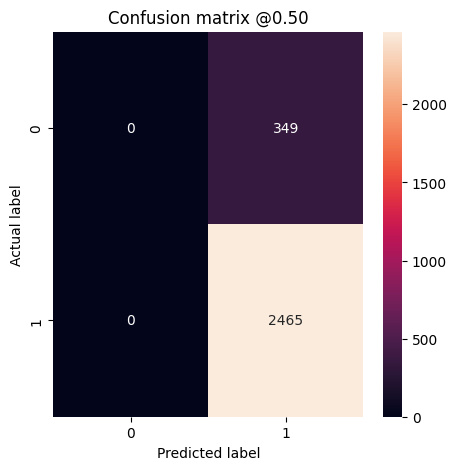

In [37]:
# plot confusion matrix for logistic regression model 1
y_test_pred_1 = logistic_1.predict(x_test)
plot_cm(y_test, y_test_pred_1)

Legitimate Transactions Detected (True Negatives):  1419
Legitimate Transactions Incorrectly Detected (False Positives):  1098
Fraudulent Transactions Missed (False Negatives):  1165
Fraudulent Transactions Detected (True Positives):  1264
Total Fraudulent Transactions:  2429


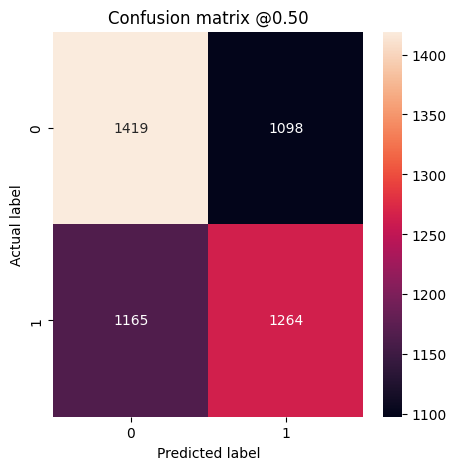

In [40]:
# plot confusion matrix for logistic regression model 2
y_test_pred_2 = logistic_2.predict(x_test_resampled)
plot_cm(y_test_resampled, y_test_pred_2)

ROC AUC for Logistic Regression Model 1: 0.5499851793301057
ROC AUC for Logistic Regression Model 2: 0.545578252322249


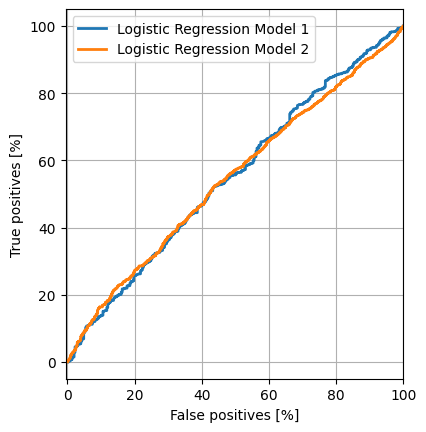

In [50]:
# plot ROC curve for logistic regression model 1 and logistic regression model 2
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

## Plot the ROC
def plot_roc(name, labels, predictions, **kwargs):
  fp, tp, _ = roc_curve(labels, predictions)

  plt.plot(100*fp, 100*tp, label=name, linewidth=2, **kwargs)
  plt.xlabel('False positives [%]')
  plt.ylabel('True positives [%]')
  plt.xlim([-0.5,100])
  plt.ylim()
  plt.grid(True)
  ax = plt.gca()
  ax.set_aspect('equal')

# plot the roc curve for logistic regression model 1 and logistic regression model 2
plot_roc("Logistic Regression Model 1", y_test, y_test_pred_prob_1, color=colors[0])
plot_roc("Logistic Regression Model 2", y_test_resampled, y_test_pred_prob_2, color=colors[1])

# calculate the roc auc
roc_auc_1 = roc_auc_score(y_test, y_test_pred_prob_1)
roc_auc_2 = roc_auc_score(y_test_resampled, y_test_pred_prob_2)
print(f'ROC AUC for Logistic Regression Model 1: {roc_auc_1}')
print(f'ROC AUC for Logistic Regression Model 2: {roc_auc_2}')

AUPRC for Logistic Regression Model 1: 0.892
AUPRC for Logistic Regression Model 2: 0.542


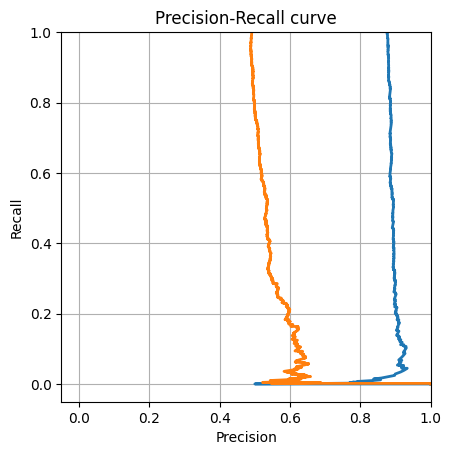

In [55]:
from sklearn.metrics import average_precision_score

# function to plot auprc
def plot_prc(name, labels, predictions, **kwargs):
    precision, recall, _ = precision_recall_curve(labels, predictions)
    
    plt.plot(precision, recall, label=name, linewidth=2, **kwargs)
    plt.xlim([-0.05,1.0])
    plt.ylim([-0.05,1.0])
    plt.xlabel('Precision')
    plt.ylabel('Recall')
    plt.grid(True)
    ax = plt.gca()
    ax.set_aspect('equal')
    
# plot the AUPRC for logistic regression model 1 and logistic regression model 2
plot_prc("Logistic Regression Model 1", y_test, y_test_pred_prob_1, color=colors[0])
plot_prc("Logistic Regression Model 2", y_test_resampled, y_test_pred_prob_2, color=colors[1])
plt.title('Precision-Recall curve')

# calculate the auprc
auprc_1 = average_precision_score(y_test, y_test_pred_prob_1)
auprc_2 = average_precision_score(y_test_resampled, y_test_pred_prob_2)
print('AUPRC for Logistic Regression Model 1: %.3f' % auprc_1)
print('AUPRC for Logistic Regression Model 2: %.3f' % auprc_2)

In [60]:
# calculate loss, true possitive, false possitive, true negative, false negative, accuracy, precision, recall, auc, prc for logistic regression model 2
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, roc_auc_score, precision_recall_curve, auc
from sklearn.metrics import log_loss

loss = log_loss(y_test_resampled, y_test_pred_prob_2, eps=1e-15) 

true_positive = confusion_matrix(y_test_resampled, y_test_pred_2)[1,1]
false_positive = confusion_matrix(y_test_resampled, y_test_pred_2)[0,1]
true_negative = confusion_matrix(y_test_resampled, y_test_pred_2)[0,0]
false_negative = confusion_matrix(y_test_resampled, y_test_pred_2)[1,0]
accuracy = accuracy_score(y_test_resampled, y_test_pred_2)
precision = precision_score(y_test_resampled, y_test_pred_2)
recall = recall_score(y_test_resampled, y_test_pred_2)
roc_auc = roc_auc_score(y_test_resampled, y_test_pred_2)

print('Logistic Regression Model 2 performance:')
print(f'Loss: {loss}')
print(f'True Positive: {true_positive}')
print(f'False Positive: {false_positive}')
print(f'True Negative: {true_negative}')
print(f'False Negative: {false_negative}')
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'AUC: {roc_auc}')

Logistic Regression Model 2 performance:
Loss: 0.6904201427283352
True Positive: 1264
False Positive: 1098
True Negative: 1419
False Negative: 1165
Accuracy: 0.542458552365548
Precision: 0.5351397121083827
Recall: 0.5203787566899959
AUC: 0.5420725726239015


C:\Users\kwokt\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:2910: FutureWarning: Setting the eps parameter is deprecated and will be removed in 1.5. Instead eps will always havea default value of `np.finfo(y_pred.dtype).eps`.
  warnings.warn(


### Model performance comparasion:

#### ANN

* loss :  0.5492171049118042
* tp :  1627.0
* fp :  542.0
* tn :  1975.0
* fn :  802.0
* accuracy :  0.7282652854919434
* precision :  0.7501152753829956
* recall :  0.6698229908943176
* auc :  0.7959793210029602


#### Logistic regression:

* Loss: 0.6904201427283352
* True Positive: 1264
* False Positive: 1098
* True Negative: 1419
* False Negative: 1165
* Accuracy: 0.542458552365548
* Precision: 0.5351397121083827
* Recall: 0.5203787566899959
* AUC: 0.5420725726239015

In [7]:
# https://datascience.stackexchange.com/questions/44644/how-to-determine-feature-importance-in-a-neural-network
from keras.models import load_model
import pandas as pd
import numpy as np
from sklearn.impute import KNNImputer

ANN_model = load_model('model/model_ANN.keras')

# function to load x
def load_x(data_path):
    df_x = pd.read_csv(data_path)
    # return the 7th and the second last column of the test data
    df_x = df_x.iloc[:,7:-1]
    # fill the missing data with the mean of the column
    df_x.loc[df_x['median_hs_income']=='**', 'median_hs_income'] = np.nan
    df_x['median_hs_income'] = df_x['median_hs_income'].astype(float)
    columns = [x for x in df_x.columns]
    impute = KNNImputer()
    df_x = impute.fit_transform(df_x)
    df_x = pd.DataFrame(df_x,columns=columns)
    return df_x


# function to load y
def load_y(data_path):
    df_y = pd.read_csv(data_path)
    df_y = df_y.iloc[:,-1]
    # fill the missing data with the mode of the column
    df_y = df_y.fillna(df_y.mode())
    return df_y

path = 'data/Master/RL.csv'

# load the data
x = load_x(path)
y = load_y(path)

In [16]:
# map with feature attributs, then show the feature importance
feature_name = x.columns
feature_name

Index(['number_of_nearby_restaurants', 'number_of_bus_stops',
       'number_of_MTR_stations', 'number_of_schools',
       'number_of_commercial_facilities', 'number_of_government_facilities',
       'number_of_religious_facilities', 'number_of_medical_facilities',
       'number_of_hotel_facilities', 'mean_median_age', 'median_hs_income',
       'mean_hs_size', 'labour_force_percent', 'chinese_percent',
       'pop_m_percent', 'ten_oc_percent', 'rent_to_income_ratio'],
      dtype='object')

In [ ]:
# try to find feature importance score in the ANN model
# randomize 1000 data with similar scale in the dataset


## Adopting XG Boost, Random forest regressor, gradient boosting regressor, Ridge Regressor, XG Regressor to predict which would be the customer's preferrable price range for our restaurant

In [ ]:
#ingredient_counts.to_csv('data/ingredient_counts.csv')

In [ ]:
vegetable_ingredients = [
    'Garlic', 'Tomatoes', 'Red Onions', 'Red Peppers', 'Spinach', 'Mushrooms', 'Artichokes',
    'Green Olives', 'Green Peppers', 'Jalapeno Peppers', 'Corn', 'Sun-dried Tomatoes',
    'Zucchini', 'Cilantro', 'Friggitello Peppers', 'Eggplant', 'Arugula', 'Peperoncini verdi',
    'Plum Tomatoes', 'Onions', 'Artichoke'
]
meat_ingredients = [
    'Pepperoni', 'Chicken', 'Capocollo', 'Bacon', 'Beef Chuck Roast', 'Pancetta',
    'Calabrese Salami', 'Barbecued Chicken', 'Prosciutto di San Daniele', 'Coarse Sicilian Salami',
    'Soppressata Salami', 'Luganega Sausage', 'Nduja Salami', 'Italian Sausage', 'Chorizo Sausage',
    'Prosciutto', 'Genoa Salami', 'Sliced Ham'
]
cheese_ingredients = [
    'Mozzarella Cheese', 'Feta Cheese', 'Asiago Cheese', 'Fontina Cheese', 'Goat Cheese', 'Gouda Cheese',
    'Parmigiano Reggiano Cheese', 'Gorgonzola Piccante Cheese', 'Ricotta Cheese', 'Provolone Cheese',
    'Smoked Gouda Cheese', 'Romano Cheese', 'Blue Cheese', 'Brie Carre Cheese'
]
special_ingredients = [
    'Pesto Sauce', 'Chipotle Sauce', 'Thai Sweet Chilli Sauce', 'Alfredo Sauce', 'Barbecue Sauce',
    'Oregano', 'Thyme', 'Caramelized Onions'
]
fruit_ingredients = [
    'Pineapple', 'Pears'
]
other_ingredients = [
    'Kalamata Olives', 'Anchovies'
]


def process_ingredients(row):
    ingredients = row['pizza_ingredients'].split(',')
    vegetable_count=sum(ingredient.strip() in vegetable_ingredients for ingredient in ingredients)
    meat_count = sum(ingredient.strip() in meat_ingredients for ingredient in ingredients)
    cheese_count=sum(ingredient.strip() in cheese_ingredients for ingredient in ingredients)
    special_ingredients_count = sum(ingredient.strip() in special_ingredients for ingredient in ingredients)
    fruit_ingredients_count = sum(ingredient.strip() in fruit_ingredients for ingredient in ingredients)
    other_ingredients_count = sum(ingredient.strip() in other_ingredients for ingredient in ingredients)
    return  vegetable_count,meat_count, cheese_count,special_ingredients_count,fruit_ingredients_count,other_ingredients_count

pizza_pricing[['meat_count', 'vegetable_count','cheese_count','special_ingredients_count','fruit_ingredients_count','other_ingredients_count']] =pizza_pricing.apply(process_ingredients, axis=1, result_type='expand')
dummies = pd.get_dummies(pizza_pricing[['pizza_size']], prefix='size')
price=pizza_pricing.drop(columns=['pizza_size','pizza_id', 'pizza_name','pizza_ingredients','pizza_category'])
price=pd.concat([price, dummies], axis=1)
price

In [ ]:
price.info()

#### Split data and standardization

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [ ]:
X=price.drop(columns=['unit_price'])
y=price['unit_price']

In [ ]:
X.columns

Index(['meat_count', 'vegetable_count', 'cheese_count',
       'special_ingredients_count', 'fruit_ingredients_count',
       'other_ingredients_count', 'size_L', 'size_M', 'size_S', 'size_XL',
       'size_XXL'],
      dtype='object')

In [ ]:
#Standardized numeric column

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X[['meat_count', 'vegetable_count', 'cheese_count',
                                   'special_ingredients_count', 'fruit_ingredients_count',
                                   'other_ingredients_count']])
X_scaled = pd.DataFrame(X_scaled, columns=['meat_count', 'vegetable_count', 'cheese_count',
                                           'special_ingredients_count', 'fruit_ingredients_count',
                                           'other_ingredients_count'],
                        index=X.index)

X_unscaled = X[['size_L', 'size_M', 'size_S', 'size_XL',
                'size_XXL']]

X_scaled = pd.concat([X_scaled, X_unscaled], axis=1)

X_scaled


,meat_count,vegetable_count,cheese_count,special_ingredients_count,fruit_ingredients_count,other_ingredients_count,size_L,size_M,size_S,size_XL,size_XXL
77,-1.886050,0.080582,0.345043,-0.641756,-0.285299,-0.420969,0,0,1,0,0
93,-1.886050,0.080582,0.345043,-0.641756,3.505098,-0.420969,0,0,1,0,0
127,-0.813251,0.080582,-0.761473,-0.641756,-0.285299,-0.420969,0,0,1,0,0
19,1.868747,-1.168443,-0.761473,1.416290,-0.285299,-0.420969,0,0,1,0,0
35,-1.886050,3.827659,-0.761473,-0.641756,-0.285299,-0.420969,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...
3,0.259548,1.329608,-0.761473,-0.641756,-0.285299,-0.420969,1,0,0,0,0
175,1.332347,-1.168443,-0.761473,1.416290,-0.285299,-0.420969,1,0,0,0,0
427,-1.349651,0.080582,0.345043,3.474336,3.505098,-0.420969,0,0,1,0,0
121,-0.276851,0.080582,0.345043,-0.641756,-0.285299,2.375470,0,0,0,1,0


In [ ]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

#### RandomForestRegressor

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, r2_score,mean_squared_error

In [ ]:
# Define the RandomForestRegressor model
model = RandomForestRegressor(n_estimators=100, random_state=42)
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],  # tree mounts
    'max_depth': [None, 10, 20, 30],  # tree deepth
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required at leaf nodes
}
# GridSearchCV
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, 
                           cv=5, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')

# Training the model
grid_search.fit(X_train, y_train)
print("Best parameters:", grid_search.best_params_)

# Predicting and evaluating the model
y_pred = grid_search.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'r2_score: {r2}')


Fitting 5 folds for each of 108 candidates, totalling 540 fits
Best parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Mean Squared Error: 5.485101538028678
r2_score: 0.6082880448545642


#### GradientBoostingRegressor

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

In [ ]:
gbr_model = GradientBoostingRegressor(random_state=42)
# Define parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],  # tree mounts
    'max_depth': [3, 4, 5],  # tree deepth
    'learning_rate': [0.01, 0.1, 0.2],
    'min_samples_split': [2, 3, 4],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 3]  # Minimum number of samples required at leaf nodes
}
# GridSearchCV
grid_search = GridSearchCV(estimator=gbr_model, param_grid=param_grid, 
                           cv=5, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
# Training the model
grid_search.fit(X_train, y_train)
print("Best parameters found: ", grid_search.best_params_)

y_pred = grid_search.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'r2_score: {r2}')

Fitting 5 folds for each of 243 candidates, totalling 1215 fits


Best parameters found:  {'learning_rate': 0.2, 'max_depth': 4, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
Mean Squared Error: 4.754302134234593
r2_score: 0.6604772087733385


####  RidgeRegression

In [ ]:
from sklearn.linear_model import Ridge

In [ ]:
Ridge_model = Ridge(random_state=42)

#Define parameter grid
param_grid = {
    'alpha': [0.1, 1, 10, 100, 1000]  # Different values of regularization strength
}
#GridSearchCV
grid_search = GridSearchCV(estimator=Ridge_model, param_grid=param_grid, 
                           cv=5, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)
#Train model
grid_search.fit(X_train, y_train)
print("Best parameters found: ", grid_search.best_params_)

y_pred = grid_search.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'r2_score: {r2}')


Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best parameters found:  {'alpha': 0.1}
Mean Squared Error: 4.795180960153753
r2_score: 0.6575578963934625


####  XGBRegressor

In [ ]:
!pip install xgboost

In [ ]:
from xgboost import XGBRegressor

In [ ]:
xgb_model = XGBRegressor(random_state=42)
# Define parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
}
# GridSearchCV
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, 
                           cv=5, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
# Training the model
grid_search.fit(X_train, y_train)
print("Best parameters found: ", grid_search.best_params_)


y_pred = grid_search.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'r2_score: {r2}')

Fitting 5 folds for each of 324 candidates, totalling 1620 fits
Best parameters found:  {'colsample_bytree': 0.8, 'learning_rate': 0.2, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 300, 'subsample': 1.0}
Mean Squared Error: 4.357120018810628
r2_score: 0.6888414937191805


In [ ]:
# Save the model predictions and the actual prices to a DataFrame
results_df = pd.DataFrame({'Actual Price': y_test, 'Predicted Price': y_pred})

# Reset the index for a cleaner look
results_df.reset_index(drop=True, inplace=True)

results_df.head(10)

,Actual Price,Predicted Price
0,16.00,16.021729
1,12.50,12.260967
2,16.75,16.020365
3,20.50,20.242477
4,9.75,9.575288
5,12.75,12.736819
6,16.00,16.043657
7,20.25,20.306557
8,12.00,12.036386
9,16.25,16.249842


Feature Importances:
meat_count: 0.0100
vegetable_count: 0.0011
cheese_count: 0.0016
special_ingredients_count: 0.0035
fruit_ingredients_count: 0.0005
other_ingredients_count: 0.0096
size_L: 0.0271
size_M: 0.1481
size_S: 0.6106
size_XL: 0.0187
size_XXL: 0.1691



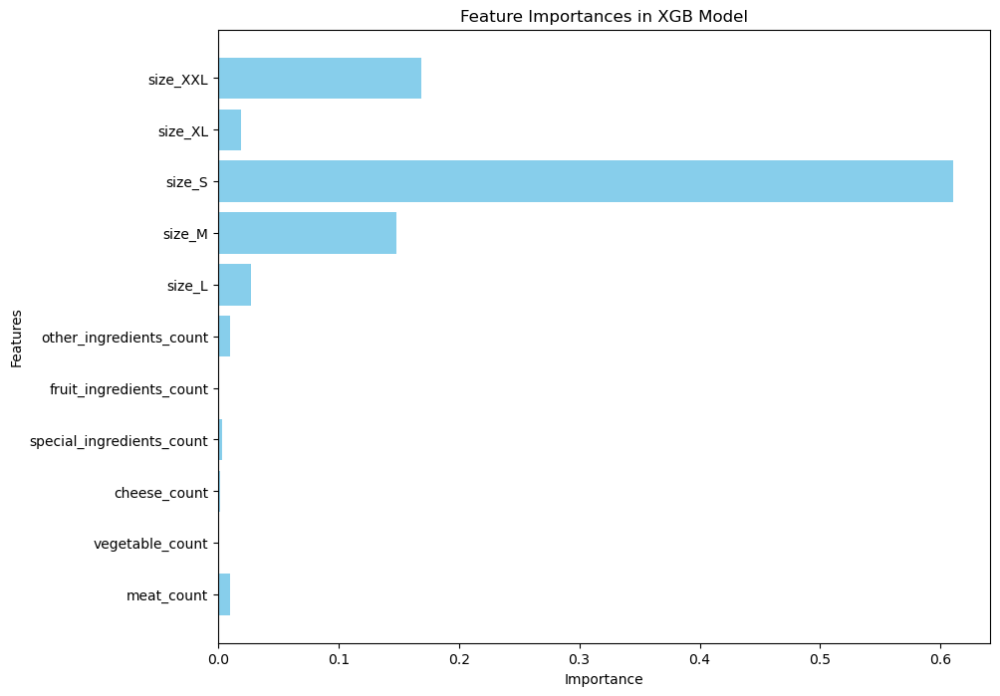

In [ ]:
# Display the characteristic coefficients of the best model
best_xgb_model = grid_search.best_estimator_
features = X_train.columns

# Get feature importance of XGBoost model
feature_importances = best_xgb_model.feature_importances_

# Construct a string representation of feature importance
importance_str = "Feature Importances:\n"
for i, importance in enumerate(feature_importances):
    importance_str += f"{features[i]}: {importance:.4f}\n"
print(importance_str)

# Visualizing feature importance
plt.figure(figsize=(10, 8))
plt.barh(features, feature_importances, color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Feature Importances in XGB Model')
plt.show()

The best performer is XGBRegressor:

We can see the relative measure of each feature's contribution to the model's predictive ability. Size features (such as size_S, size_M, size_XXL) have the greatest contribution to predicting pizza prices, especially the size_S feature, whose feature importance is much higher than other features. It shows that the price change of small-sized pizza has the greatest impact on the prediction of the model compared with other sizes.


The importance of ingredient category features (meat_count, vegetable_count, etc.) is generally low, which means that the number of different types of ingredients contributes less to predicting pizza price compared to size. But among these features, meat_count and other_ingredients_count are relatively more important, which may indicate that the quantity of meat ingredients and other unconventional ingredients affects the price to a certain extent.

## prediction

In [ ]:
import numpy as np

# set a new data example
new_data_example = pd.DataFrame({
    'meat_count': [4],
    'vegetable_count': [2],
    'cheese_count': [2],
    'special_ingredients_count': [2],
    'fruit_ingredients_count': [1],
    'other_ingredients_count': [0],
    'size_L': [0],
    'size_M': [0],
    'size_S': [1],
    'size_XL': [0],
    'size_XXL': [0]
}, index=[0])


# Fit model
predicted_price = grid_search.predict(new_data_example)

# Use MAE to calculate the price range
mae = mean_absolute_error(y_test, y_pred)
price_range_lower = predicted_price - mae
price_range_upper = predicted_price + mae

# Convert numerical values to strings for printing
predicted_price_str = str(predicted_price[0]) if isinstance(predicted_price, np.ndarray) else str(predicted_price)
price_range_lower_str = str(price_range_lower[0]) if isinstance(price_range_lower, np.ndarray) else str(price_range_lower)
price_range_upper_str = str(price_range_upper[0]) if isinstance(price_range_upper, np.ndarray) else str(price_range_upper)

# Print the predicted price and its range
print("Predicted price is: " + predicted_price_str)
print("Range of predicted prices is: [" + price_range_lower_str + ":" + price_range_upper_str + "]")

Predicted price is: 12.781365
Range of predicted prices is: [12.073126:13.489605]


## Adopting Native Bayes, XG Boost and LSTM to analysis which would be the most crucial point affecting the restaurant's rating

## Modeling

In [ ]:
import plotly.figure_factory as ff

x_axes = ['positive', 'negative']
y_axes =  ['negative', 'positive']

def conf_matrix(z, x=x_axes, y=y_axes):

    z = np.flip(z, 0)

    # change each element of z to type string for annotations
    z_text = [[str(y) for y in x] for x in z]

    # set up figure
    fig = ff.create_annotated_heatmap(z, x=x, y=y, annotation_text=z_text, colorscale='Viridis')

    # add title
    fig.update_layout(title_text='<b>Confusion matrix</b>',
                      xaxis = dict(title='Predicted value'),
                      yaxis = dict(title='Real value')
                     )

    # add colorbar
    fig['data'][0]['showscale'] = True

    return fig

In [ ]:
# Create a Multinomial Naive Bayes model
from sklearn.naive_bayes import MultinomialNB
nb = MultinomialNB()

# Train the model
nb.fit(x_train_dtm, y_train)

MultinomialNB()

### Naive Bayes DTM

In [ ]:
# Make class anf probability predictions
y_pred_class = nb.predict(x_test_dtm)
y_pred_prob = nb.predict_proba(x_test_dtm)[:, 1]

In [ ]:
# calculate accuracy of class predictions
from sklearn import metrics
print(metrics.accuracy_score(y_test, y_pred_class))

conf_matrix(metrics.confusion_matrix(y_test, y_pred_class))

0.8988673139158576


In [ ]:
# Calculate AUC
metrics.roc_auc_score(y_test, y_pred_prob)

0.941270535020535

### Naive Bayes

In [ ]:
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.pipeline import Pipeline

pipe = Pipeline([('bow', CountVectorizer()),
                 ('tfid', TfidfTransformer()),
                 ('model', MultinomialNB())])

In [ ]:
# Fit the pipeline with the data
pipe.fit(x_train, y_train)

y_pred_class = pipe.predict(x_test)

print(metrics.accuracy_score(y_test, y_pred_class))

conf_matrix(metrics.confusion_matrix(y_test, y_pred_class))

0.8434466019417476


### XGBoost

In [ ]:
import xgboost as xgb

pipe = Pipeline([
    ('bow', CountVectorizer()),
    ('tfid', TfidfTransformer()),
    ('model', xgb.XGBClassifier(
        learning_rate=0.1,
        max_depth=7,
        n_estimators=80,
        use_label_encoder=False,
        eval_metric='auc',
        # colsample_bytree=0.8,
        # subsample=0.7,
        # min_child_weight=5,
    ))
])

In [ ]:
# Fit the pipeline with the data
pipe.fit(x_train, y_train)

y_pred_class = pipe.predict(x_test)
y_pred_train = pipe.predict(x_train)

print('Train: {}'.format(metrics.accuracy_score(y_train, y_pred_train)))
print('Test: {}'.format(metrics.accuracy_score(y_test, y_pred_class)))

conf_matrix(metrics.confusion_matrix(y_test, y_pred_class))

Train: 0.9229731552677728
Test: 0.8697411003236246


### LSTM

In [ ]:
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    train_padded_sentences,
    target,
    test_size=0.25
)

In [ ]:

def glove_lstm():
    model = Sequential()

    model.add(Embedding(
        input_dim=embedding_matrix.shape[0],
        output_dim=embedding_matrix.shape[1],
        weights = [embedding_matrix],
        input_length=length_long_sentence
    ))

    model.add(Bidirectional(LSTM(
        length_long_sentence,
        return_sequences = True,
        recurrent_dropout=0.2
    )))

    model.add(GlobalMaxPool1D())
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(length_long_sentence, activation = "relu"))
    model.add(Dropout(0.5))
    model.add(Dense(length_long_sentence, activation = "relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1, activation = 'sigmoid'))
    model.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy'])

    return model

model = glove_lstm()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 251, 100)          738000    
                                                                 
 bidirectional (Bidirectiona  (None, 251, 502)         706816    
 l)                                                              
                                                                 
 global_max_pooling1d (Globa  (None, 502)              0         
 lMaxPooling1D)                                                  
                                                                 
 batch_normalization (BatchN  (None, 502)              2008      
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 502)               0         
                                                        

In [ ]:
# Load the model and train
# use GPU for training
with tf.device('/device:GPU:0'):
    

    model = glove_lstm()

    checkpoint = ModelCheckpoint(
        'model.h5',
        monitor = 'val_loss',
        verbose = 1,
        save_best_only = True
    )
    reduce_lr = ReduceLROnPlateau(
        monitor = 'val_loss',
        factor = 0.2,
        verbose = 1,
        patience = 5,
        min_lr = 0.001
    )
    history = model.fit(
        X_train,
        y_train,
        epochs = 7,
        batch_size = 32,
        validation_data = (X_test, y_test),
        verbose = 1,
        callbacks = [reduce_lr, checkpoint]
    )

Epoch 1/7
232/232 [==============================] - ETA: 0s - loss: 0.4411 - accuracy: 0.8223
Epoch 1: val_loss improved from inf to 0.42794, saving model to model.h5
232/232 [==============================] - 305s 1s/step - loss: 0.4411 - accuracy: 0.8223 - val_loss: 0.4279 - val_accuracy: 0.7828 - lr: 0.0010
Epoch 2/7
232/232 [==============================] - ETA: 0s - loss: 0.3109 - accuracy: 0.8778
Epoch 2: val_loss did not improve from 0.42794
232/232 [==============================] - 303s 1s/step - loss: 0.3109 - accuracy: 0.8778 - val_loss: 0.9657 - val_accuracy: 0.7751 - lr: 0.0010
Epoch 3/7
232/232 [==============================] - ETA: 0s - loss: 0.2776 - accuracy: 0.8876
Epoch 3: val_loss did not improve from 0.42794
232/232 [==============================] - 579s 3s/step - loss: 0.2776 - accuracy: 0.8876 - val_loss: 0.6134 - val_accuracy: 0.8439 - lr: 0.0010
Epoch 4/7
232/232 [==============================] - ETA: 0s - loss: 0.2555 - accuracy: 0.8982
Epoch 4: val_loss 

In [ ]:
# export the model to a file
model.save('model/model_lstm.h5')

In [ ]:
import matplotlib.pyplot as plt

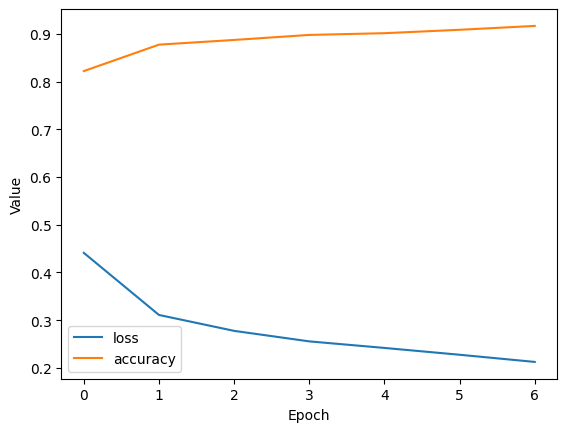

In [ ]:
def plot_learning_curves(history, metrics):
    for metric in metrics:
        plt.plot(history.history[metric], label=metric)
    plt.xlabel('Epoch')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

plot_learning_curves(history, ['loss', 'accuracy'])

In [ ]:
y_preds = (model.predict(X_test) > 0.5).astype("int32")
conf_matrix(metrics.confusion_matrix(y_test, y_preds))

78/78 [==============================] - 10s 122ms/step


### Results

In [ ]:
# 获取模型层的权重
weights = model.get_weights()

# 打印每一层的权重信息
for i in range(len(weights)):
    print("Layer", i+1, "weights shape:", weights[i].shape)
    
index_word_reverse = {index: word for word, index in word_tokenizer.word_index.items()}

import numpy as np

# 计算每个词的重要性
feature_importance = np.sum(np.abs(embedding_matrix), axis=1)

# 打印前几个具有最大重要性的词
num_top_features = 20
top_indices = np.argsort(feature_importance)[::-1][:num_top_features]
top_features = [index_word_reverse[i] for i in top_indices]

print("Top", num_top_features, "features:")
for i, feature in enumerate(top_features, 1):
    print(i, ":", feature)

Layer 1 weights shape: (7380, 100)
Layer 2 weights shape: (100, 1004)
Layer 3 weights shape: (251, 1004)
Layer 4 weights shape: (1004,)
Layer 5 weights shape: (100, 1004)
Layer 6 weights shape: (251, 1004)
Layer 7 weights shape: (1004,)
Layer 8 weights shape: (502,)
Layer 9 weights shape: (502,)
Layer 10 weights shape: (502,)
Layer 11 weights shape: (502,)
Layer 12 weights shape: (502, 251)
Layer 13 weights shape: (251,)
Layer 14 weights shape: (251, 251)
Layer 15 weights shape: (251,)
Layer 16 weights shape: (251, 1)
Layer 17 weights shape: (1,)
Top 20 features:
1 : herein
2 : expander
3 : okrug
4 : dah
5 : saucepan
6 : foodstuff
7 : yen
8 : tablespoon
9 : sodium
10 : species
11 : telegram
12 : kinase
13 : county
14 : river
15 : vowel
16 : million
17 : cup
18 : gallon
19 : protein
20 : province


In [ ]:
print("Top", num_top_features, "features:")
for i, feature in enumerate(top_features, 1):
    print(i, ":", feature)

Top 20 features:
1 : herein
2 : expander
3 : okrug
4 : dah
5 : saucepan
6 : foodstuff
7 : yen
8 : tablespoon
9 : sodium
10 : species
11 : telegram
12 : kinase
13 : county
14 : river
15 : vowel
16 : million
17 : cup
18 : gallon
19 : protein
20 : province
